<a href="https://colab.research.google.com/github/mohit-bags/Arrhythmia-Detection/blob/main/Arrythmia_3_class_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
pip install neurokit2

     |████████████████████████████████| 1.1 MB 3.9 MB/s 


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from os import listdir 
import requests
import neurokit2 as nk
import matplotlib.pyplot as plt
from os import listdir, mkdir, system
from os.path import isfile, isdir, join, exists
import json
import os
from tqdm import tqdm
from matplotlib import collections as matcoll

plt.rcParams["figure.figsize"] = (15,5)


In [ ]:
# url = 'https://figshare.com/ndownloader/files/15651296'
# r = requests.get(url, allow_redirects=True)
# open('RhythmNames.xlsx', 'wb').write(r.content)

8756

In [ ]:
# url='https://figshare.com/ndownloader/files/15653771'
# r = requests.get(url, allow_redirects=True)
# open('Diagnostics.xlsx', 'wb').write(r.content)

975796

In [6]:
# url='https://figshare.com/ndownloader/files/15652862'
# r = requests.get(url, allow_redirects=True)
# print(r.headers.get('content-type'))
# open('ECGDataDenoised.zip', 'wb').write(r.content)
!unzip /content/drive/"My Drive"/"Arrythmia "/ECGDataDenoised.zip

Streaming output truncated to the last 5000 lines.
  inflating: ECGDataDenoised/MUSE_20180116_125802_57000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125812_73000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125822_43000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125825_58000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125842_09000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125845_27000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125847_39000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125906_02000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125918_29000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125919_34000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125921_43000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125925_64000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125946_45000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_125948_54000.csv  
  inflating: ECGDataDenoised/MUSE_20180116_130000_80000.csv  
  inflating: ECGDat

In [7]:
labels = pd.read_excel('/content/drive/MyDrive/Arrythmia /Diagnostics.xlsx')

In [8]:
labels=labels[(labels['Rhythm']=='AFIB') | (labels['Rhythm']=='AF') |(labels['Rhythm']=='SR')]
labels.reset_index(inplace=True,drop=True)

In [9]:
labels['Rhythm'].value_counts()

SR      1826
AFIB    1780
AF       445
Name: Rhythm, dtype: int64

In [10]:
labels

,FileName,Rhythm,Beat,PatientAge,Gender,VentricularRate,AtrialRate,QRSDuration,QTInterval,QTCorrected,RAxis,TAxis,QRSCount,QOnset,QOffset,TOffset
0,MUSE_20180113_171327_27000,AFIB,RBBB TWC,85,MALE,117,234,114,356,496,81,-27,19,208,265,386
1,MUSE_20180112_122850_57000,AF,STDD STTC,73,FEMALE,162,162,114,252,413,68,-40,26,228,285,354
2,MUSE_20180114_075026_69000,AFIB,TWC,80,FEMALE,98,86,74,360,459,69,83,17,215,252,395
3,MUSE_20180209_172046_21000,SR,NONE,46,MALE,63,63,90,376,384,24,38,11,221,266,409
4,MUSE_20180113_133901_16000,AFIB,STTC,67,FEMALE,72,65,90,416,455,-1,-15,12,228,273,436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4046,MUSE_20180210_123100_20000,SR,TWC,57,FEMALE,68,68,96,400,425,18,60,11,210,258,410
4047,MUSE_20180115_131040_20000,AFIB,TWC,81,FEMALE,70,63,90,566,611,74,-70,12,221,266,504
4048,MUSE_20180209_132228_29000,SR,NONE,71,FEMALE,90,90,68,360,440,70,48,15,226,260,406
4049,MUSE_20180116_170450_55000,AFIB,LVQRSLL RBBB,74,MALE,75,80,134,402,448,178,6,13,197,264,398


In [11]:
afib_files = labels[labels['Rhythm']=="AFIB"]['FileName'].tolist()
nsr_files = labels[labels['Rhythm']=="SR"]['FileName'].tolist()
afl_files = labels[labels['Rhythm']=="AF"]['FileName'].tolist()

In [12]:
print(len(afib_files),len(nsr_files),len(afl_files))

1780 1826 445


In [13]:
afib_files[0]

'MUSE_20180113_171327_27000'

In [14]:
def plot_rr(rrintervals,rr_diff):
  x = rrintervals/500
  y = rr_diff
  lines = []
  for i in range(len(x)):
      pair=[(x[i],0), (x[i], y[i])]
      lines.append(pair)

  linecoll = matcoll.LineCollection(lines)
  fig, ax = plt.subplots()
  ax.add_collection(linecoll)

  plt.scatter(x,y)
  plt.xticks(x)
  plt.xlabel("Time (s)")
  plt.ylim(0,1)
  plt.title("RR Peaks")
  plt.show()

In [58]:

def detect_r_peaks(patient_list,showplots=False):
    parent_folder = '/content/ECGDataDenoised/'
    total_r_peaks=0
    for i in tqdm(patient_list):
      try:
        data = parent_folder+i+".csv"
        
        df = pd.read_csv(data,header=None)
        df.columns=['I','II','III','aVR','aVL','aVF','V1','V2','V3','V4','V5','V6']
        
        cols = df.columns
        df[cols[:-1]] = df[cols[:-1]].apply(pd.to_numeric, errors='coerce') 

        # Extract R-peaks locations
        _, rpeaks = nk.ecg_peaks(df["aVL"][1:], sampling_rate=500)

        # Visualize R-peaks in ECG signal
        
        total_r_peaks+=len(rpeaks['ECG_R_Peaks'])
        rrintervals = rpeaks['ECG_R_Peaks']
        rr_diff=[0]
        for i in range(1,len(rrintervals)):
          rr_diff.append((rrintervals[i]-rrintervals[i-1])/1000)
        if(showplots):
          plot = (nk.events_plot(rpeaks['ECG_R_Peaks'], df["aVL"]))
          plot_rr(rrintervals,rr_diff)
      except:
        print("\nError in:",i)
    print("\n")
    return total_r_peaks#number of peaks

In [ ]:
print(len(afib_files))
afib_r_peaks=detect_r_peaks(afib_files)
print(afib_r_peaks)

1780


 14%|█▎        | 244/1780 [00:05<00:33, 46.12it/s]


Error in: MUSE_20180712_160855_39000


100%|██████████| 1780/1780 [00:41<00:00, 43.25it/s]



26772


  0%|          | 0/15 [00:00<?, ?it/s]

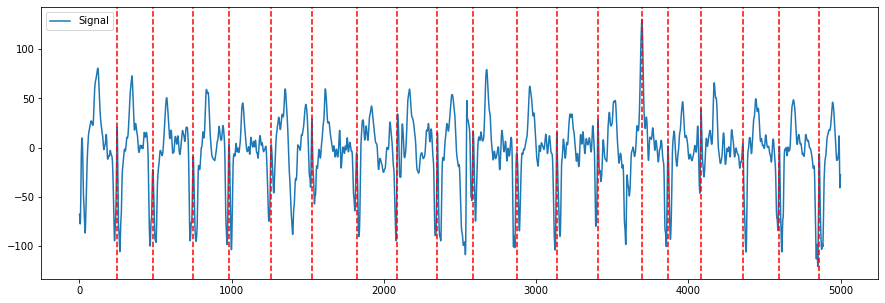

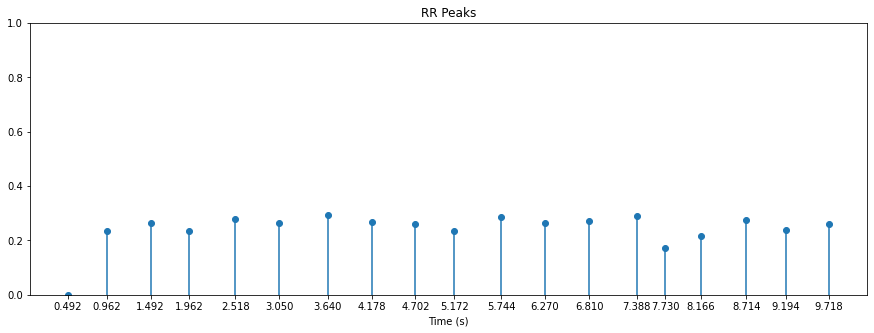

  7%|▋         | 1/15 [00:00<00:09,  1.40it/s]

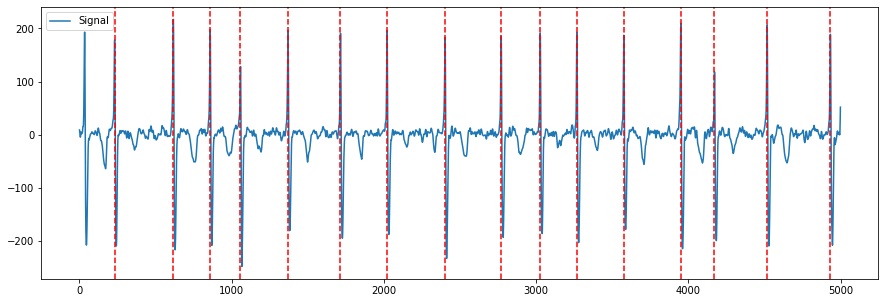

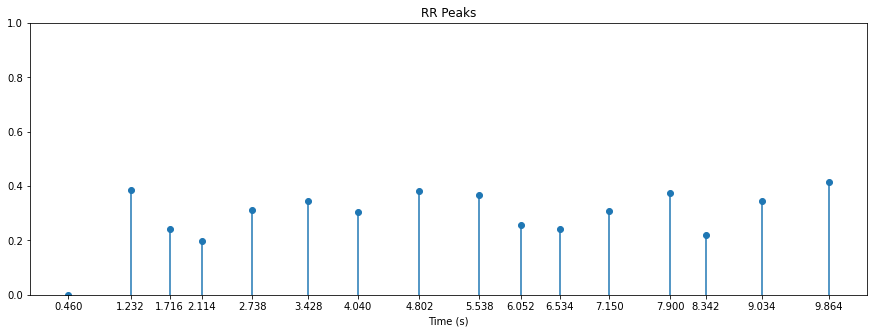

 13%|█▎        | 2/15 [00:01<00:07,  1.69it/s]

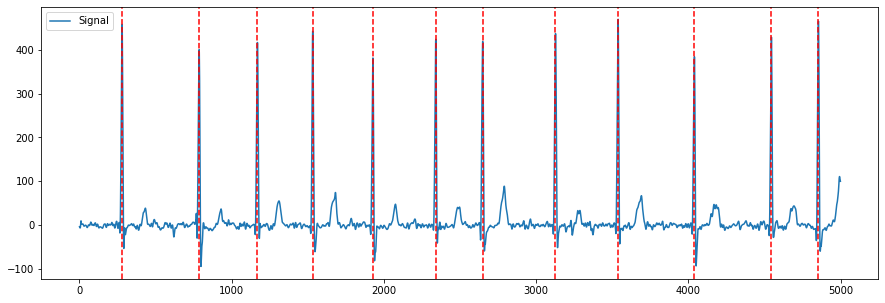

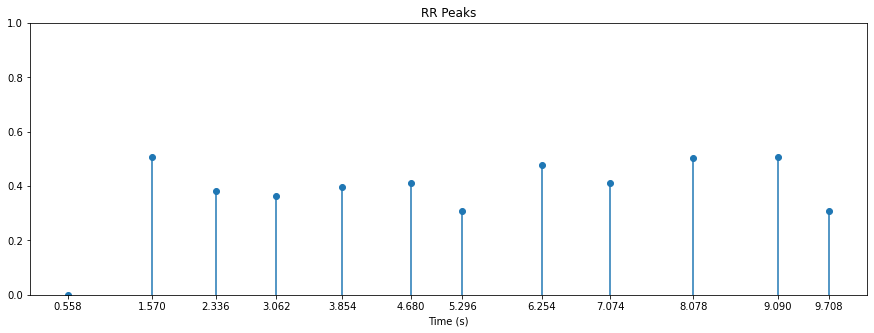

 20%|██        | 3/15 [00:01<00:06,  1.88it/s]

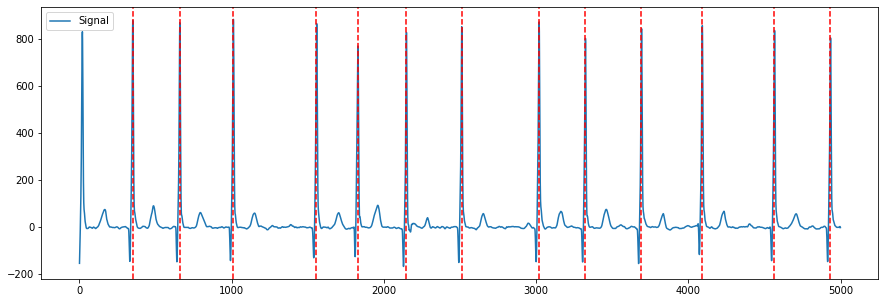

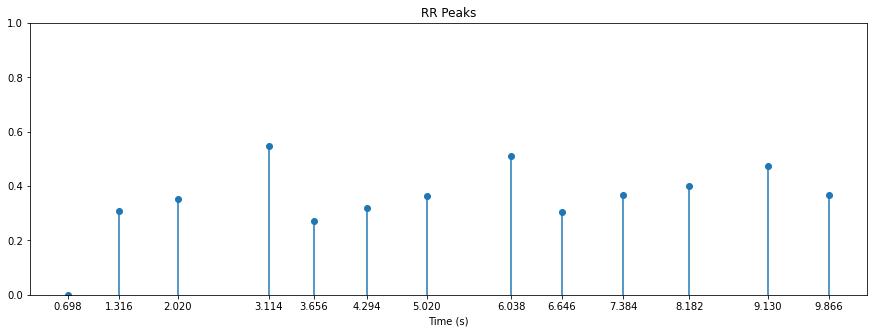

 27%|██▋       | 4/15 [00:02<00:05,  1.96it/s]

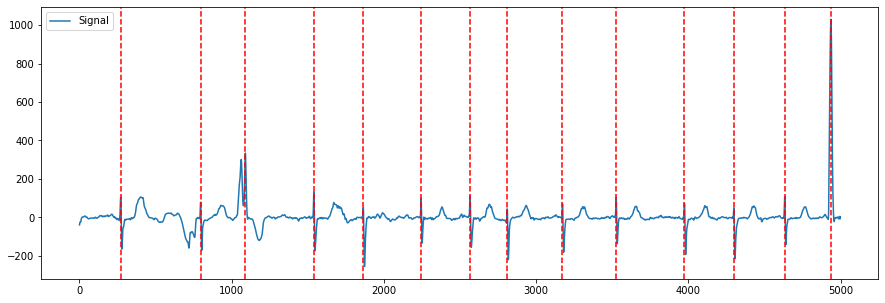

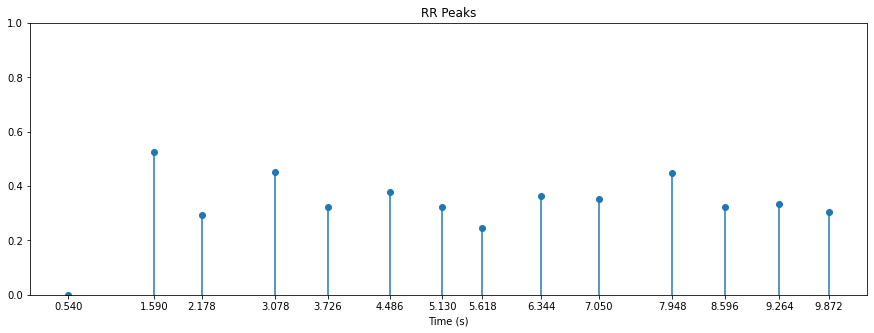

 33%|███▎      | 5/15 [00:02<00:04,  2.03it/s]

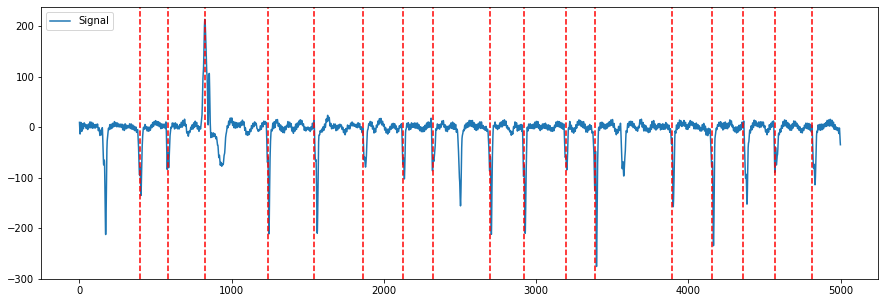

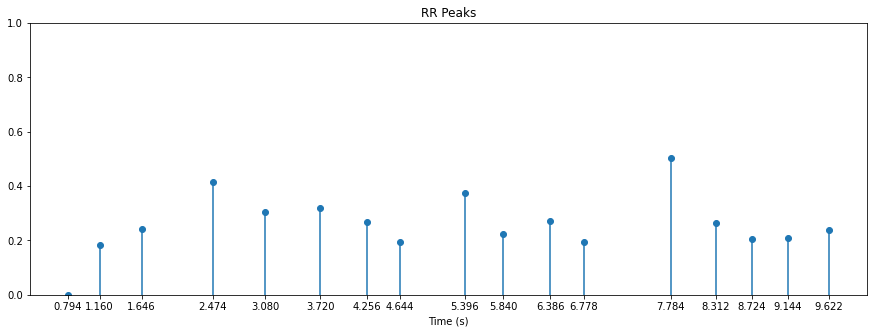

 40%|████      | 6/15 [00:03<00:04,  2.06it/s]

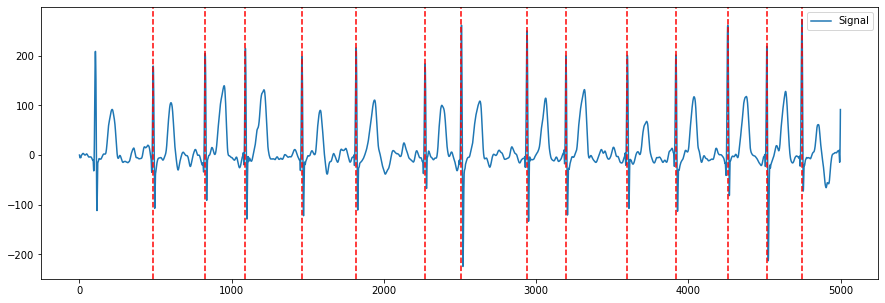

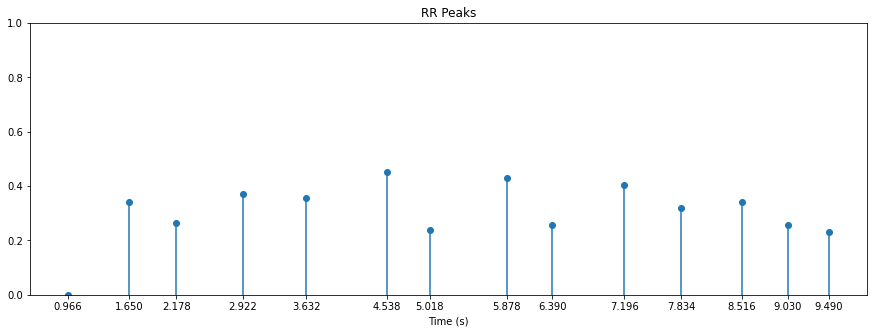

 47%|████▋     | 7/15 [00:03<00:03,  2.11it/s]

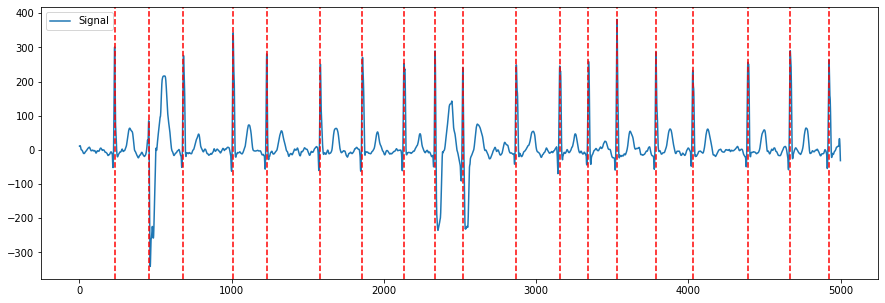

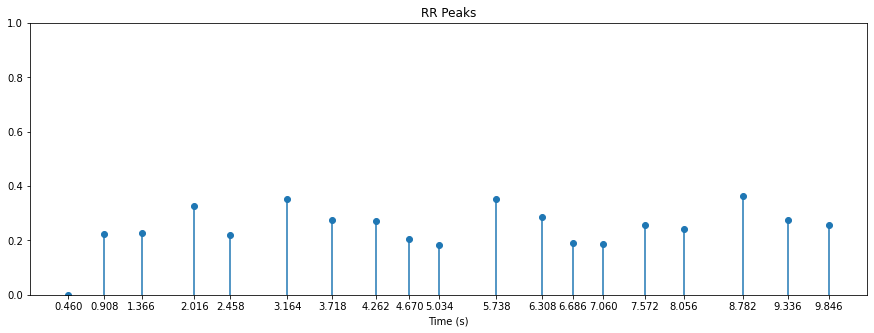

 53%|█████▎    | 8/15 [00:04<00:03,  2.08it/s]

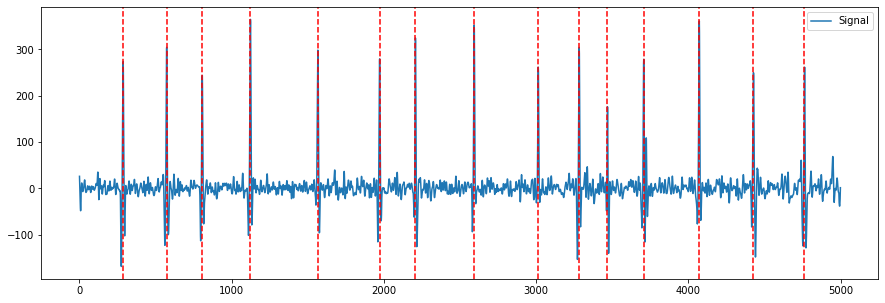

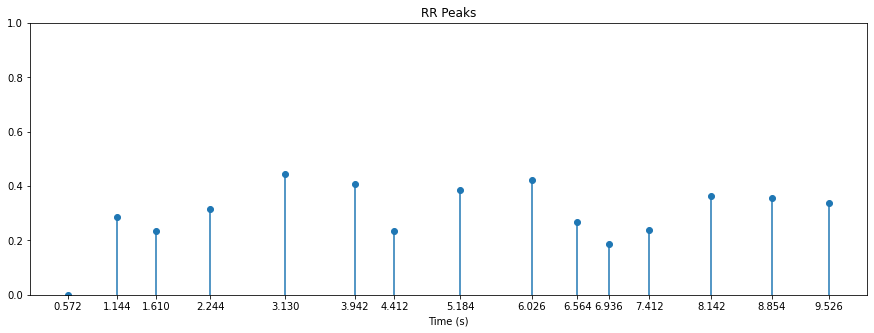

 60%|██████    | 9/15 [00:04<00:03,  1.83it/s]

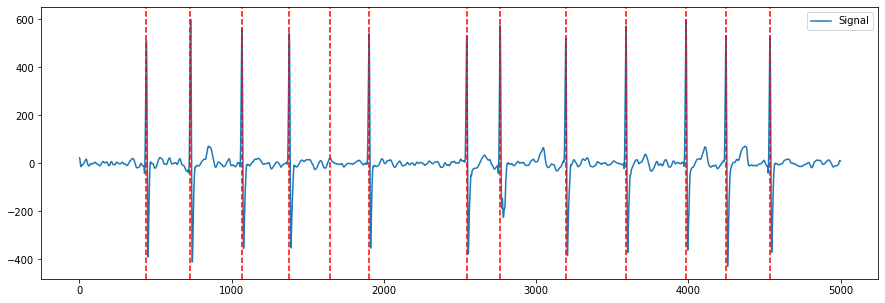

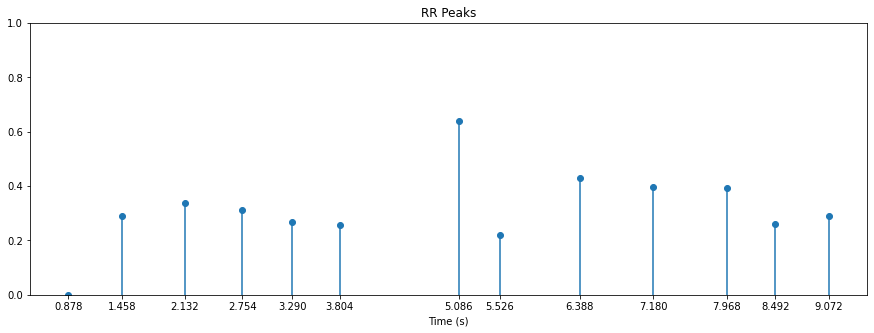

 67%|██████▋   | 10/15 [00:05<00:02,  1.93it/s]

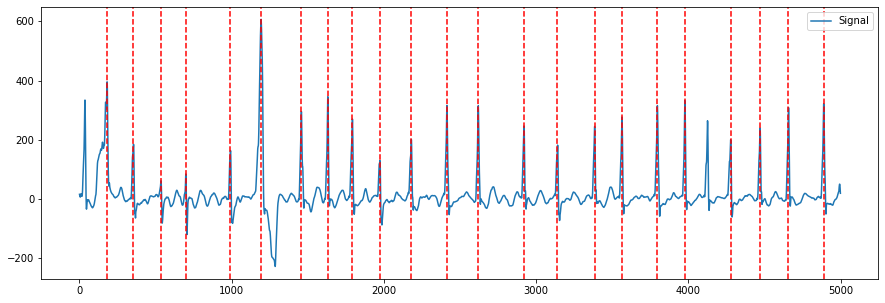

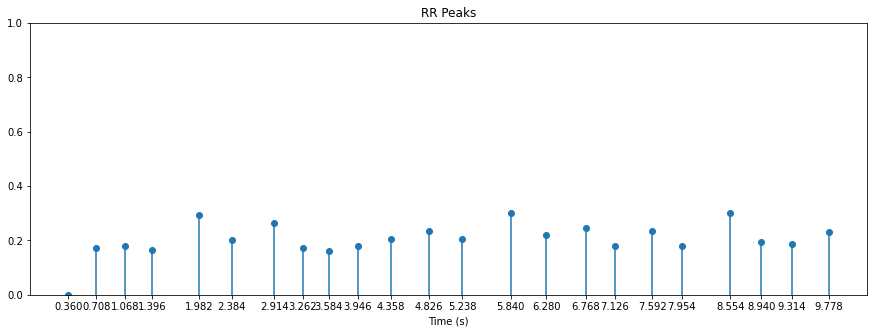

 73%|███████▎  | 11/15 [00:05<00:02,  1.92it/s]

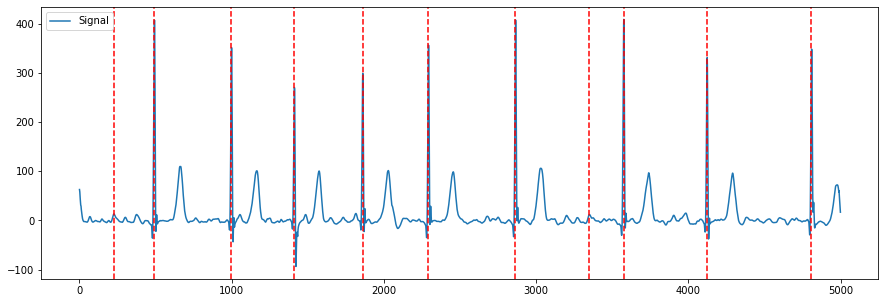

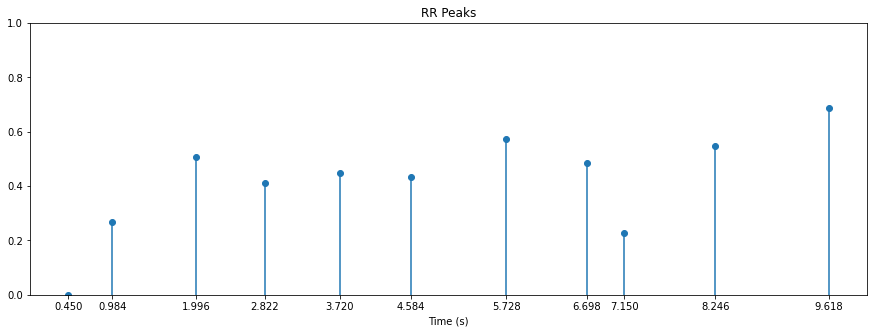

 80%|████████  | 12/15 [00:06<00:01,  2.00it/s]

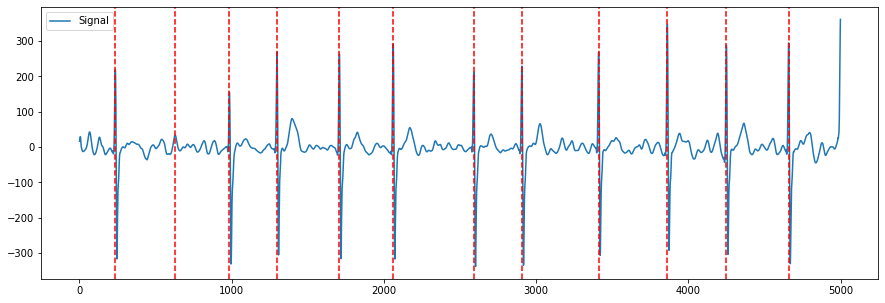

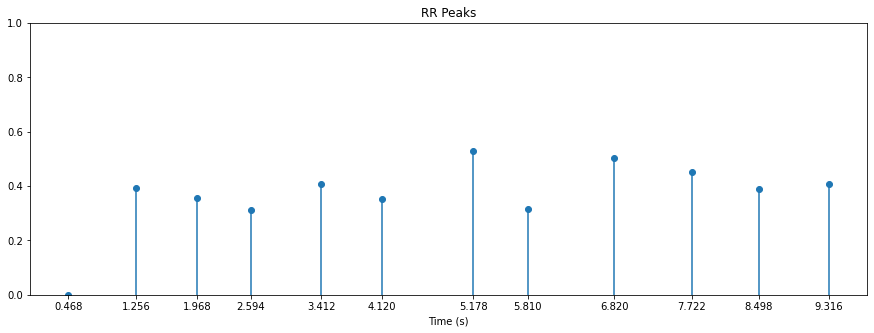

 87%|████████▋ | 13/15 [00:06<00:00,  2.03it/s]

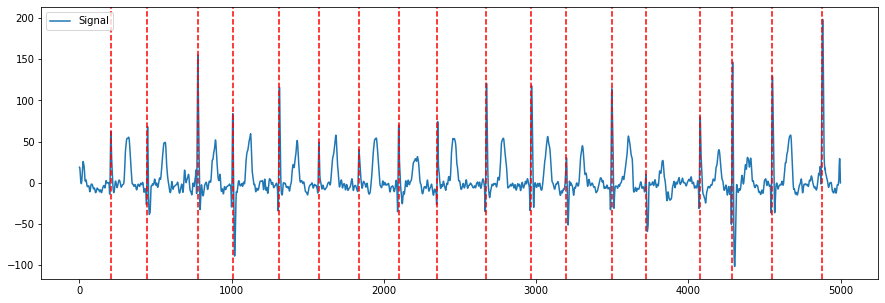

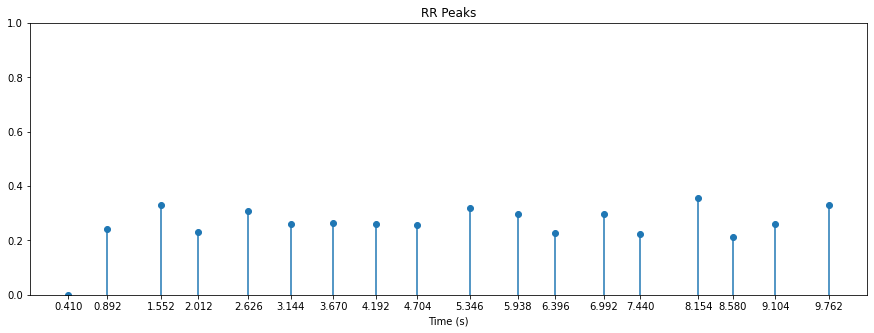

 93%|█████████▎| 14/15 [00:07<00:00,  1.99it/s]

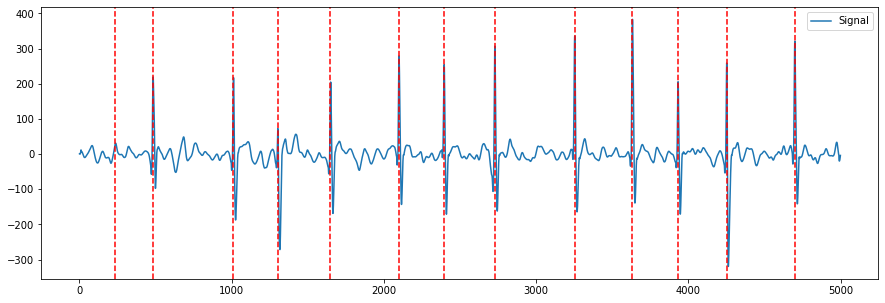

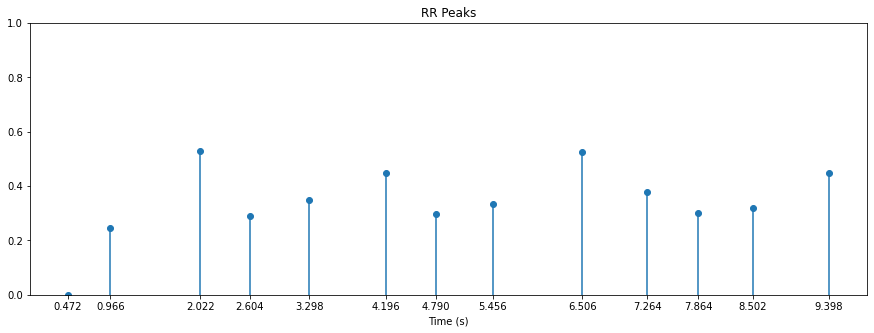

100%|██████████| 15/15 [00:07<00:00,  1.96it/s]

229

In [59]:
detect_r_peaks(afib_files[:15],True)


In [ ]:
print(len(afl_files))
afl_r_peaks=detect_r_peaks(afl_files)
print(afl_r_peaks)

445


 75%|███████▌  | 334/445 [00:12<00:03, 27.81it/s]


Error in: MUSE_20180112_134829_78000


100%|██████████| 445/445 [00:16<00:00, 26.65it/s]



7887


  0%|          | 0/15 [00:00<?, ?it/s]

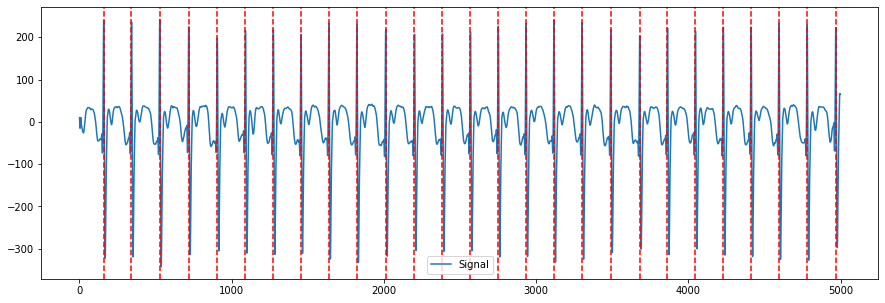

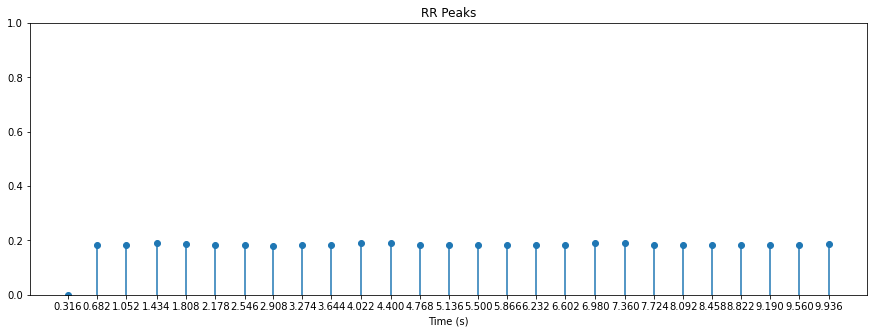

  7%|▋         | 1/15 [00:01<00:16,  1.19s/it]

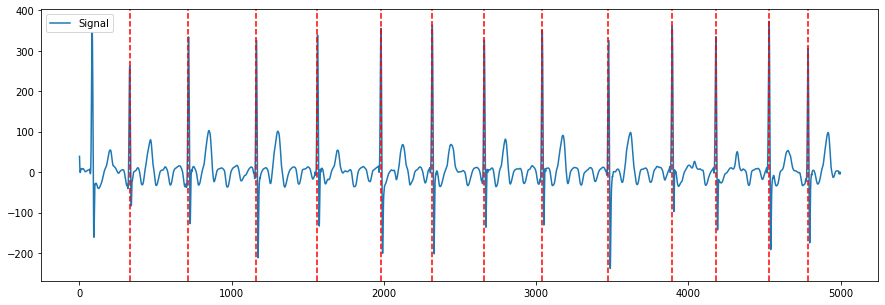

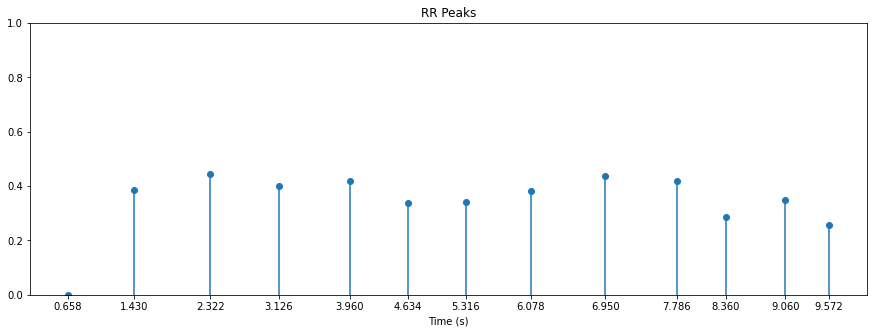

 13%|█▎        | 2/15 [00:01<00:09,  1.31it/s]

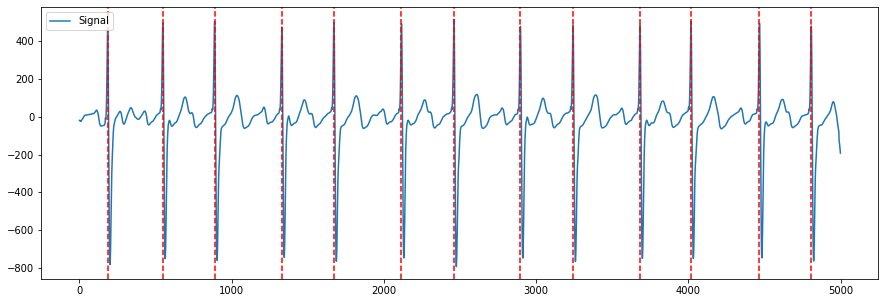

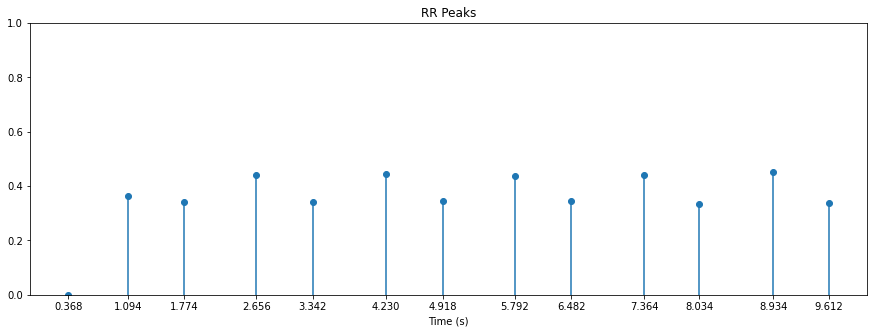

 20%|██        | 3/15 [00:02<00:07,  1.55it/s]

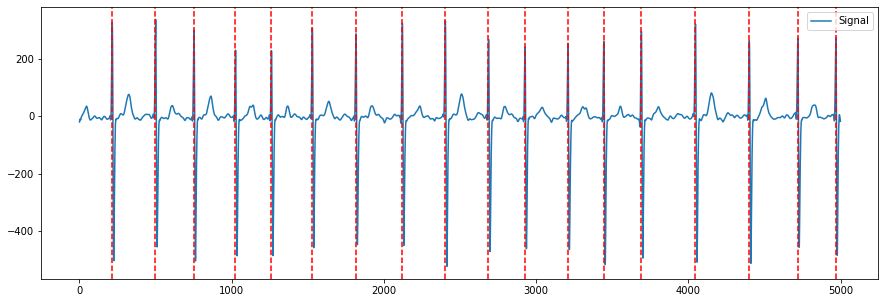

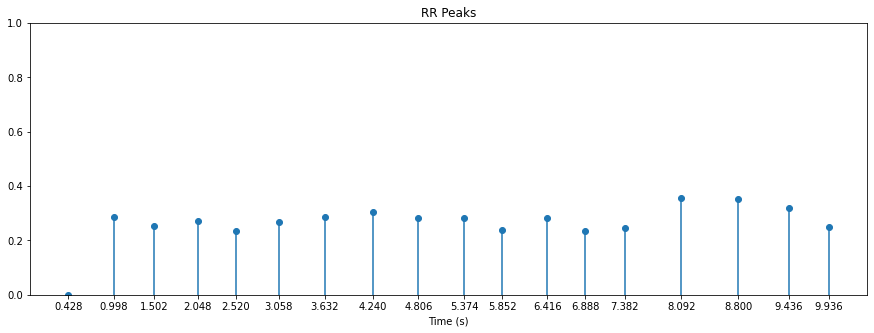

 27%|██▋       | 4/15 [00:02<00:06,  1.66it/s]

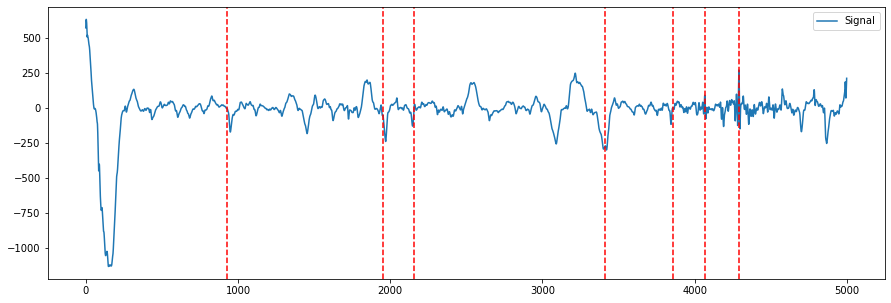

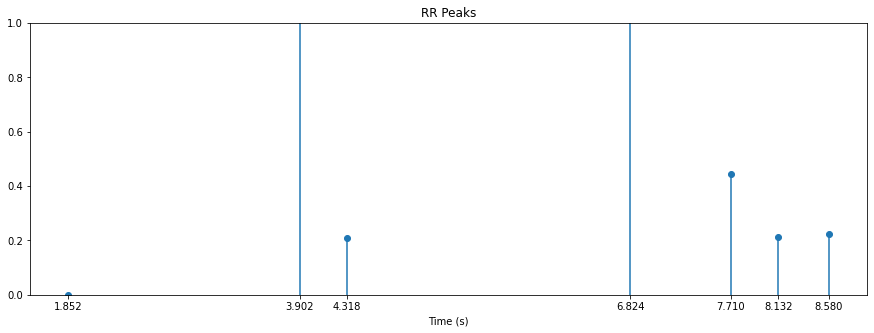

 33%|███▎      | 5/15 [00:03<00:05,  1.84it/s]

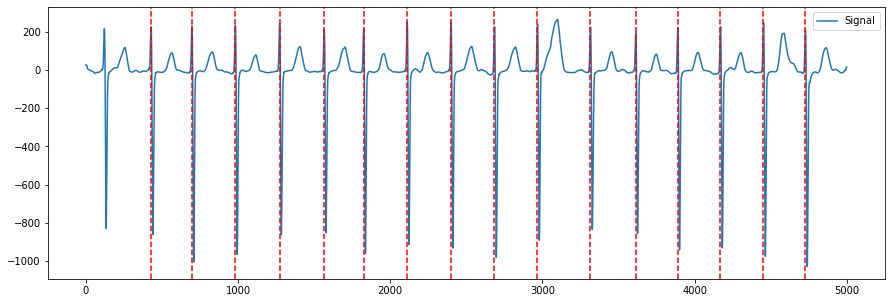

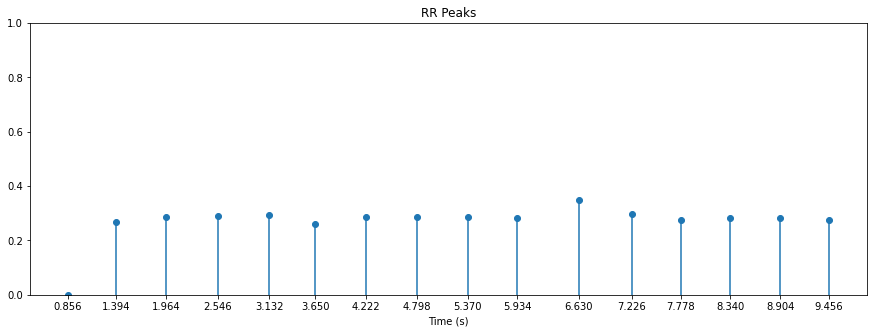

 40%|████      | 6/15 [00:03<00:04,  1.91it/s]

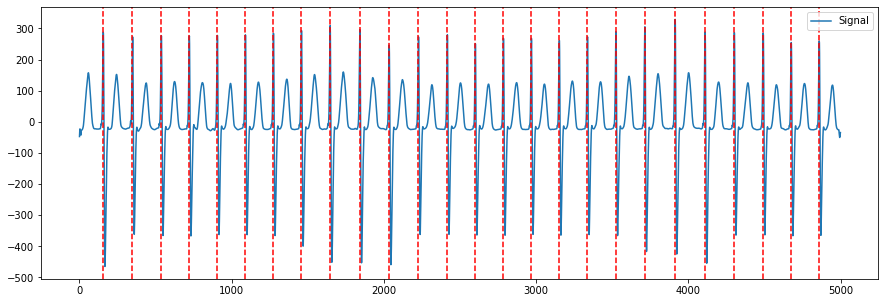

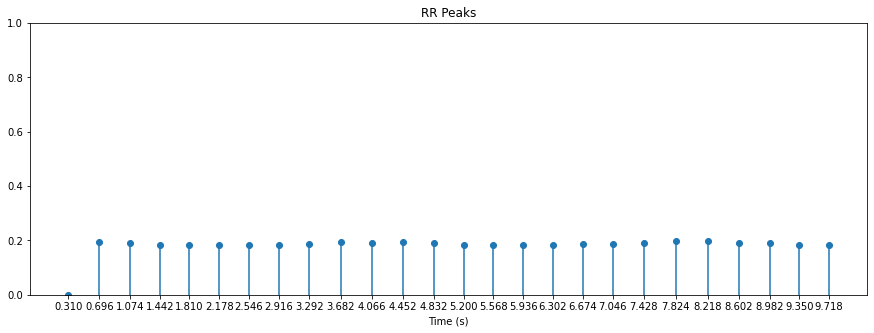

 47%|████▋     | 7/15 [00:04<00:04,  1.81it/s]

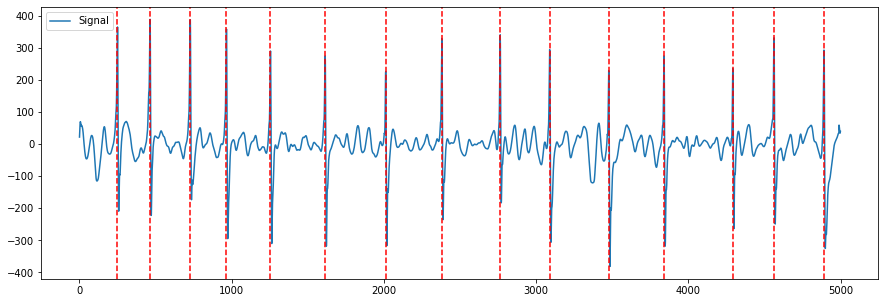

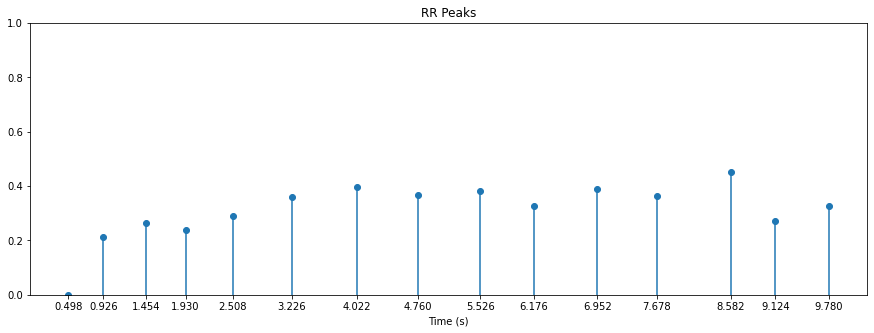

 53%|█████▎    | 8/15 [00:04<00:03,  1.86it/s]

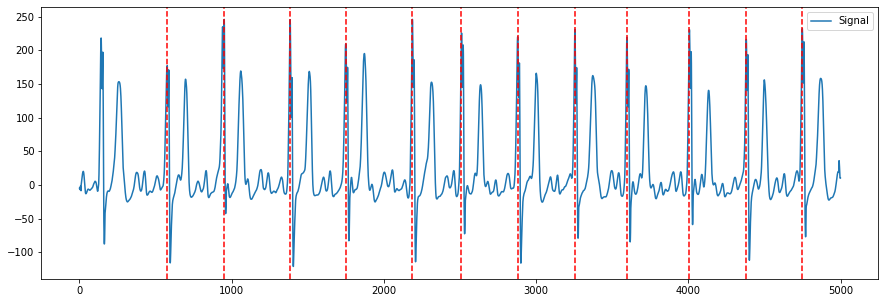

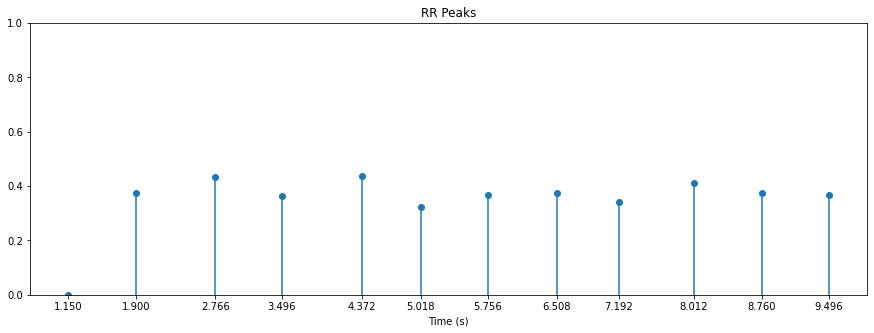

 60%|██████    | 9/15 [00:05<00:03,  1.92it/s]

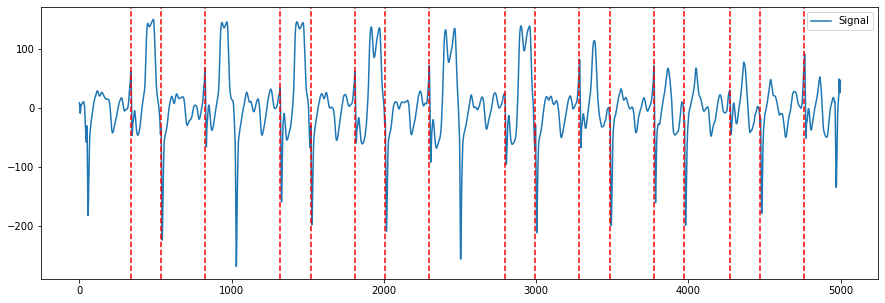

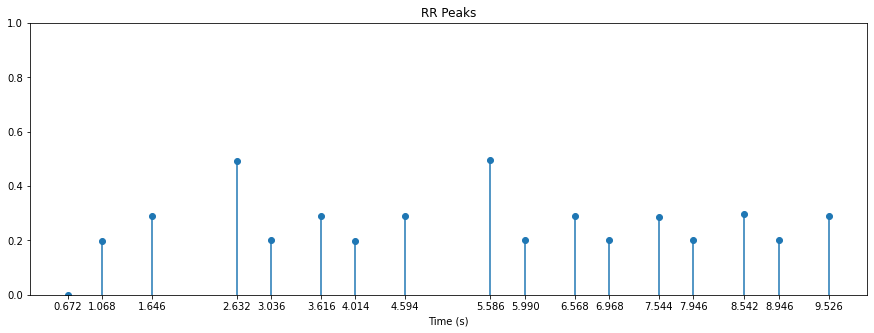

 67%|██████▋   | 10/15 [00:05<00:02,  1.75it/s]

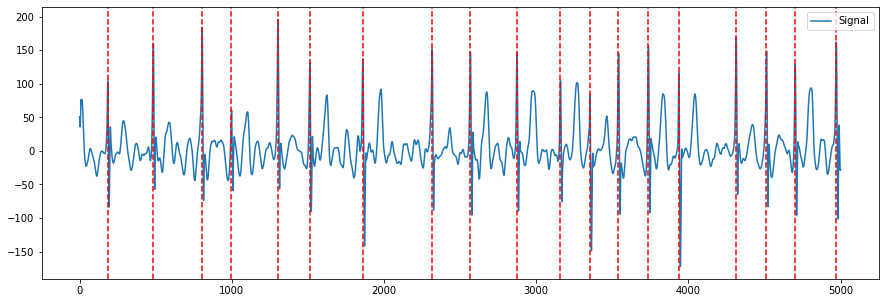

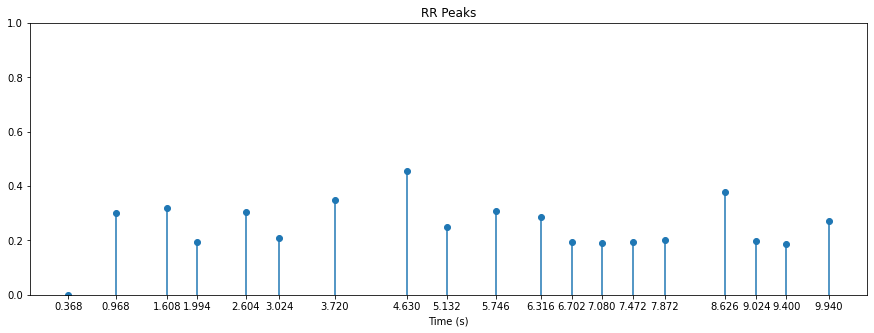

 73%|███████▎  | 11/15 [00:06<00:02,  1.77it/s]

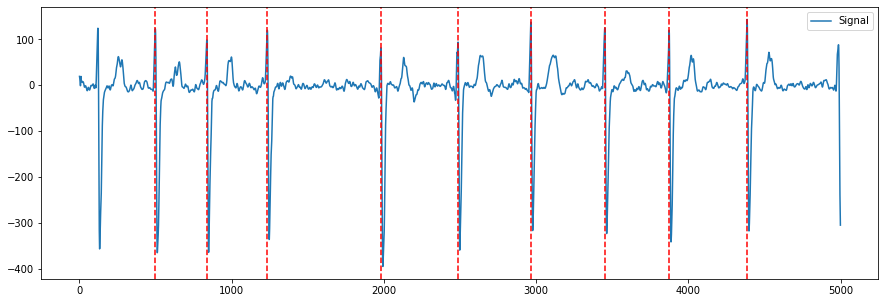

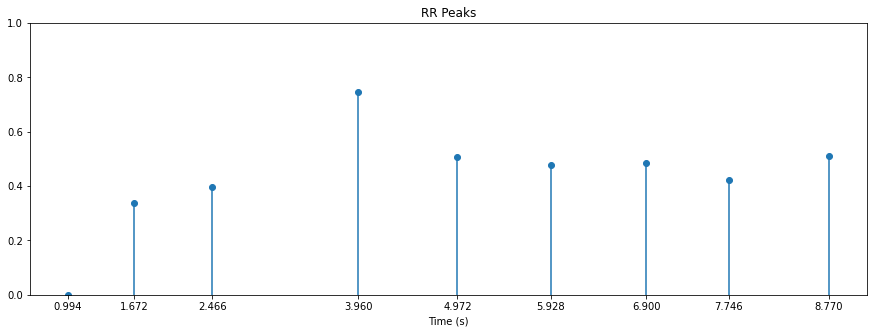

 80%|████████  | 12/15 [00:06<00:01,  1.90it/s]

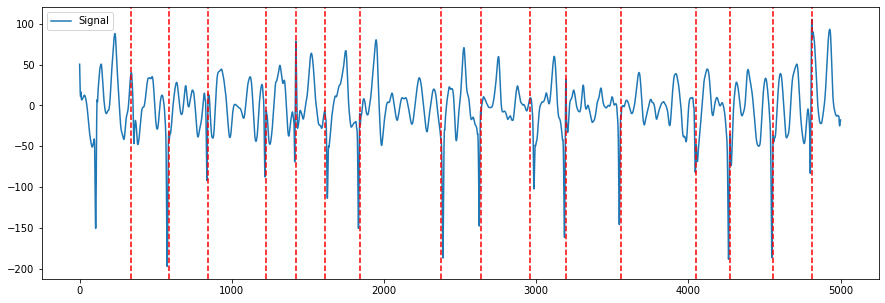

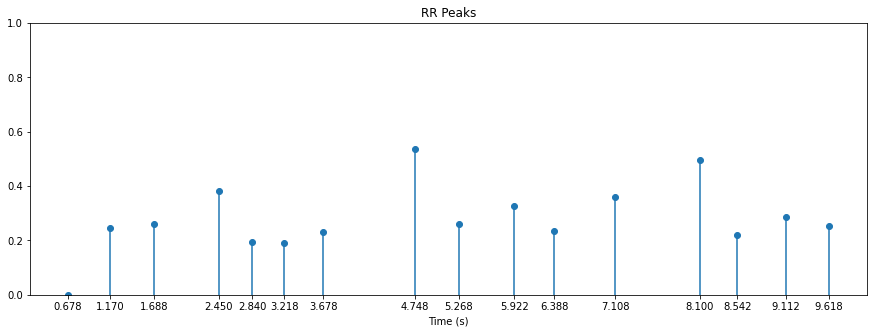

 87%|████████▋ | 13/15 [00:07<00:01,  1.92it/s]

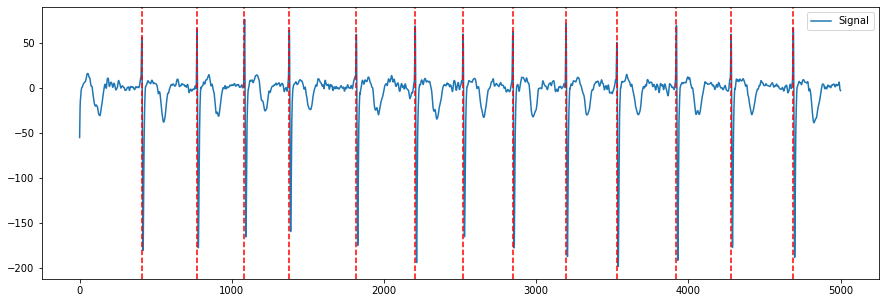

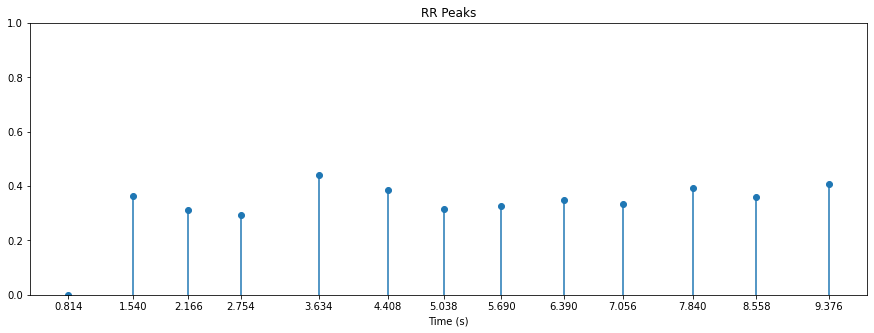

 93%|█████████▎| 14/15 [00:07<00:00,  1.98it/s]

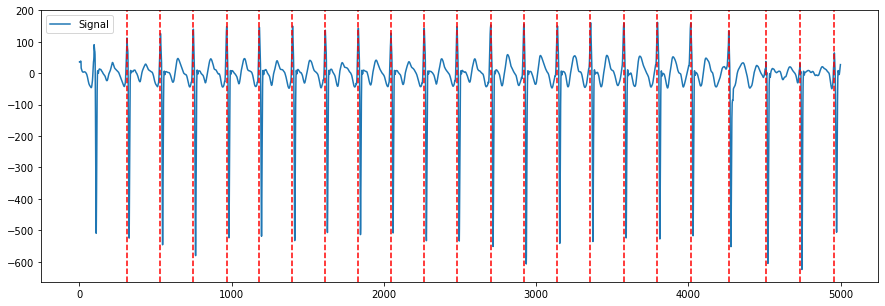

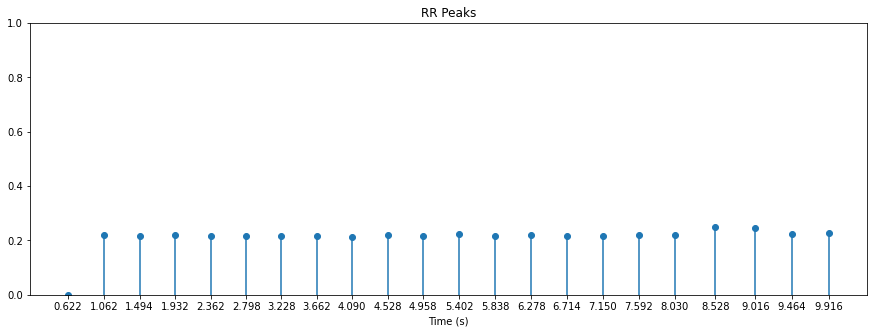

100%|██████████| 15/15 [00:08<00:00,  1.78it/s]

243

In [ ]:
detect_r_peaks(afl_files[:15],True)


In [ ]:
print(len(nsr_files))
nsr_r_peaks=detect_r_peaks(nsr_files)
print(nsr_r_peaks)

1826


 69%|██████▉   | 1264/1826 [00:49<00:13, 41.65it/s]


Error in: MUSE_20180210_125924_43000


100%|██████████| 1826/1826 [01:03<00:00, 28.65it/s]



22320


  0%|          | 0/15 [00:00<?, ?it/s]

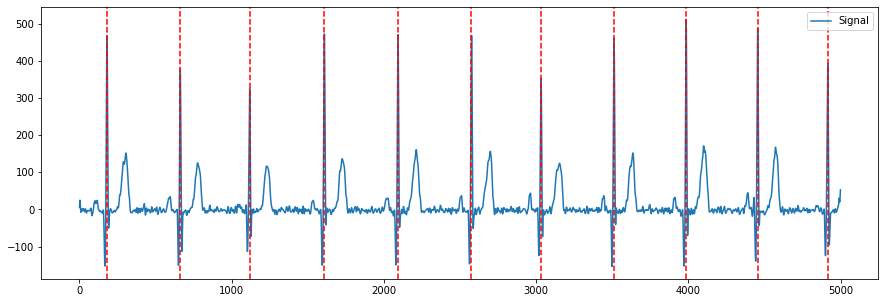

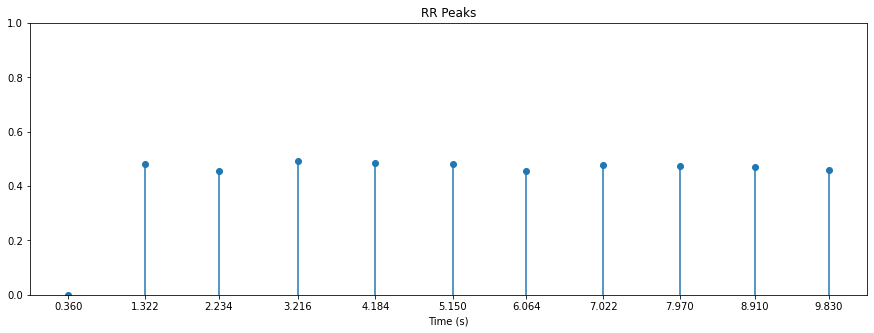

  7%|▋         | 1/15 [00:00<00:07,  1.93it/s]

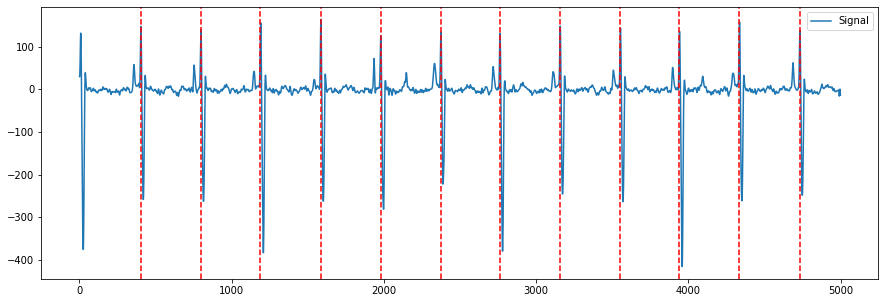

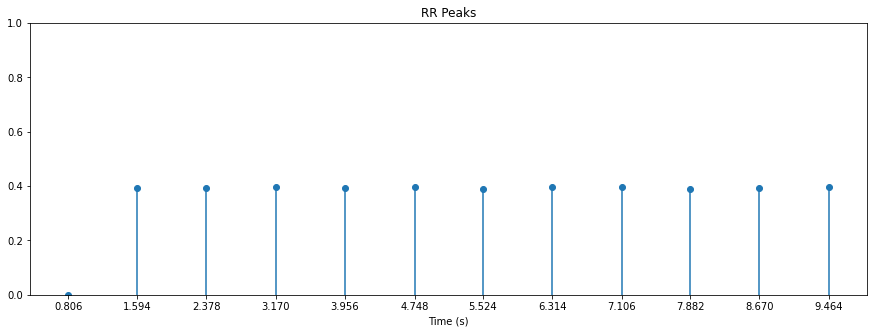

 13%|█▎        | 2/15 [00:00<00:06,  2.02it/s]

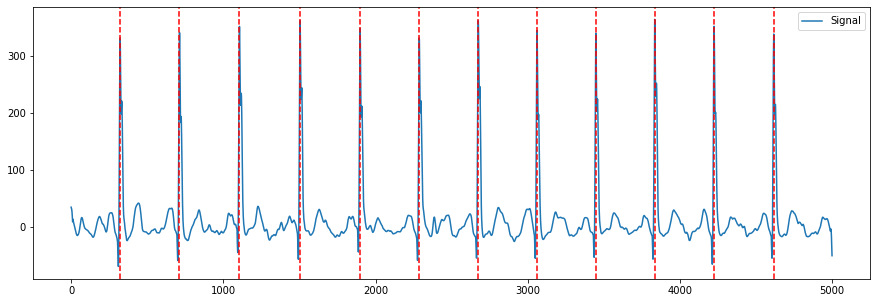

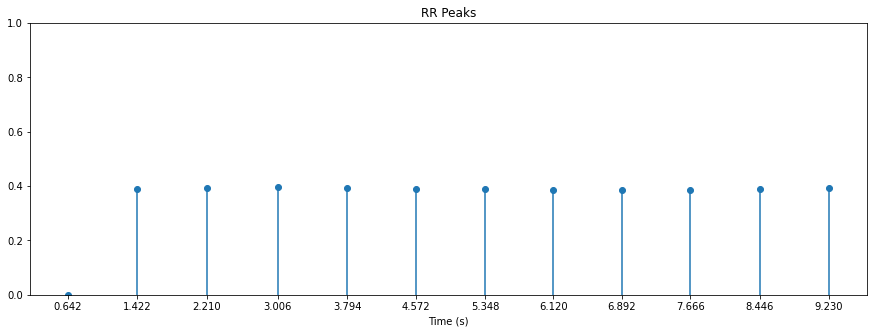

 20%|██        | 3/15 [00:01<00:06,  1.78it/s]

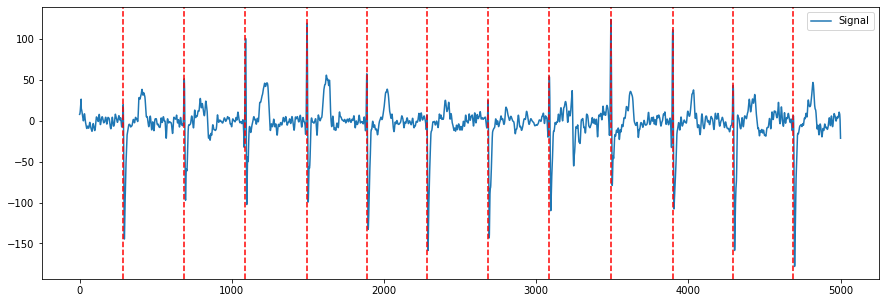

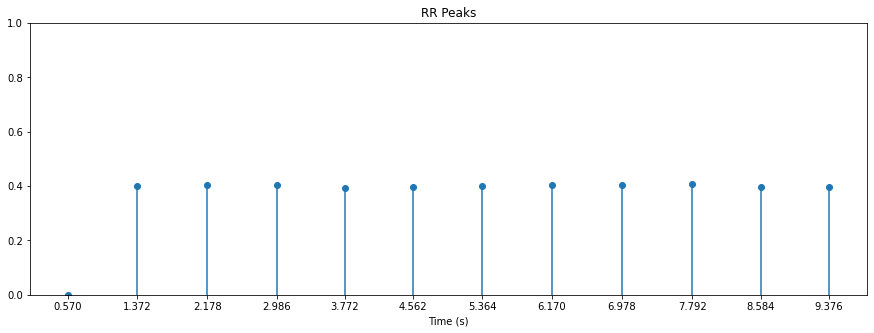

 27%|██▋       | 4/15 [00:02<00:05,  1.91it/s]

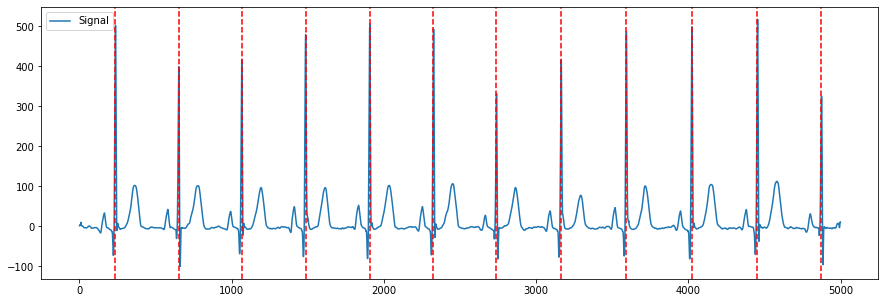

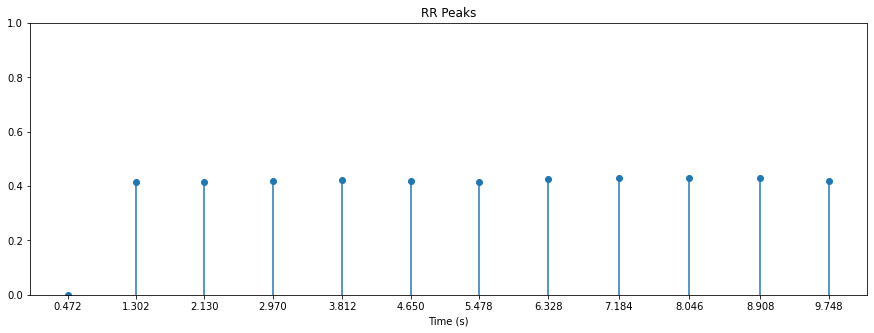

 33%|███▎      | 5/15 [00:02<00:05,  1.98it/s]

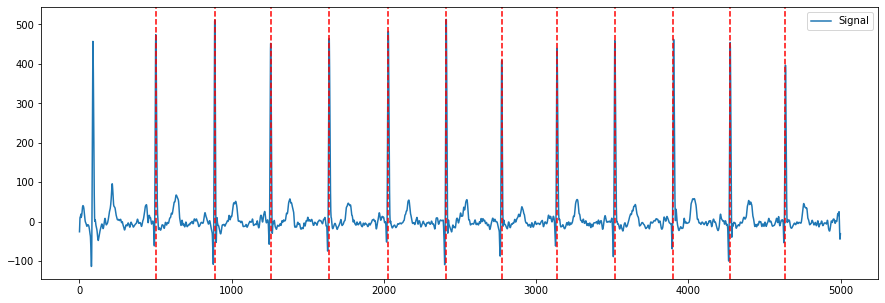

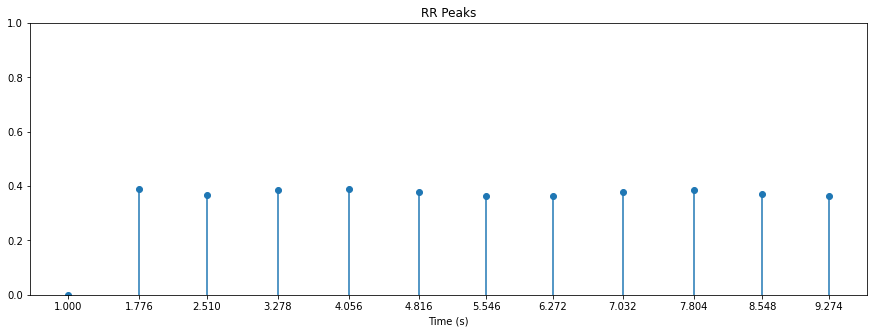

 40%|████      | 6/15 [00:03<00:04,  2.00it/s]

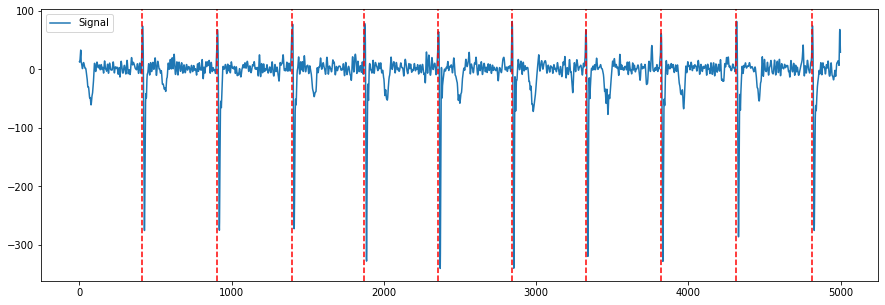

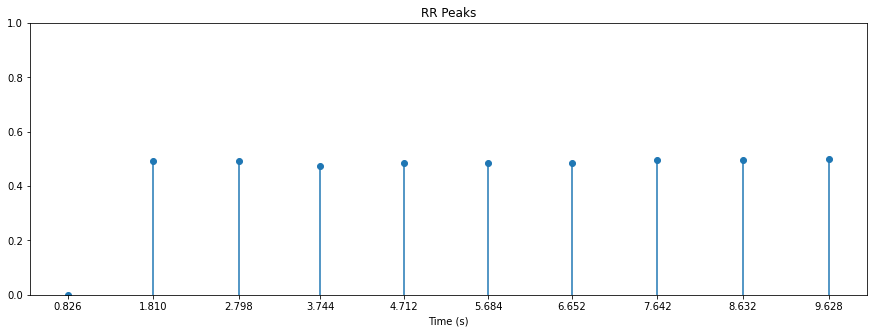

 47%|████▋     | 7/15 [00:03<00:03,  2.08it/s]

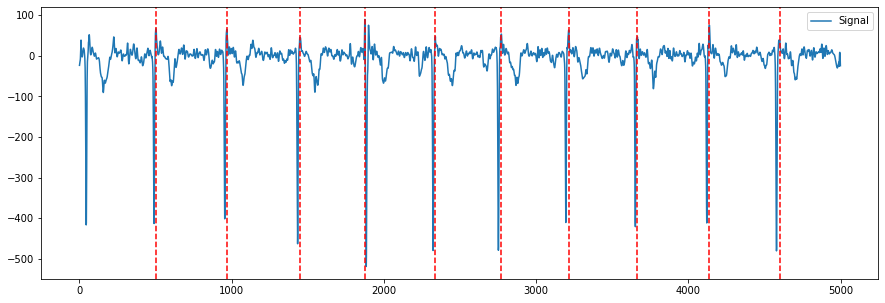

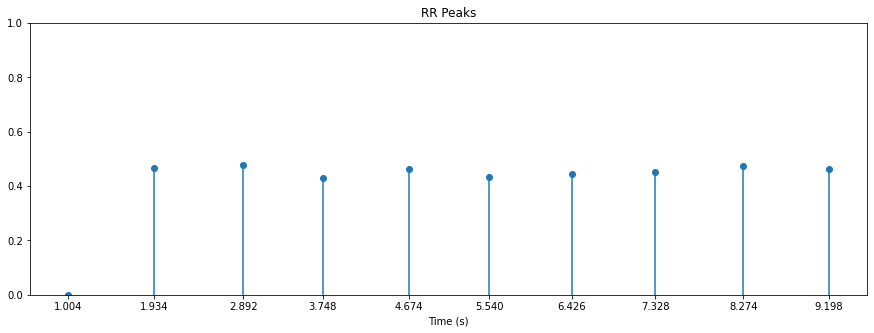

 53%|█████▎    | 8/15 [00:03<00:03,  2.10it/s]

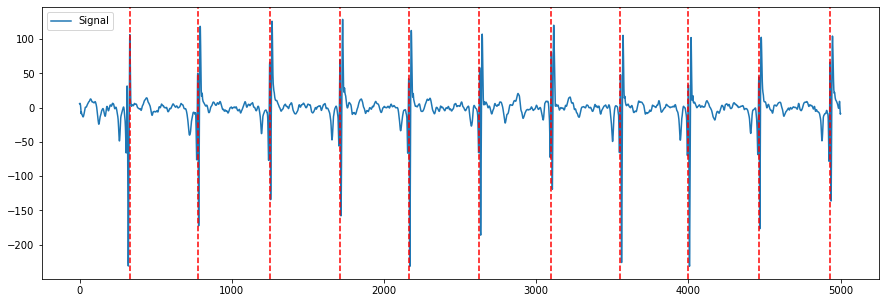

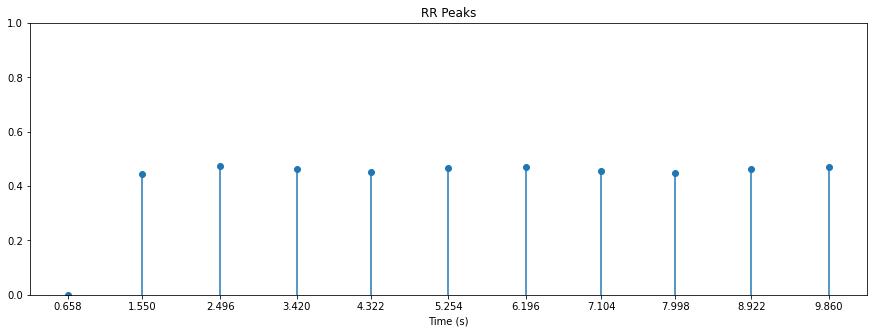

 60%|██████    | 9/15 [00:04<00:02,  2.12it/s]

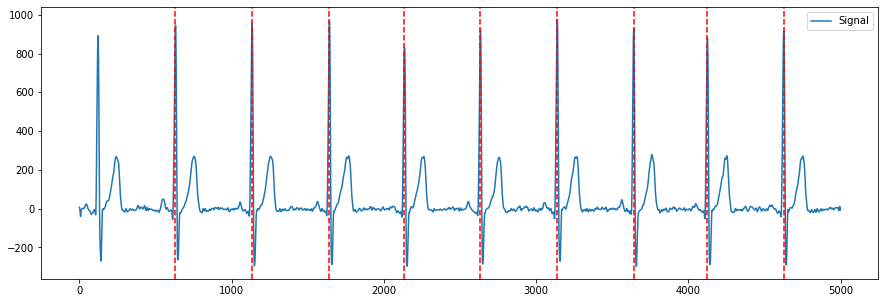

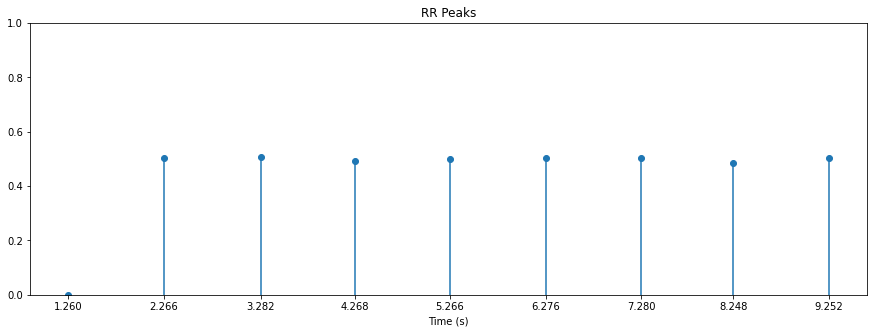

 67%|██████▋   | 10/15 [00:04<00:02,  2.14it/s]

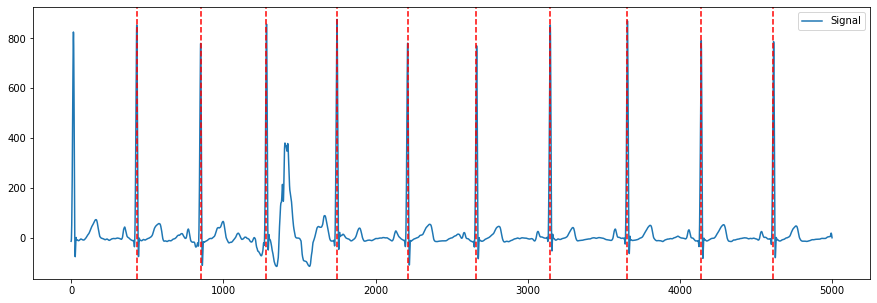

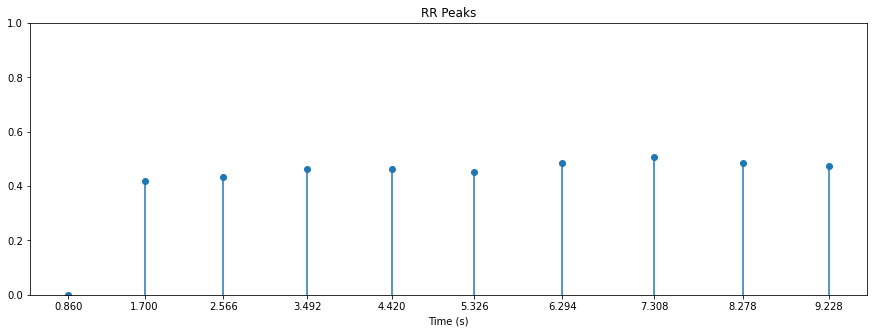

 73%|███████▎  | 11/15 [00:05<00:01,  2.17it/s]

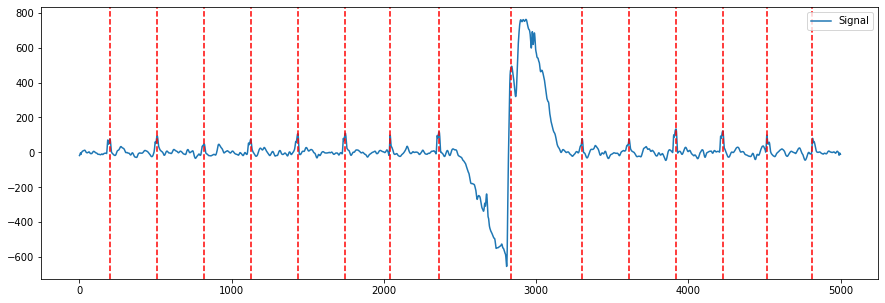

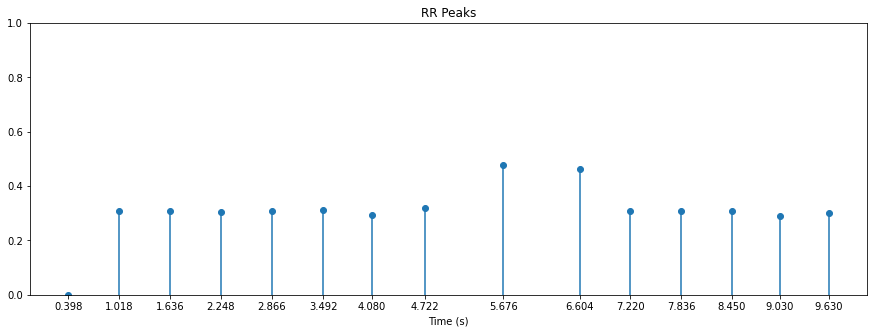

 80%|████████  | 12/15 [00:06<00:01,  1.89it/s]

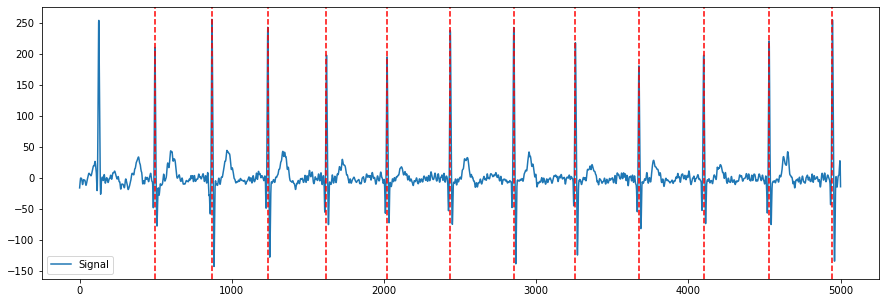

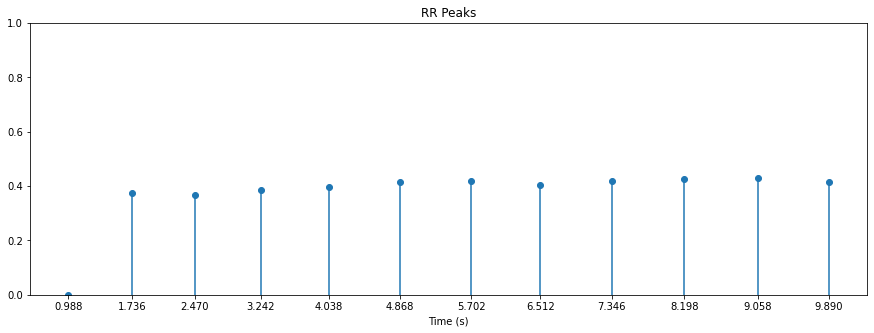

 87%|████████▋ | 13/15 [00:06<00:01,  1.91it/s]

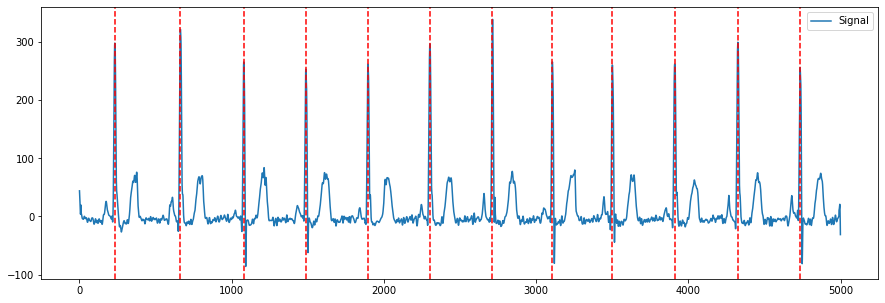

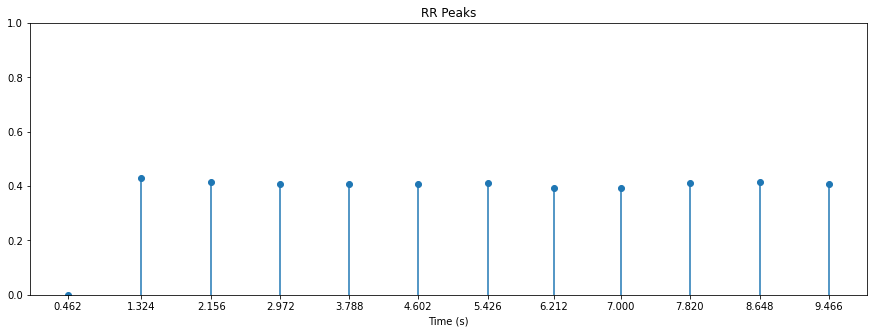

 93%|█████████▎| 14/15 [00:07<00:00,  1.93it/s]

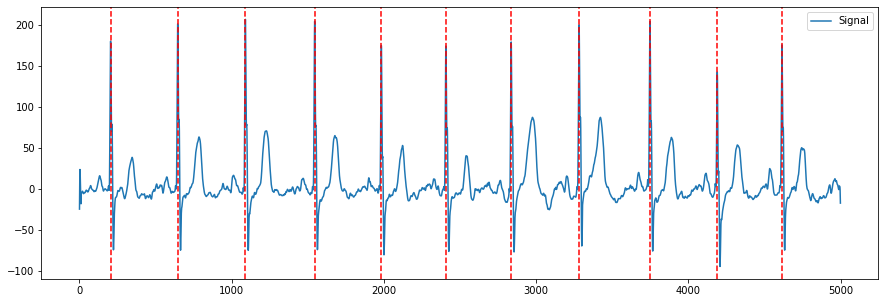

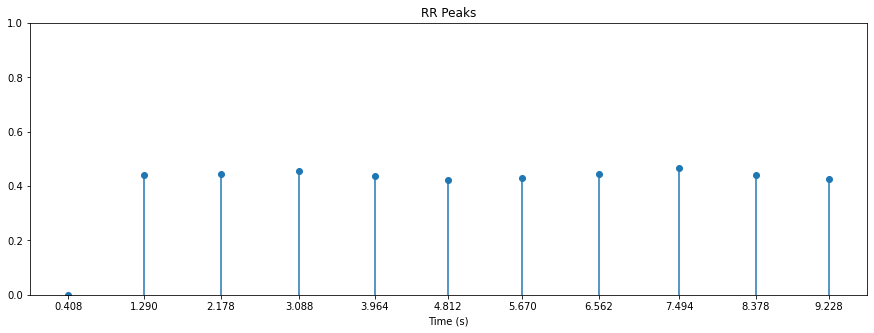

100%|██████████| 15/15 [00:07<00:00,  1.99it/s]

171

In [ ]:
detect_r_peaks(nsr_files[:15],True)


In [ ]:
print(nsr_r_peaks+afl_r_peaks+afib_r_peaks)

56979


No. of R peaks: 11


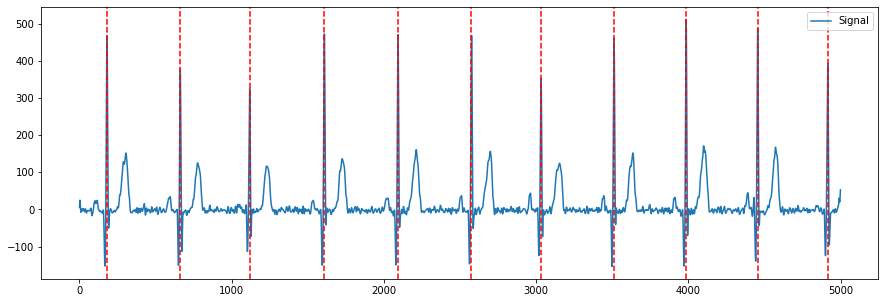

In [20]:
parent_folder="/content/ECGDataDenoised/"
# file=parent_folder+"MUSE_20180712_160855_39000"+".csv" ### issue
file=parent_folder+nsr_files[0]+".csv"
df = pd.read_csv(file,header=None)
df.columns=['I','II','III','aVR','aVL','aVF','V1','V2','V3','V4','V5','V6']
cols = df.columns
df[cols[:-1]] = df[cols[:-1]].apply(pd.to_numeric, errors='coerce') 
df.reset_index(inplace=True,drop=True)

# Extract R-peaks locations
_, rpeaks = nk.ecg_peaks(df["aVL"][1:], sampling_rate=500)
print("No. of R peaks:",len(rpeaks['ECG_R_Peaks']))
# Visualize R-peaks in ECG signal
plot = (nk.events_plot(rpeaks['ECG_R_Peaks'], df["aVL"]))

In [17]:
df

,I,II,III,aVR,aVL,aVF,V1,V2,V3,V4,V5,V6
0,9.1276,13.9240,7.4245,-11.056,5.2441,13.8060,-6.26590,24.745,14.5530,6.2594,26.266,-95.902
1,17.6100,9.6371,-5.2646,-12.522,15.1110,5.0597,-9.99350,22.975,10.3420,6.0545,20.687,-96.762
2,23.6780,6.1686,-14.7220,-13.417,22.2860,-1.6365,-12.54200,21.914,7.4108,6.1513,16.546,-96.401
3,25.6000,4.2362,-18.4980,-13.348,24.7720,-4.6864,-13.12900,21.974,6.5986,6.7072,14.700,-94.193
4,23.1580,4.2693,-15.9460,-12.368,22.1650,-3.5572,-11.69400,23.107,7.9607,7.6659,15.157,-90.367
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,45.1090,33.9860,-3.4054,-44.211,20.3460,13.3340,11.04000,96.283,164.9900,166.3500,152.470,121.540
4996,52.5420,39.7510,-5.0774,-50.893,24.9060,15.4390,9.17770,100.270,173.0600,174.3300,159.830,126.020
4997,65.5420,49.5490,-8.2832,-62.305,32.7970,18.8470,5.22250,101.100,180.1000,182.0900,167.160,130.590
4998,81.9660,62.0800,-12.1810,-76.686,42.5160,23.3310,0.02735,99.338,186.4200,189.7700,174.730,135.430


In [19]:
df[cols[:-1]] = df[cols[:-1]].apply(pd.to_numeric, errors='coerce') 
round(df.isna().mean() * 100, 1) #get percentage of null values in each column


I      0.0
II     0.0
III    0.0
aVR    0.0
aVL    0.0
aVF    0.0
V1     0.0
V2     0.0
V3     0.0
V4     0.0
V5     0.0
V6     0.0
dtype: float64

In [ ]:
rpeaks

{'ECG_R_Peaks': array([ 180,  661, 1117, 1608, 2092, 2575, 3032, 3511, 3985, 4455, 4915]),
 'sampling_rate': 500}

In [ ]:
rrintervals = rpeaks['ECG_R_Peaks']
rr_diff=[0]
for i in range(1,len(rrintervals)):
  rr_diff.append((rrintervals[i]-rrintervals[i-1])/1000)
rr_diff

[0, 0.481, 0.456, 0.491, 0.484, 0.483, 0.457, 0.479, 0.474, 0.47, 0.46]

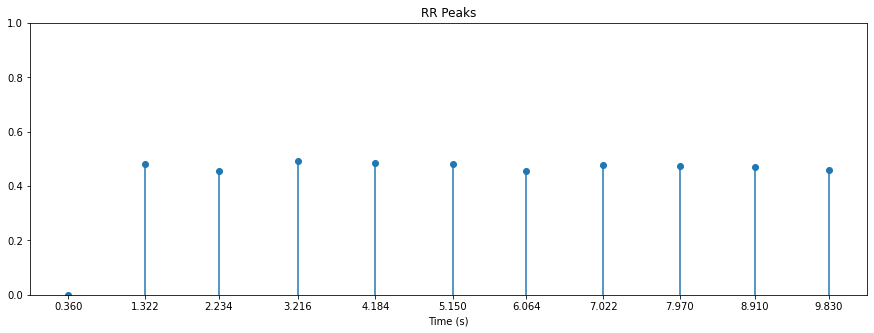

In [ ]:
plot_rr(rrintervals,rr_diff)

In [ ]:
all_subjects= afib_files+ nsr_files + afl_files

In [ ]:
subject_label = {}
for i in afib_files:
    subject_label[i] = 'afib'
for i in nsr_files:
    subject_label[i] = 'nsr'
for i in afl_files:
    subject_label[i] = 'afl'

No. of R peaks: 19


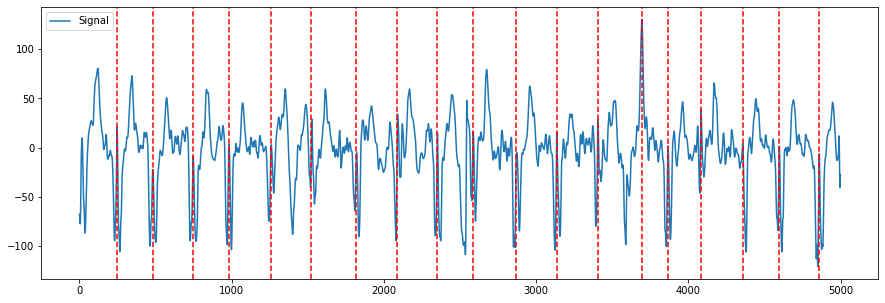

In [ ]:
parent_folder="/content/ECGDataDenoised/"
file_name=parent_folder+afib_files[0]+".csv"
df = pd.read_csv(file_name,header=None)
df.columns=['I','II','III','aVR','aVL','aVF','V1','V2','V3','V4','V5','V6']
cols = df.columns
df[cols[:-1]] = df[cols[:-1]].apply(pd.to_numeric, errors='coerce') 
df.reset_index(inplace=True,drop=True)

# Extract R-peaks locations
_, rpeaks = nk.ecg_peaks(df["aVL"][2:], sampling_rate=500)
print("No. of R peaks:",len(rpeaks['ECG_R_Peaks']))
# Visualize R-peaks in ECG signal
plot = (nk.events_plot(rpeaks['ECG_R_Peaks'], df["aVL"]))

In [26]:
rpeaks['ECG_R_Peaks']

array([ 180,  661, 1117, 1608, 2092, 2575, 3032, 3511, 3985, 4455, 4915])

In [ ]:
_

,ECG_R_Peaks
0,0
1,0
2,0
3,0
4,0
...,...
4993,0
4994,0
4995,0
4996,0


In [ ]:
subject_label = {}
for i in afib_files:
    subject_label[i] = 'afib'
for i in nsr_files:
    subject_label[i] = 'nsr'
for i in afl_files:
    subject_label[i] = 'afl'

In [ ]:
len(afl_files)

445

In [ ]:
# scikit-learn k-fold cross-validation
from numpy import array
from sklearn.model_selection import KFold
# data sample
# data = array([1, 2, 3, 4, 5, 6,7,8,9,10,11,12,13,14,15])
data=all_subjects
# prepare cross validation
kfold = KFold(10,shuffle=True,random_state=42)
# enumerate splits
for train, test in kfold.split(data):
	# print('train: %s, test: %s' % (train, test))
  
  cnt_train={}
  for i in train:
    label=subject_label[all_subjects[i]]
    if label in cnt_train:
      cnt_train[label]+=1
    else:
      cnt_train[label]=1
  print("Train:",cnt_train)

  cnt_test={}
  for i in test:
    label=subject_label[all_subjects[i]]
    if label in cnt_test:
      cnt_test[label]+=1
    else:
      cnt_test[label]=1
  print("Test:",cnt_test)


Train: {'afib': 1593, 'nsr': 1645, 'afl': 407}
Test: {'afib': 187, 'nsr': 181, 'afl': 38}
Train: {'afib': 1587, 'nsr': 1654, 'afl': 405}
Test: {'afib': 193, 'nsr': 172, 'afl': 40}
Train: {'afib': 1599, 'nsr': 1644, 'afl': 403}
Test: {'afib': 181, 'nsr': 182, 'afl': 42}
Train: {'afib': 1602, 'nsr': 1650, 'afl': 394}
Test: {'afib': 178, 'nsr': 176, 'afl': 51}
Train: {'afib': 1612, 'nsr': 1638, 'afl': 396}
Test: {'afib': 168, 'nsr': 188, 'afl': 49}
Train: {'afib': 1603, 'nsr': 1640, 'afl': 403}
Test: {'afib': 177, 'nsr': 186, 'afl': 42}
Train: {'afib': 1610, 'nsr': 1638, 'afl': 398}
Test: {'afib': 170, 'nsr': 188, 'afl': 47}
Train: {'afib': 1598, 'nsr': 1635, 'afl': 413}
Test: {'afib': 182, 'nsr': 191, 'afl': 32}
Train: {'afib': 1607, 'nsr': 1648, 'afl': 391}
Test: {'afib': 173, 'nsr': 178, 'afl': 54}
Train: {'afib': 1609, 'nsr': 1642, 'afl': 395}
Test: {'afib': 171, 'nsr': 184, 'afl': 50}


In [ ]:
len(train

1602

In [ ]:
len(test)*100/1780

10.0

In [2]:
pip install py-ecg-detectors
#Documentation: https://pypi.org/project/py-ecg-detectors/

     |████████████████████████████████| 554 kB 6.5 MB/s 
  Created wheel for gatspy: filename=gatspy-0.3-py3-none-any.whl size=43818 sha256=1b29deede9adbe6db02ca855981e77898ad740781268351581b1d86f09183434
  Stored in directory: /root/.cache/pip/wheels/1f/c1/4c/8de278f816259b4f67e2356c0bda260a593375661e400bf31f
Successfully built gatspy


In [78]:
from ecgdetectors import Detectors
detectors = Detectors(500) #specify sampling rate

In [97]:
def detect_r_peaks_pan_tompkins_detector(patient_list,detector,showplots=False):
    parent_folder = '/content/ECGDataDenoised/'
    total_r_peaks=0
    for i in tqdm(patient_list):
      try:
        data = parent_folder+i+".csv"
        
        df = pd.read_csv(data,header=None)
        df.columns=['I','II','III','aVR','aVL','aVF','V1','V2','V3','V4','V5','V6']
        
        cols = df.columns
        df[cols[:-1]] = df[cols[:-1]].apply(pd.to_numeric, errors='coerce') 

        # Extract R-peaks locations using pan_tompkins_detector
        unfiltered_ecg=df["aVL"]
        if(detector=="pan_tompkins"):
          rpeaks = detectors.pan_tompkins_detector(unfiltered_ecg)
        elif(detector=="stationary_wavelet_transform"):
          rpeaks = detectors.swt_detector(unfiltered_ecg)

        total_r_peaks+=len(rpeaks)
        rrintervals = np.array(rpeaks)
        rrdiff=np.diff(rpeaks)/1000
        rr_diff = np.append(0, rrdiff)

        if(showplots): # Visualize R-peaks in ECG signal
          print("\n****",i,"****\n")
          plot = (nk.events_plot(rpeaks, df["aVL"]))
          plot_rr(rrintervals,rr_diff)
      except:
        print("\n ##### Error in:",i,"#####\n")
    print("\n")
    return total_r_peaks#number of peaks

  0%|          | 0/15 [00:00<?, ?it/s]


**** MUSE_20180209_172046_21000 ****



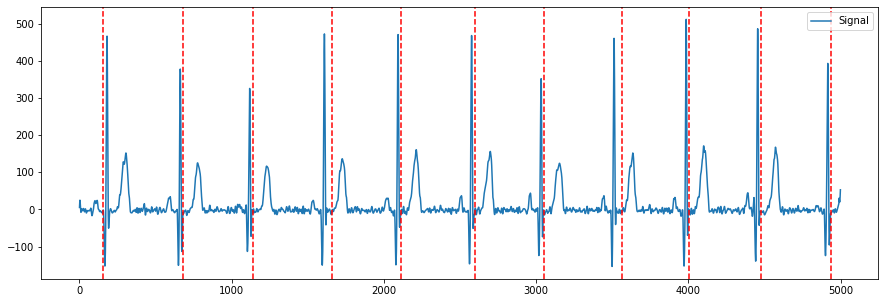

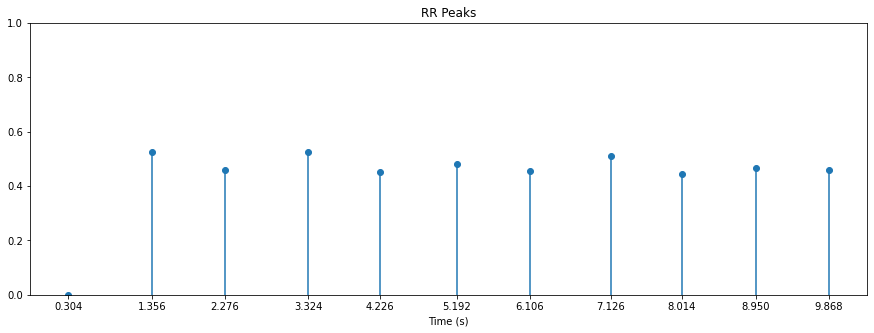

  7%|▋         | 1/15 [00:00<00:06,  2.08it/s]


**** MUSE_20180209_122707_18000 ****



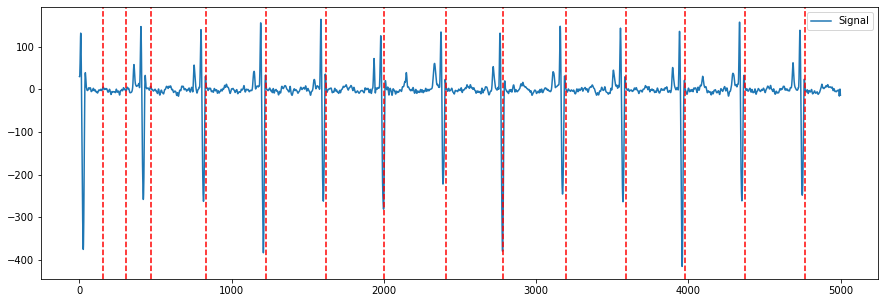

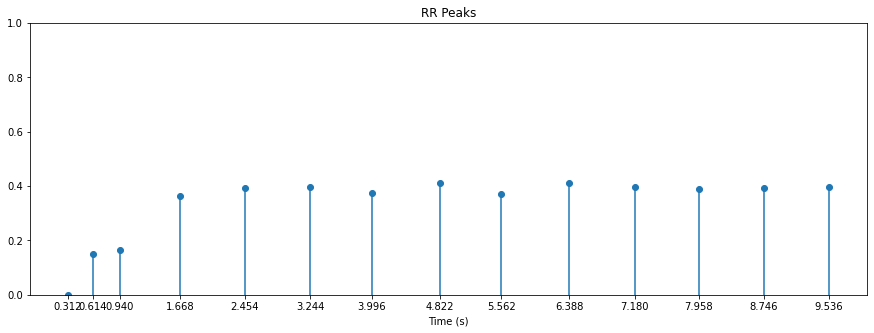

 13%|█▎        | 2/15 [00:00<00:06,  2.11it/s]


**** MUSE_20180210_121425_58000 ****



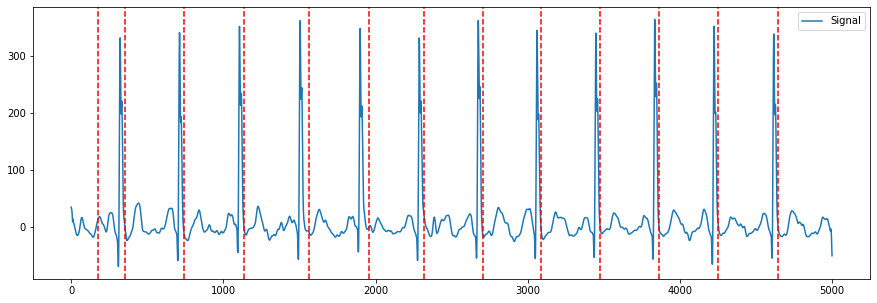

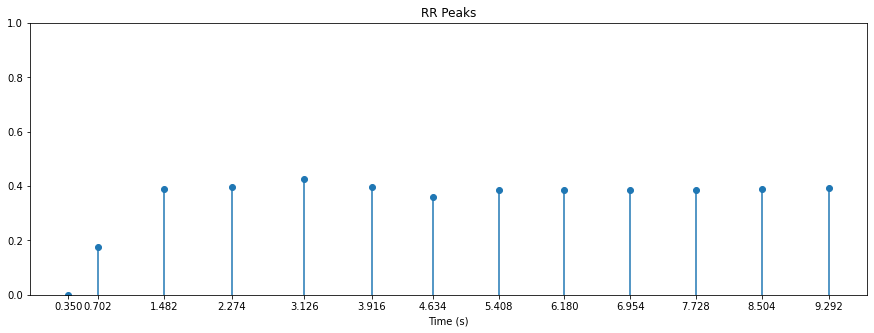

 20%|██        | 3/15 [00:01<00:05,  2.13it/s]


**** MUSE_20180209_123610_67000 ****



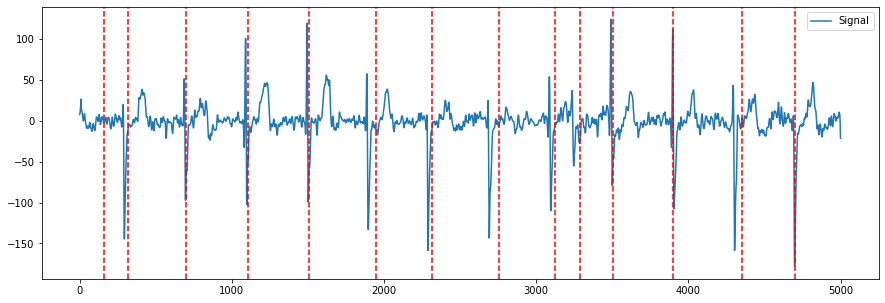

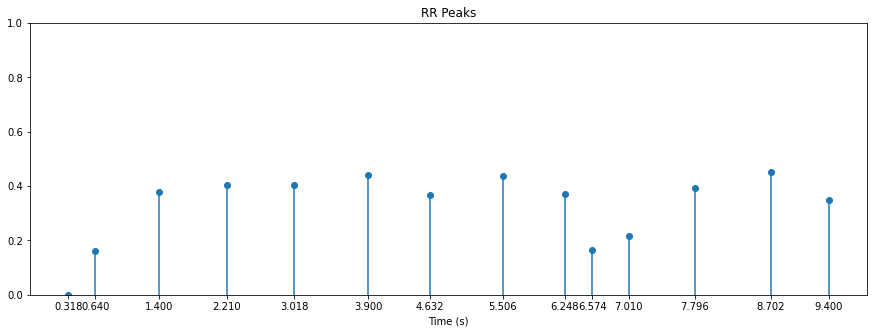

 27%|██▋       | 4/15 [00:01<00:05,  2.14it/s]


**** MUSE_20180209_174940_69000 ****



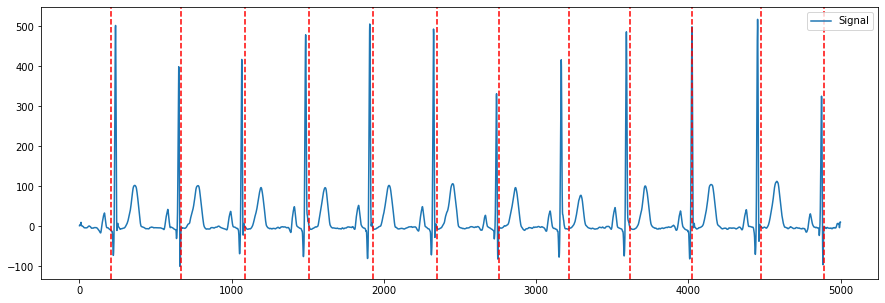

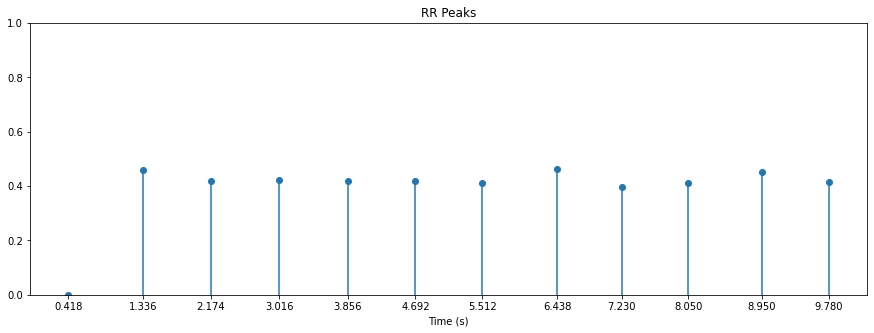

 33%|███▎      | 5/15 [00:02<00:04,  2.12it/s]


**** MUSE_20180209_173345_26000 ****



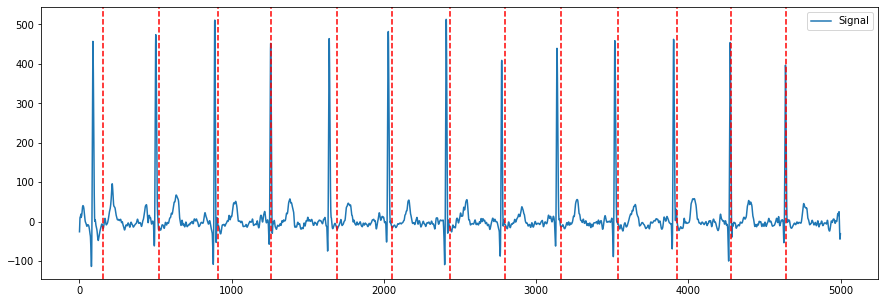

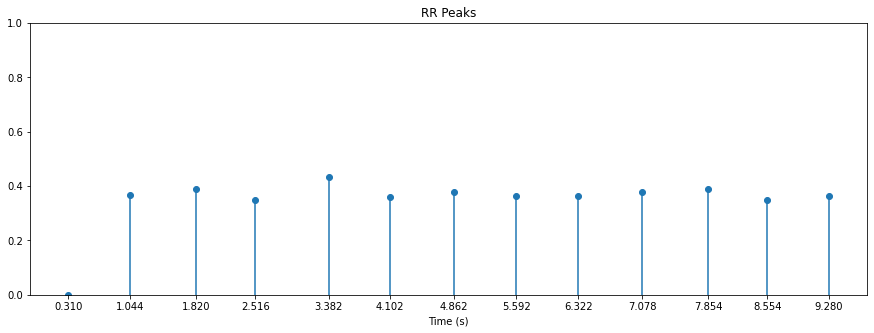

 40%|████      | 6/15 [00:02<00:04,  2.14it/s]


**** MUSE_20180209_171254_45000 ****



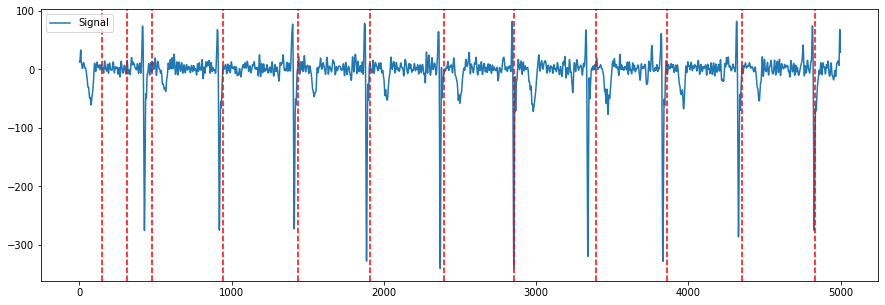

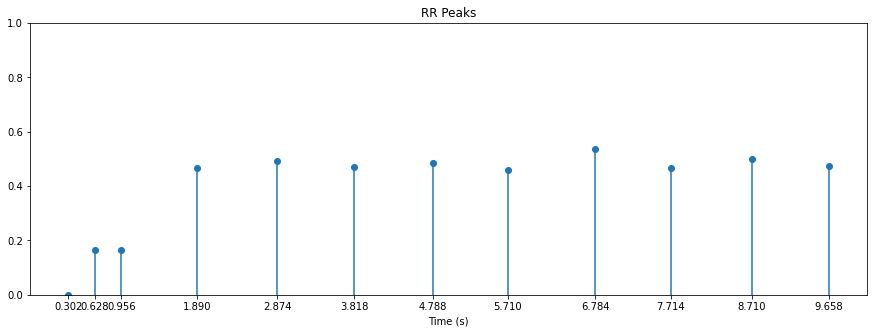

 47%|████▋     | 7/15 [00:03<00:03,  2.12it/s]


**** MUSE_20180209_130455_68000 ****



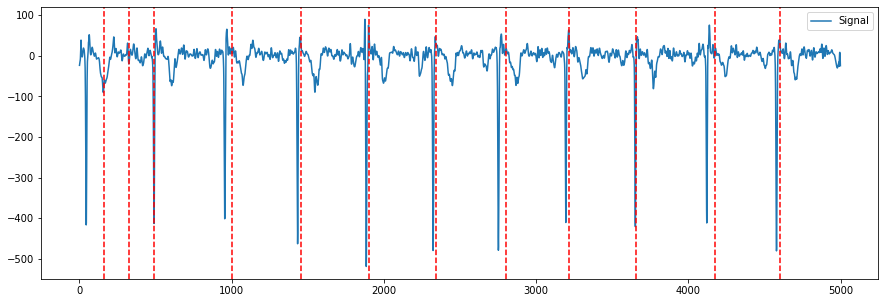

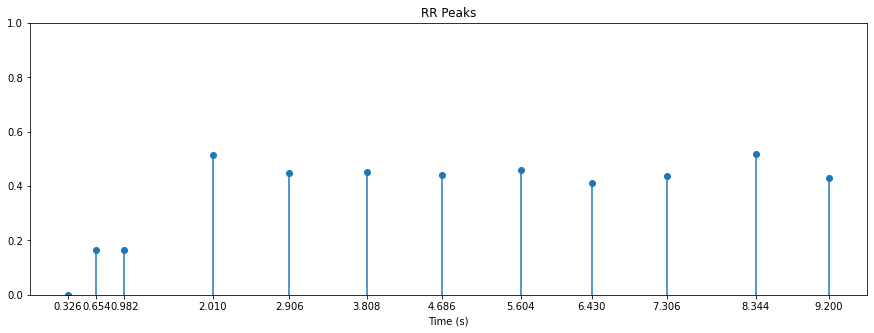

 53%|█████▎    | 8/15 [00:03<00:03,  2.09it/s]


**** MUSE_20180209_175358_35000 ****



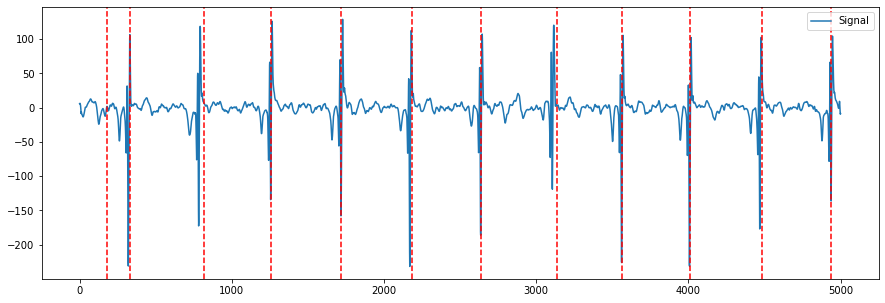

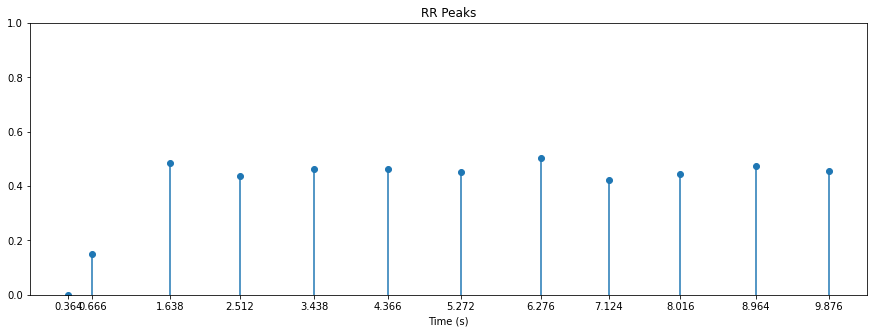

 60%|██████    | 9/15 [00:04<00:03,  1.84it/s]


**** MUSE_20180209_120535_84000 ****



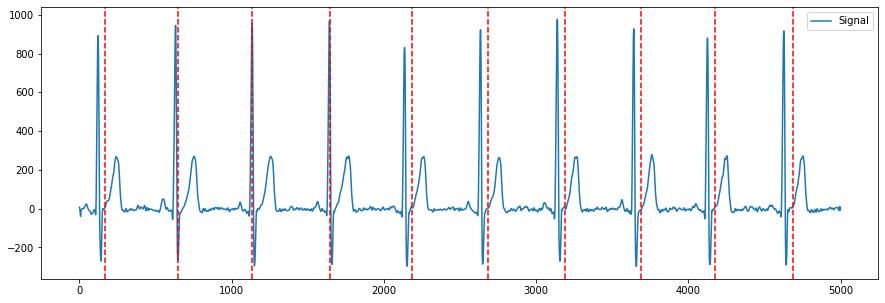

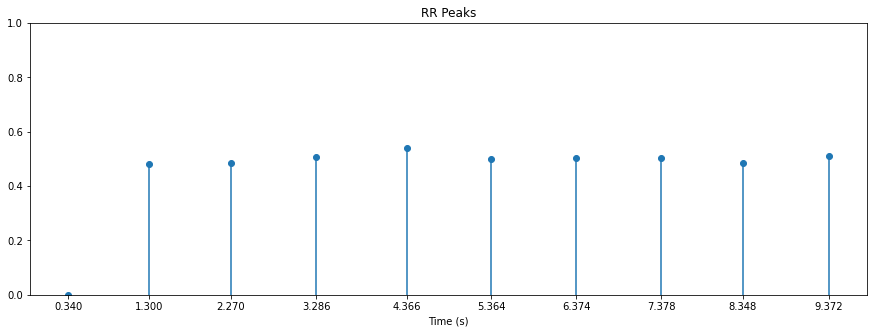

 67%|██████▋   | 10/15 [00:04<00:02,  1.94it/s]


**** MUSE_20180210_124120_62000 ****



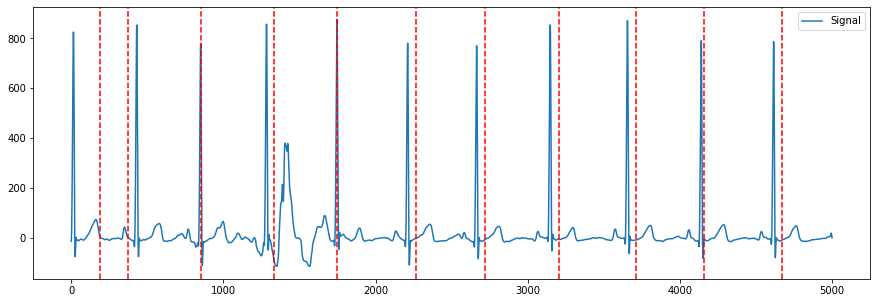

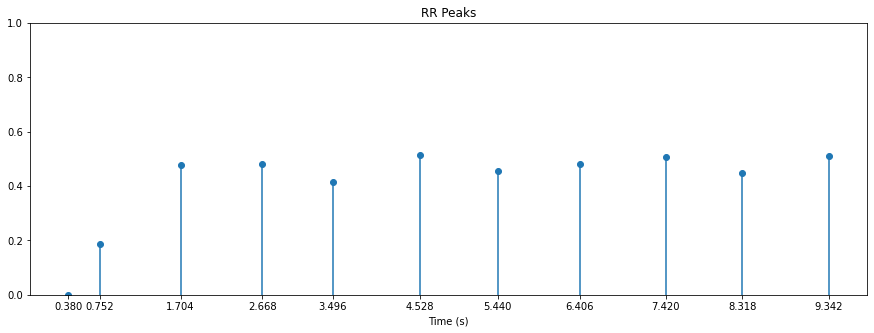

 73%|███████▎  | 11/15 [00:05<00:01,  2.01it/s]


**** MUSE_20180210_125829_81000 ****



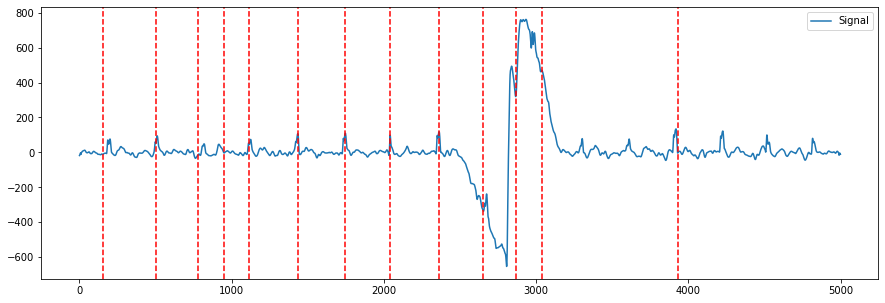

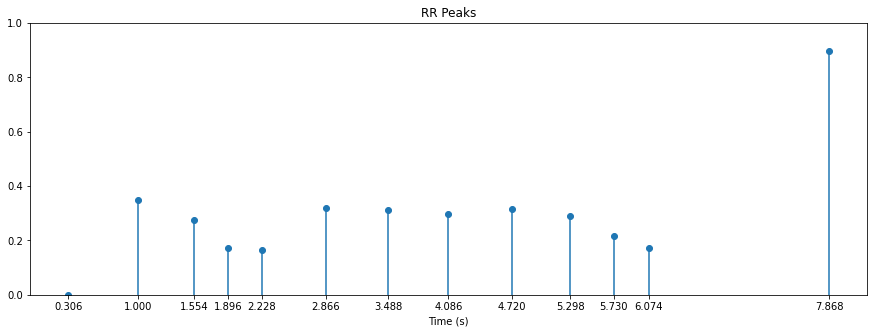

 80%|████████  | 12/15 [00:05<00:01,  2.02it/s]


**** MUSE_20180209_120237_19000 ****



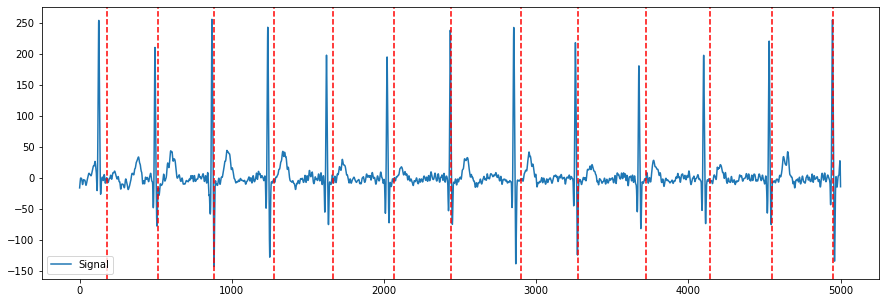

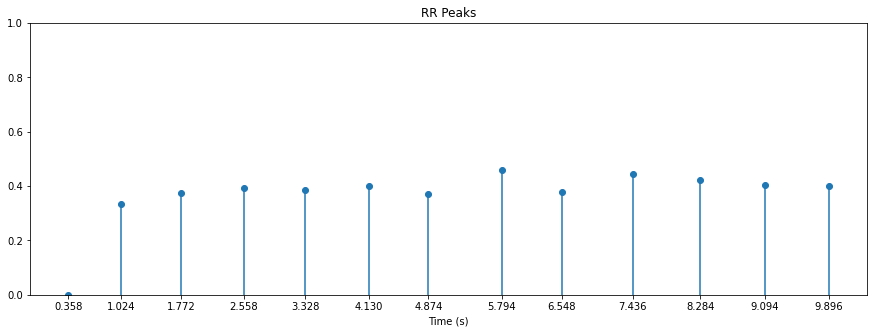

 87%|████████▋ | 13/15 [00:06<00:00,  2.02it/s]


**** MUSE_20180210_132137_89000 ****



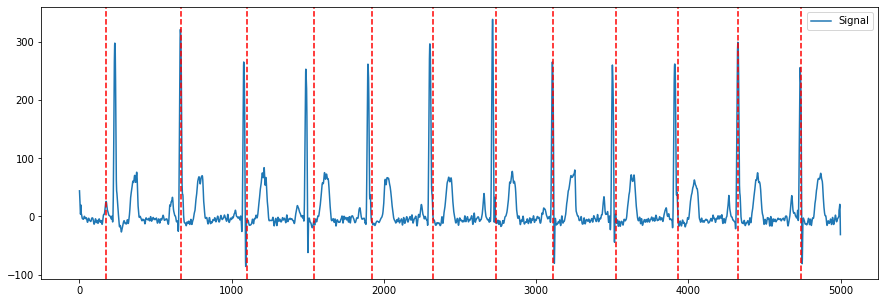

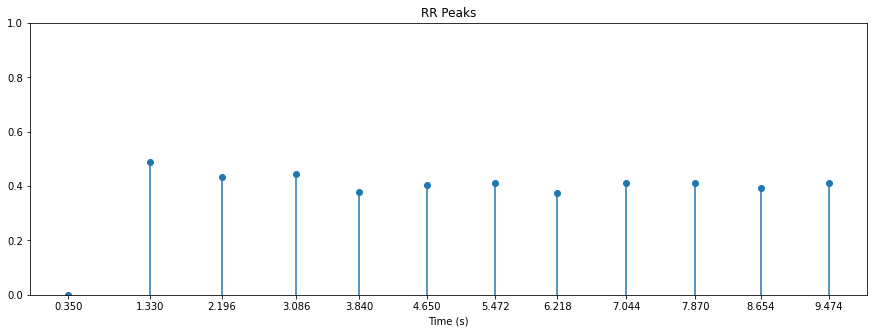

 93%|█████████▎| 14/15 [00:06<00:00,  2.05it/s]


**** MUSE_20180209_131406_69000 ****



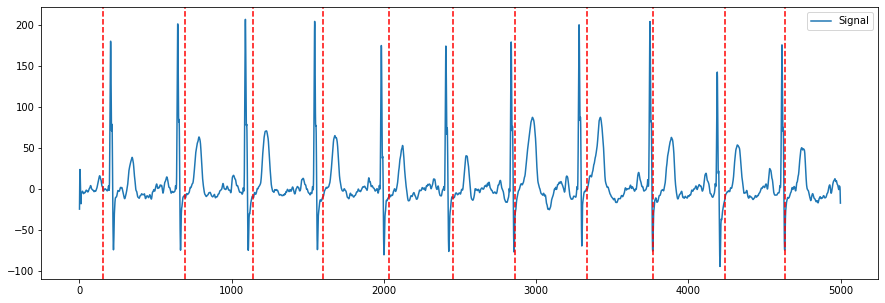

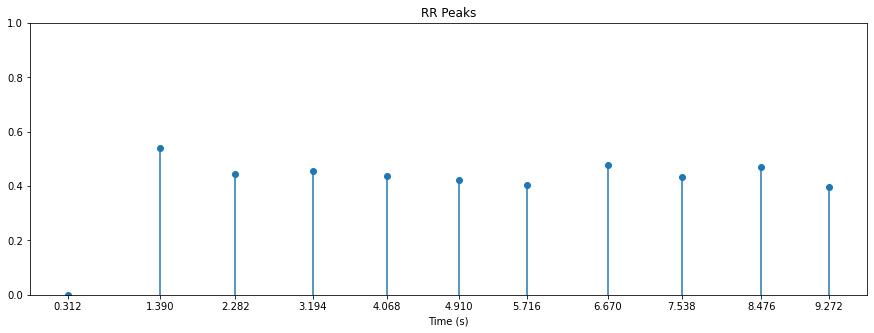

100%|██████████| 15/15 [00:07<00:00,  2.05it/s]

183

In [98]:
detect_r_peaks_pan_tompkins_detector(nsr_files[:15],"pan_tompkins",True)

  0%|          | 0/15 [00:00<?, ?it/s]


**** MUSE_20180209_172046_21000 ****



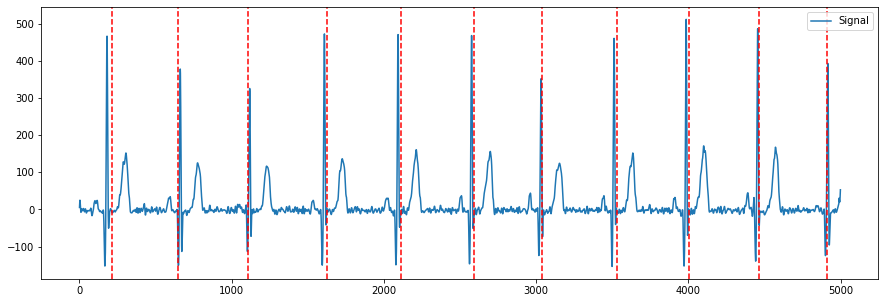

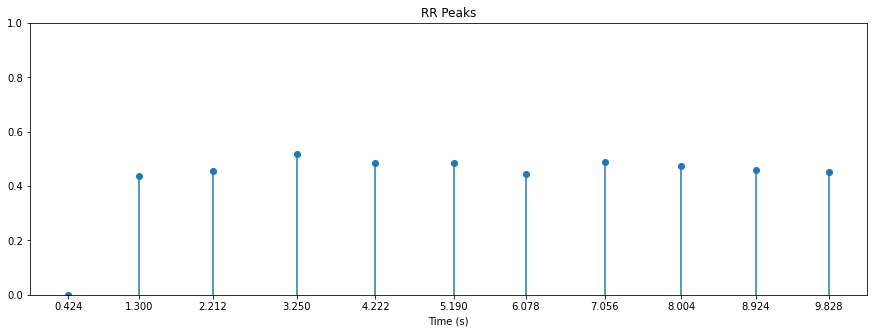

  7%|▋         | 1/15 [00:00<00:08,  1.56it/s]


**** MUSE_20180209_122707_18000 ****



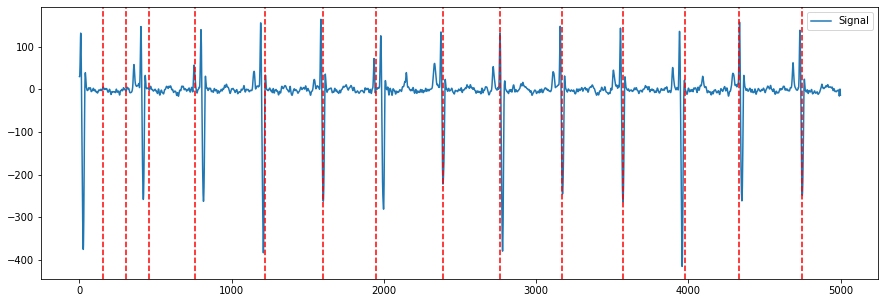

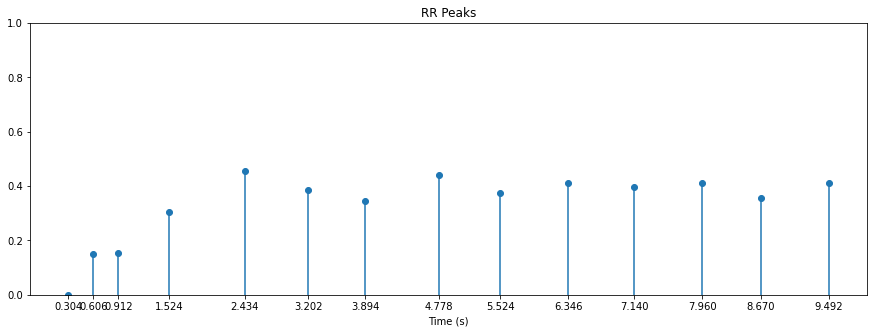

 13%|█▎        | 2/15 [00:01<00:11,  1.14it/s]


**** MUSE_20180210_121425_58000 ****



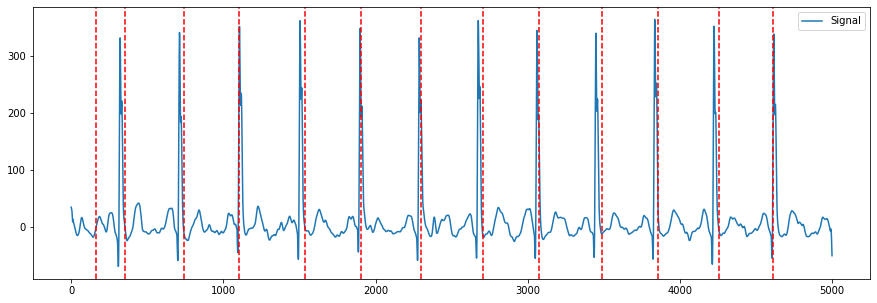

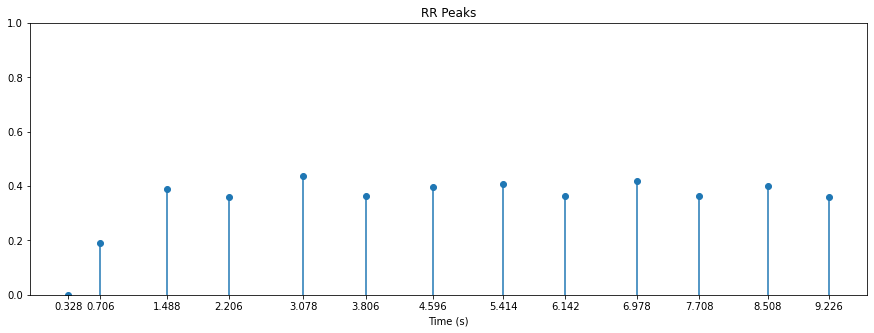

 20%|██        | 3/15 [00:02<00:09,  1.25it/s]


**** MUSE_20180209_123610_67000 ****



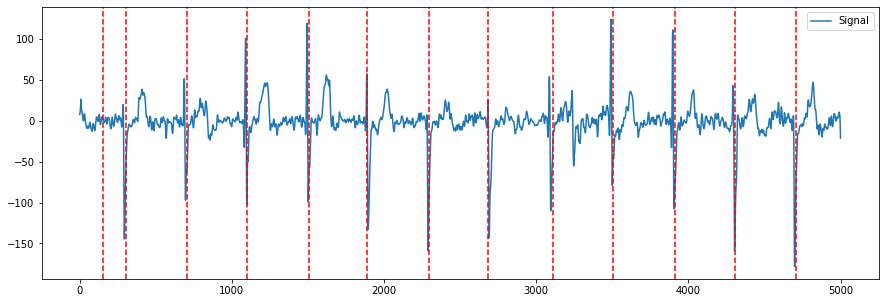

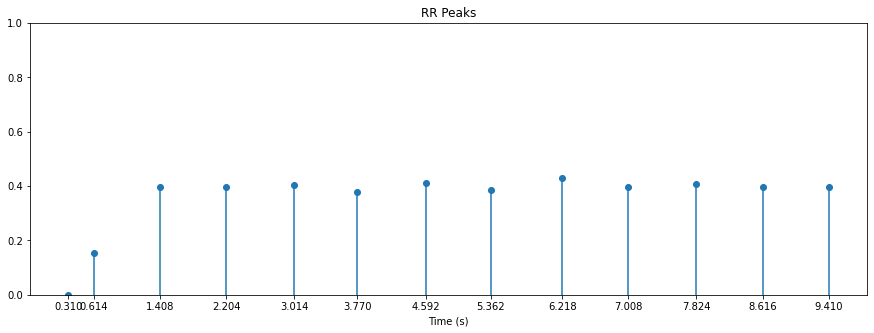

 27%|██▋       | 4/15 [00:03<00:08,  1.31it/s]


**** MUSE_20180209_174940_69000 ****



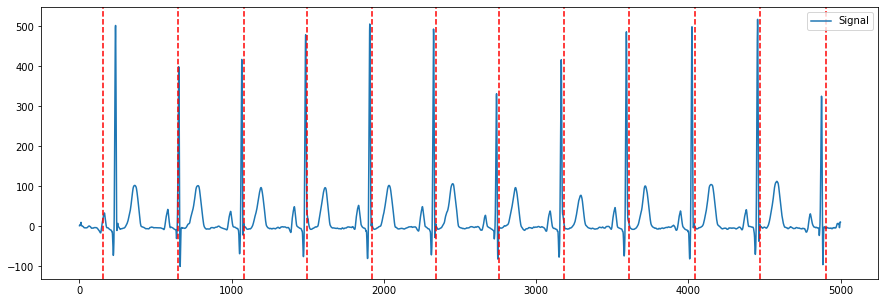

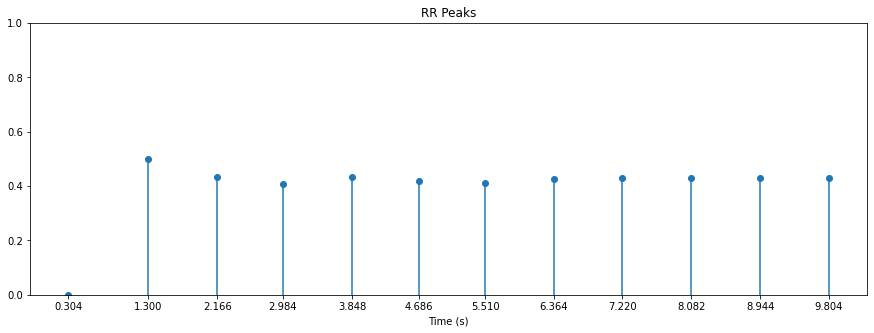

 33%|███▎      | 5/15 [00:03<00:07,  1.28it/s]


**** MUSE_20180209_173345_26000 ****



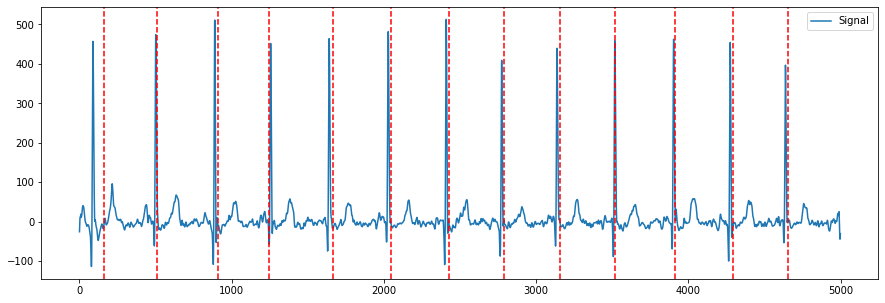

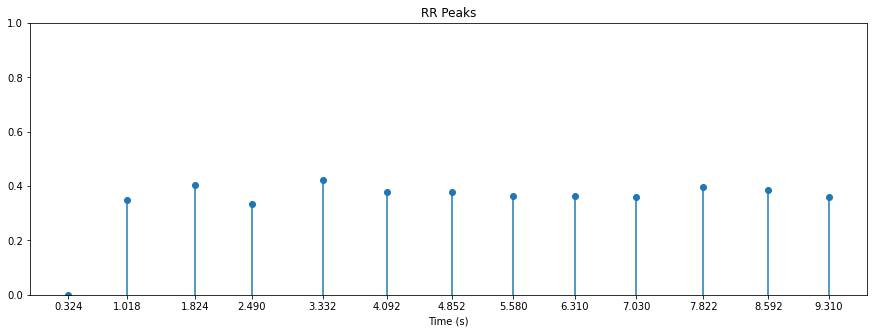

 40%|████      | 6/15 [00:04<00:07,  1.28it/s]


**** MUSE_20180209_171254_45000 ****



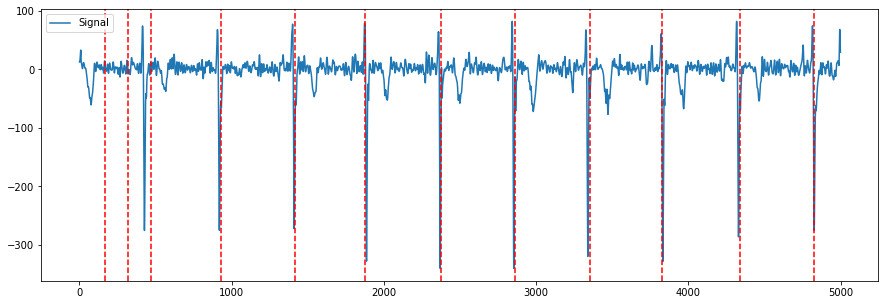

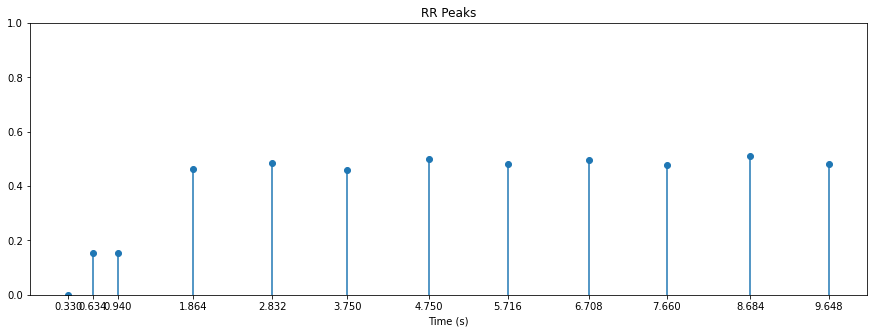

 47%|████▋     | 7/15 [00:05<00:05,  1.44it/s]


**** MUSE_20180209_130455_68000 ****



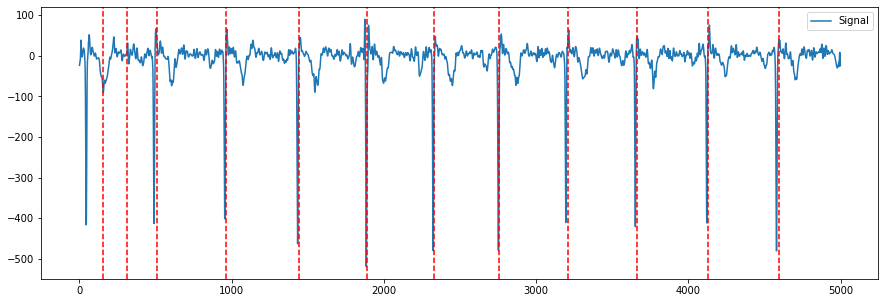

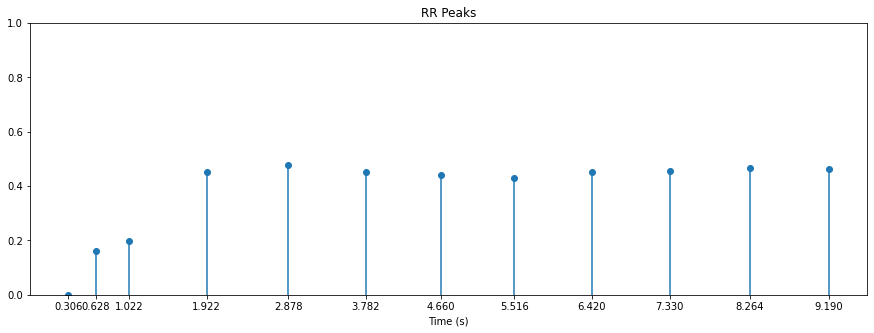

 53%|█████▎    | 8/15 [00:05<00:04,  1.61it/s]


**** MUSE_20180209_175358_35000 ****



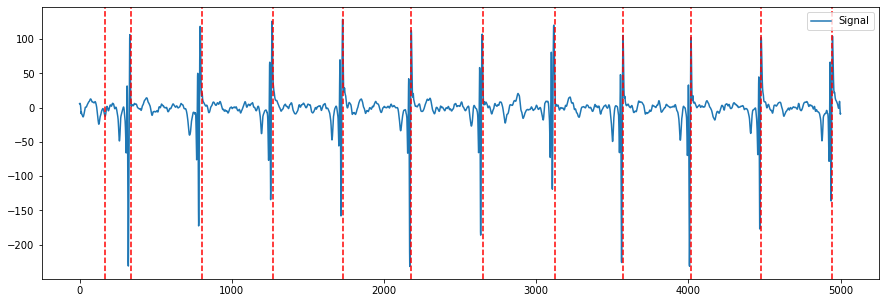

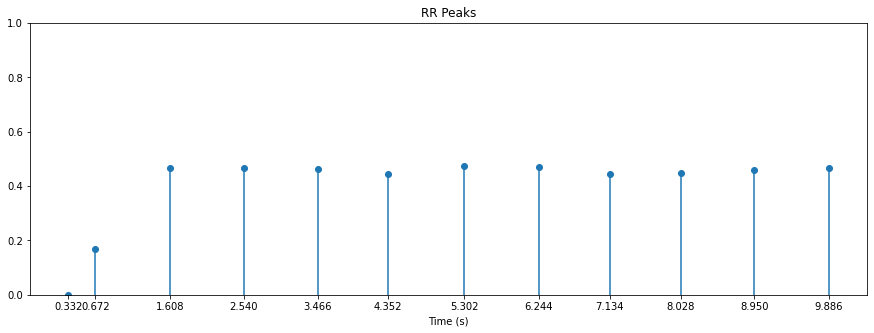

 60%|██████    | 9/15 [00:06<00:03,  1.72it/s]


**** MUSE_20180209_120535_84000 ****



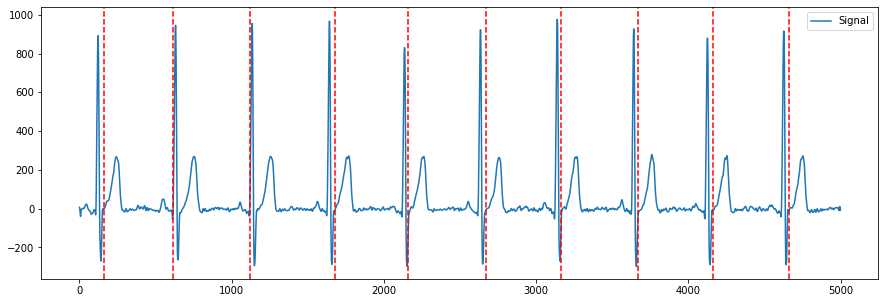

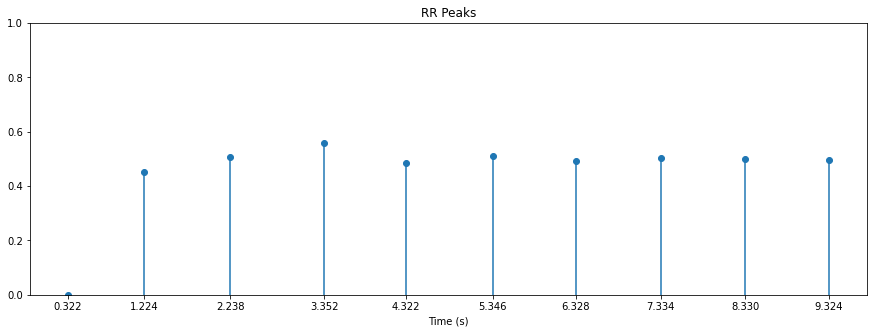

 67%|██████▋   | 10/15 [00:06<00:02,  1.85it/s]


**** MUSE_20180210_124120_62000 ****



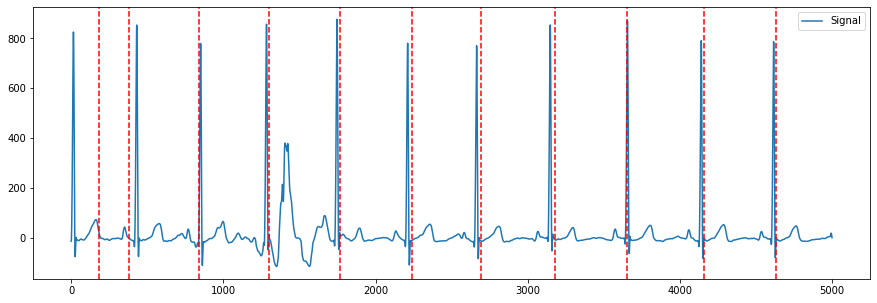

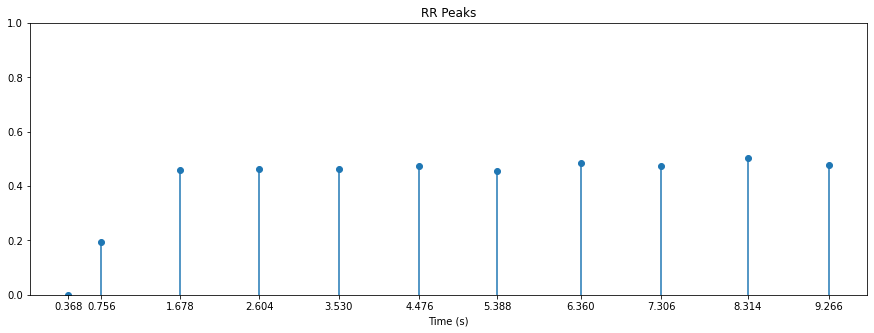

 73%|███████▎  | 11/15 [00:07<00:02,  1.93it/s]


**** MUSE_20180210_125829_81000 ****



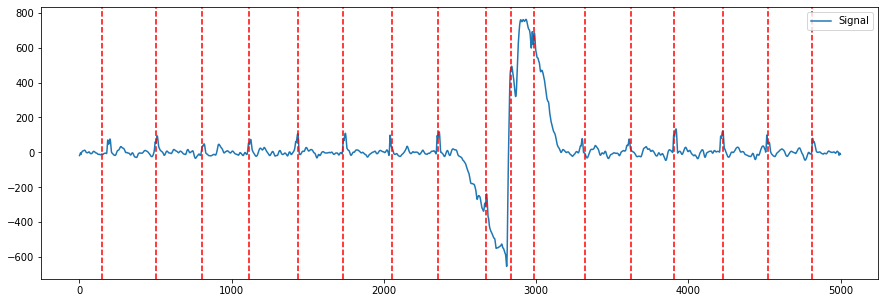

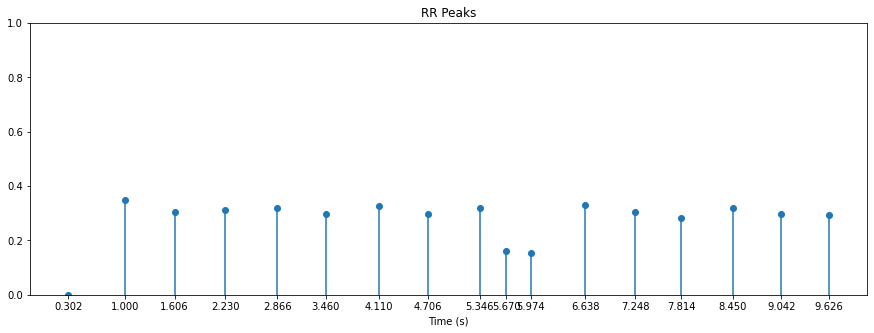

 80%|████████  | 12/15 [00:07<00:01,  1.72it/s]


**** MUSE_20180209_120237_19000 ****



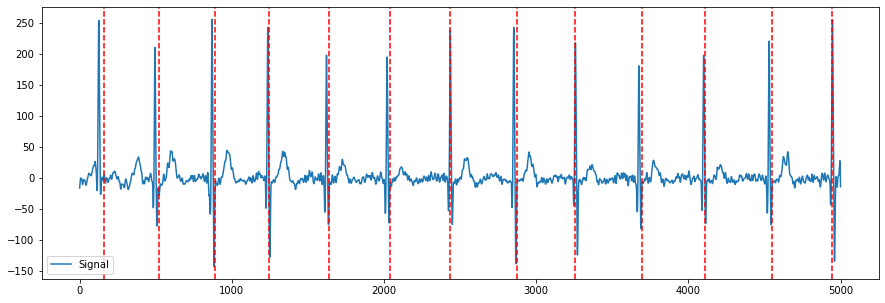

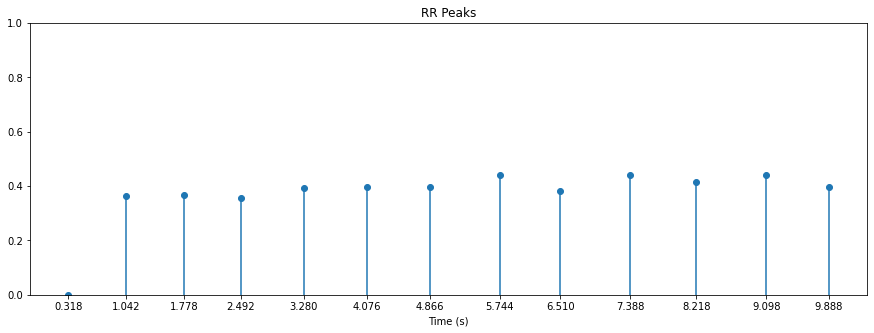

 87%|████████▋ | 13/15 [00:08<00:01,  1.76it/s]


**** MUSE_20180210_132137_89000 ****



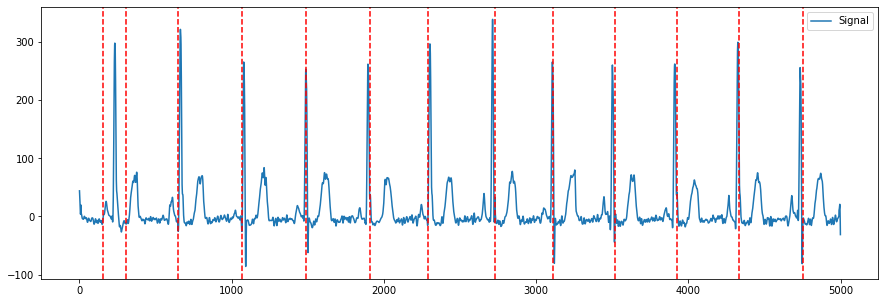

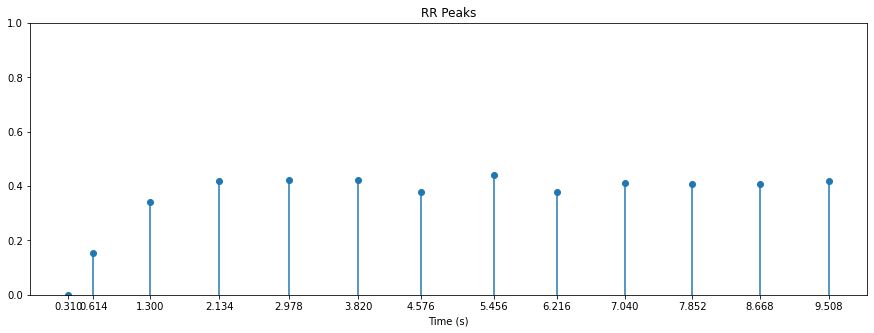

 93%|█████████▎| 14/15 [00:08<00:00,  1.83it/s]


**** MUSE_20180209_131406_69000 ****



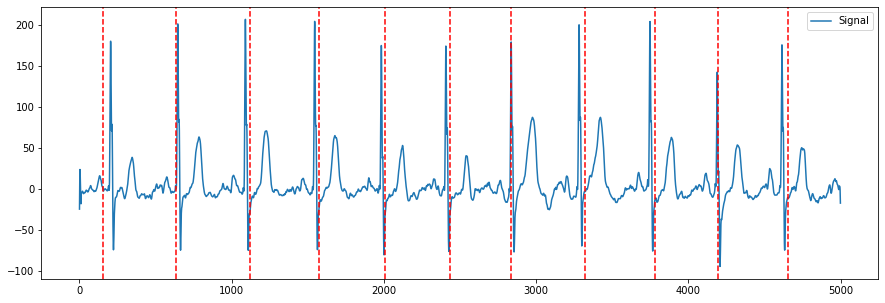

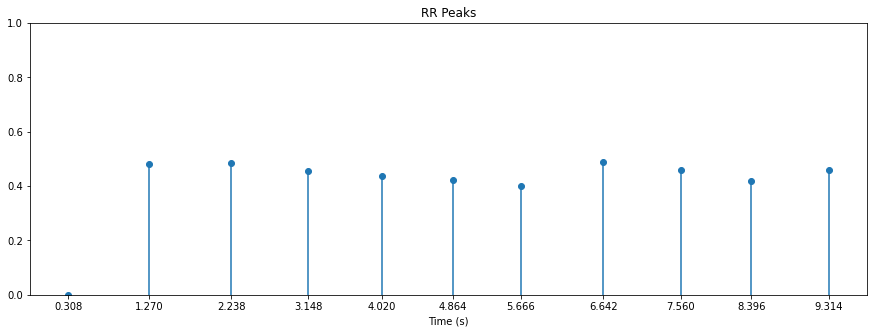

100%|██████████| 15/15 [00:09<00:00,  1.61it/s]

187

In [100]:
detect_r_peaks_pan_tompkins_detector(nsr_files[:15],"stationary_wavelet_transform",True)

  0%|          | 0/15 [00:00<?, ?it/s]


**** MUSE_20180113_171327_27000 ****



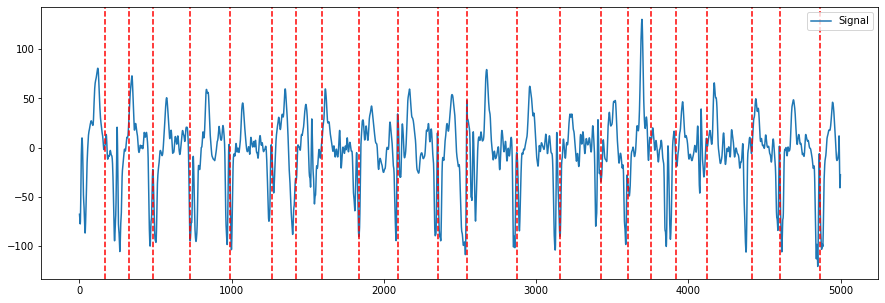

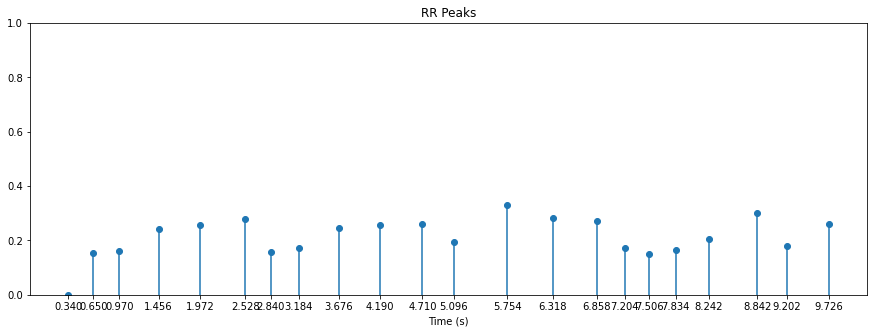

  7%|▋         | 1/15 [00:00<00:07,  1.85it/s]


**** MUSE_20180114_075026_69000 ****



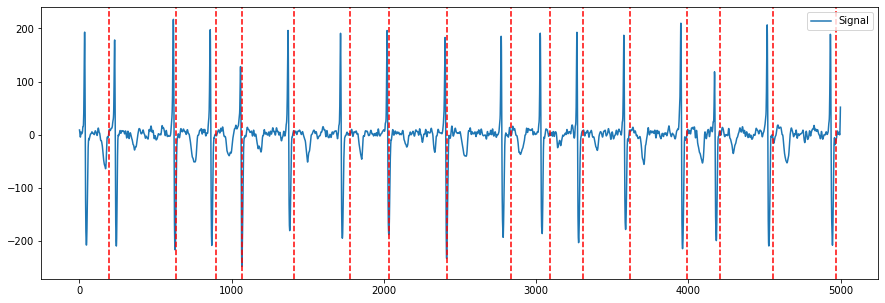

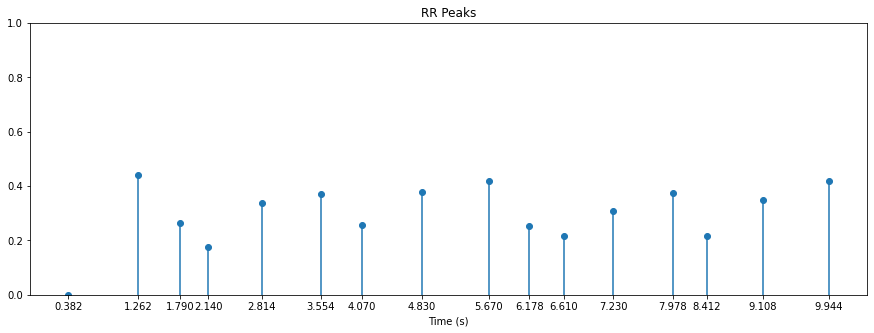

 13%|█▎        | 2/15 [00:01<00:06,  1.95it/s]


**** MUSE_20180113_133901_16000 ****



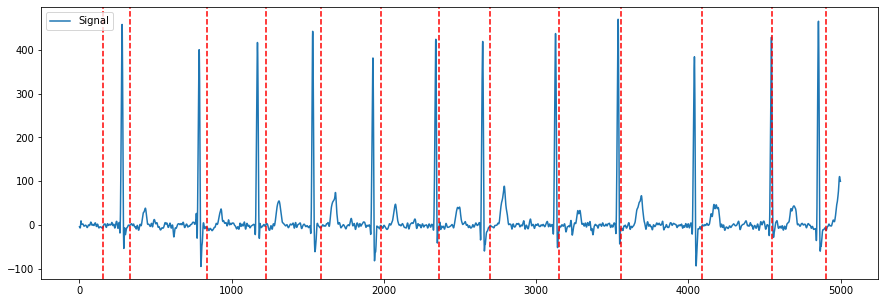

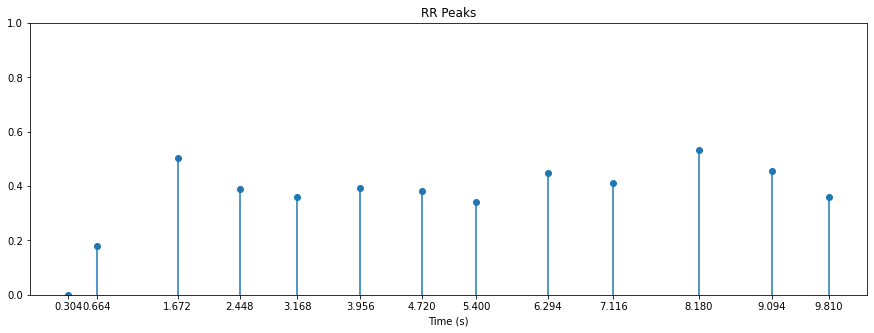

 20%|██        | 3/15 [00:01<00:05,  2.00it/s]


**** MUSE_20180116_123940_90000 ****



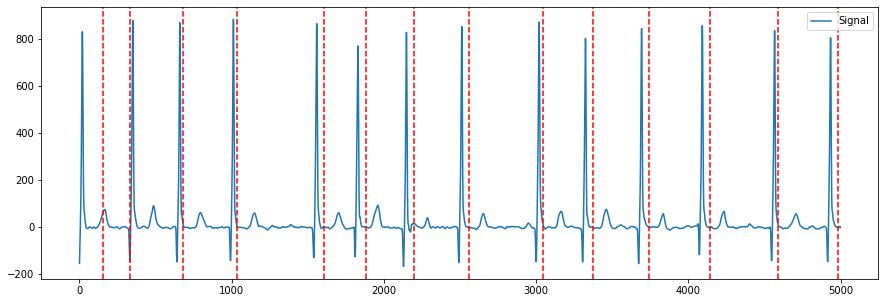

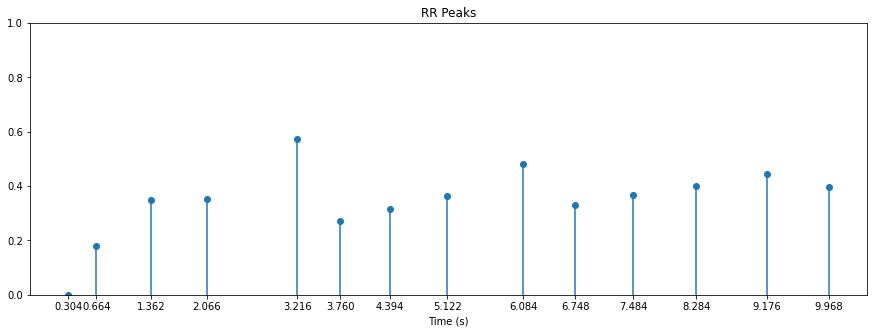

 27%|██▋       | 4/15 [00:02<00:05,  1.86it/s]


**** MUSE_20180114_075003_61000 ****



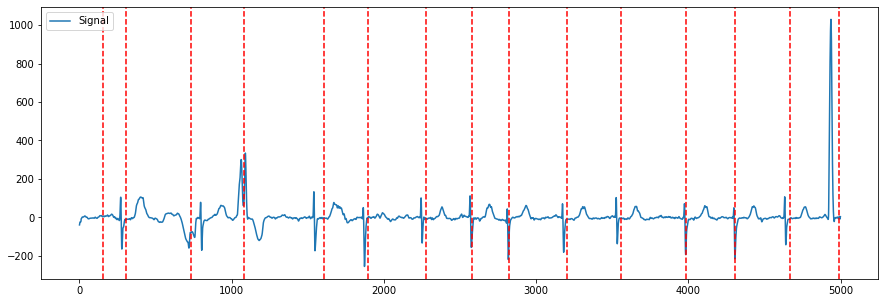

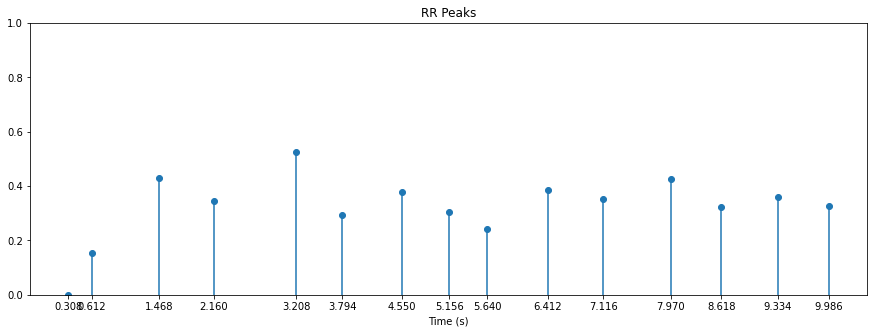

 33%|███▎      | 5/15 [00:03<00:07,  1.33it/s]


**** MUSE_20180114_073026_18000 ****



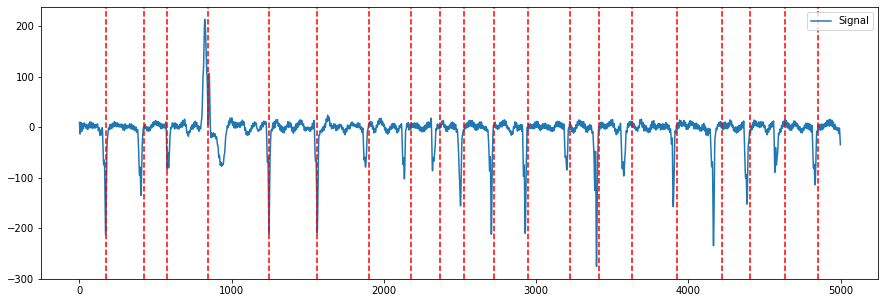

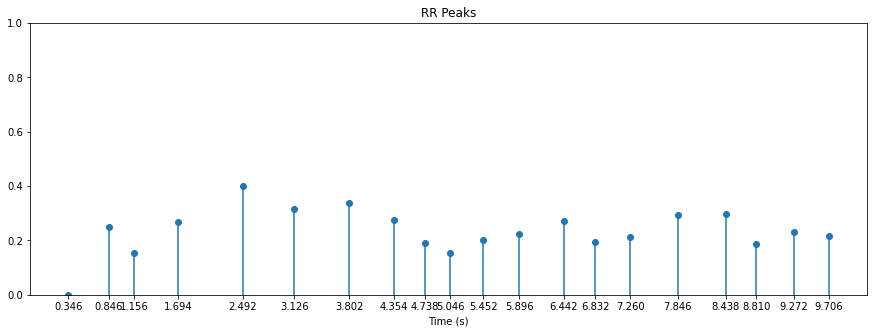

 40%|████      | 6/15 [00:04<00:07,  1.28it/s]


**** MUSE_20180113_074740_85000 ****



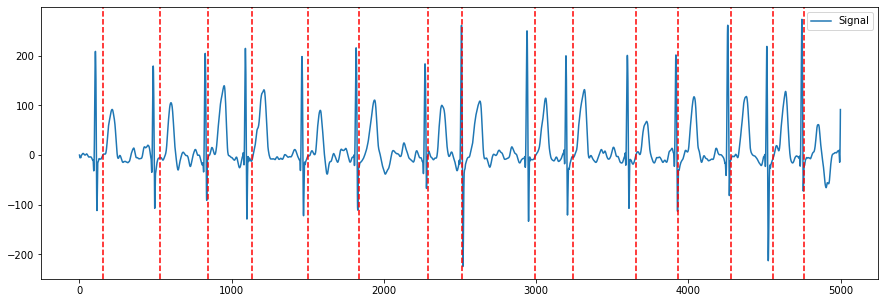

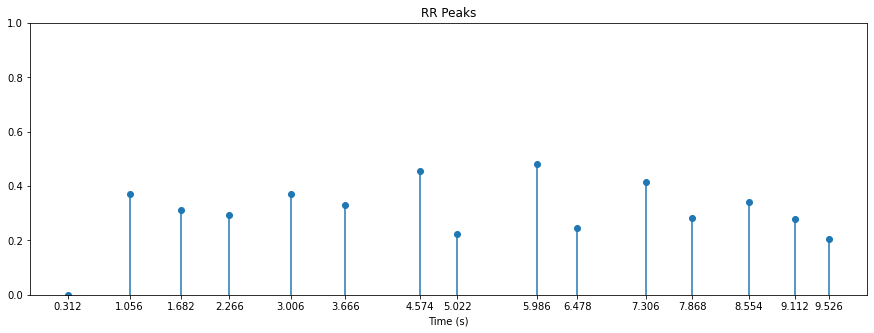

 47%|████▋     | 7/15 [00:04<00:05,  1.37it/s]


**** MUSE_20180114_132044_36000 ****



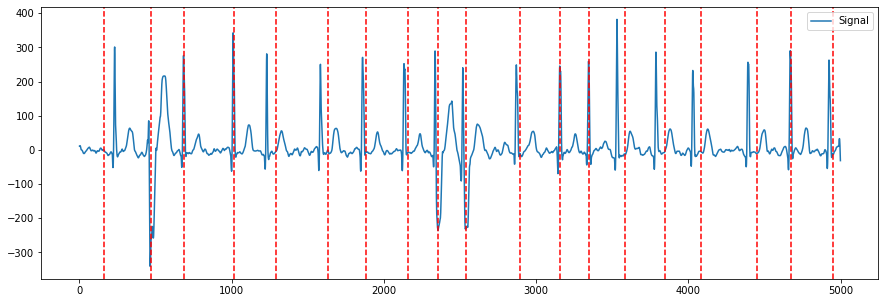

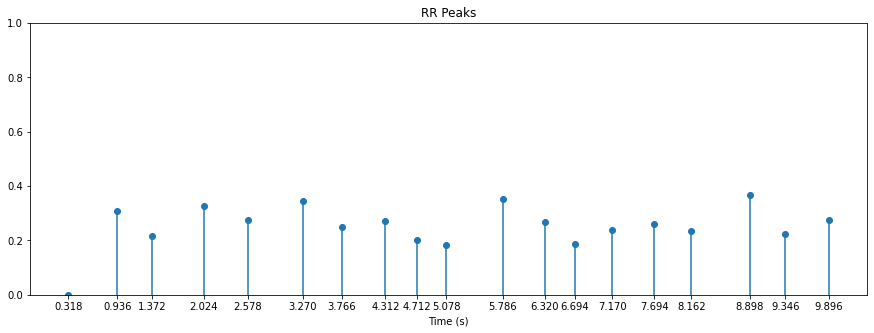

 53%|█████▎    | 8/15 [00:05<00:05,  1.32it/s]


**** MUSE_20180116_131337_59000 ****



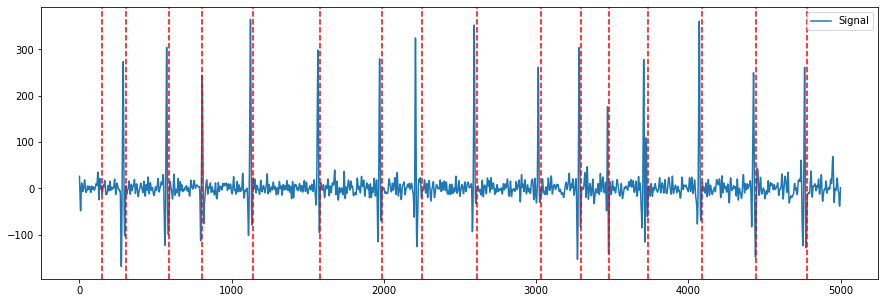

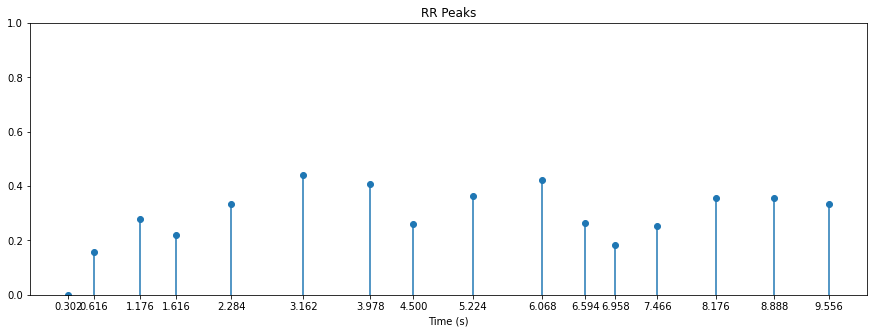

 60%|██████    | 9/15 [00:06<00:04,  1.37it/s]


**** MUSE_20180113_183351_27000 ****



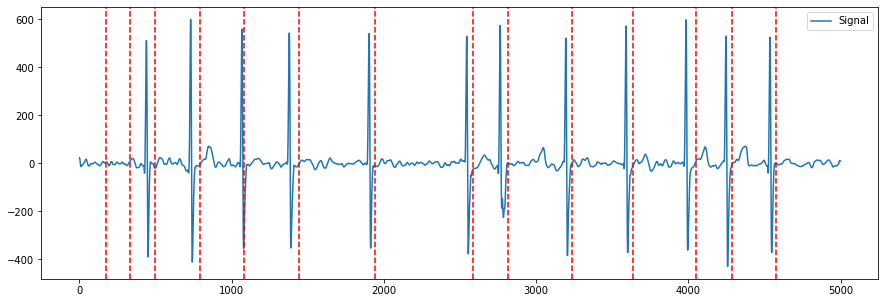

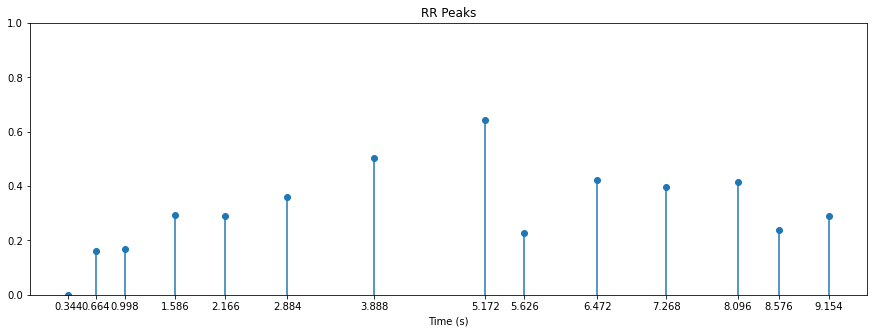

 67%|██████▋   | 10/15 [00:06<00:03,  1.37it/s]


**** MUSE_20180113_172948_90000 ****



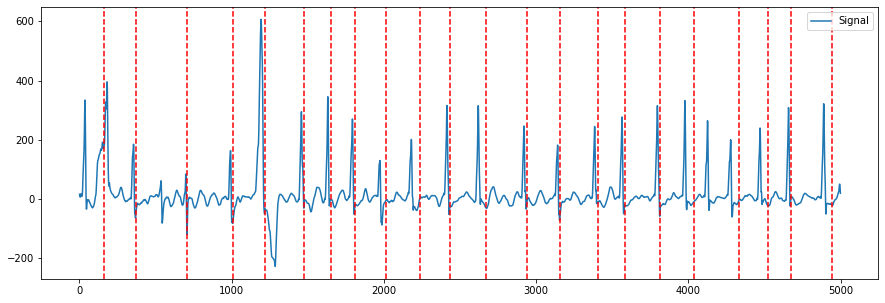

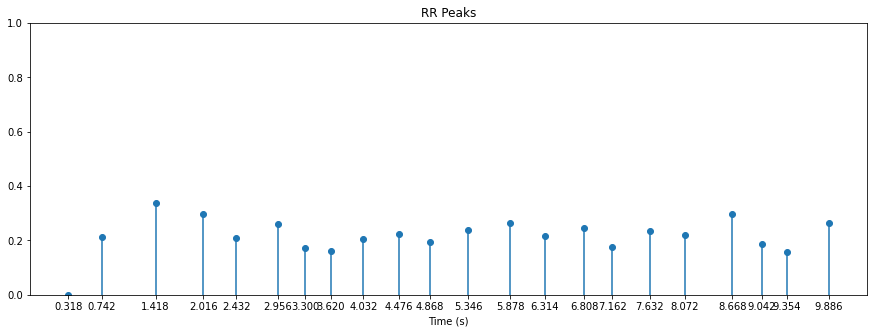

 73%|███████▎  | 11/15 [00:08<00:04,  1.00s/it]


**** MUSE_20180112_123750_49000 ****



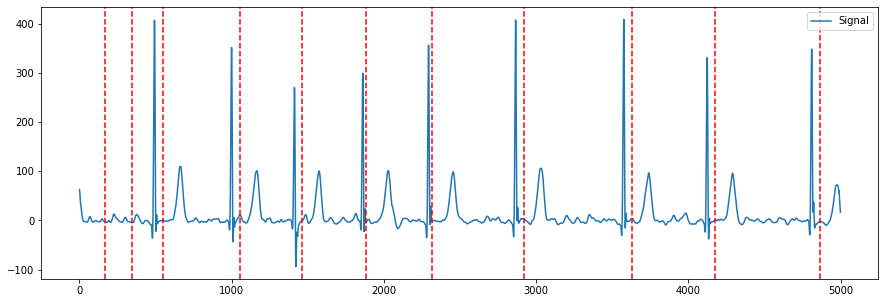

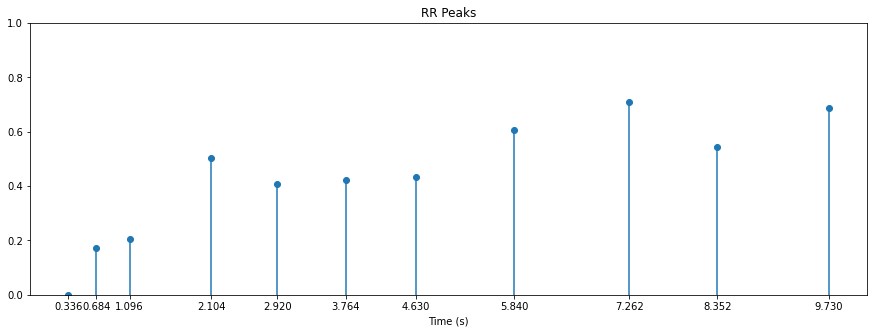

 80%|████████  | 12/15 [00:09<00:02,  1.12it/s]


**** MUSE_20180112_170307_12000 ****



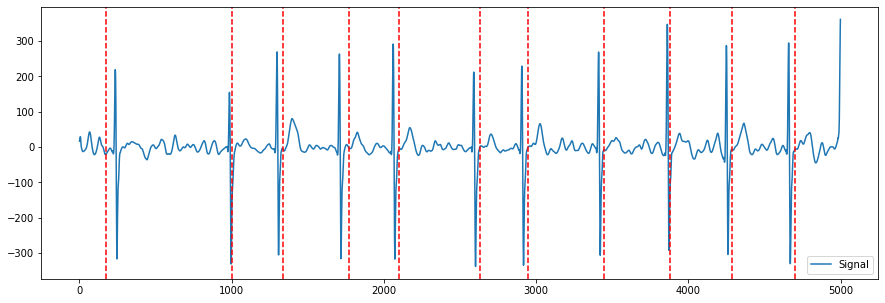

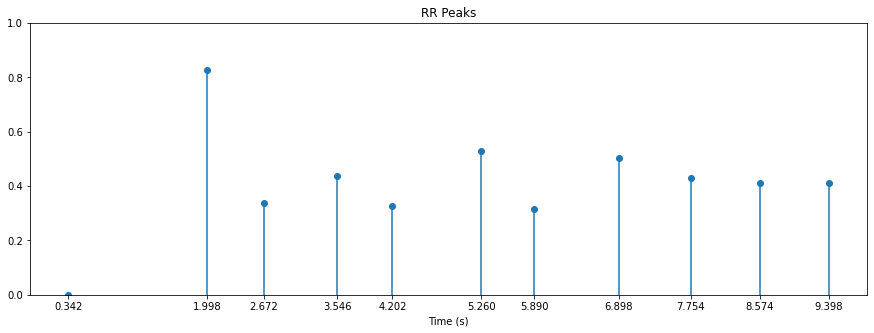

 87%|████████▋ | 13/15 [00:09<00:01,  1.18it/s]


**** MUSE_20180118_125855_69000 ****



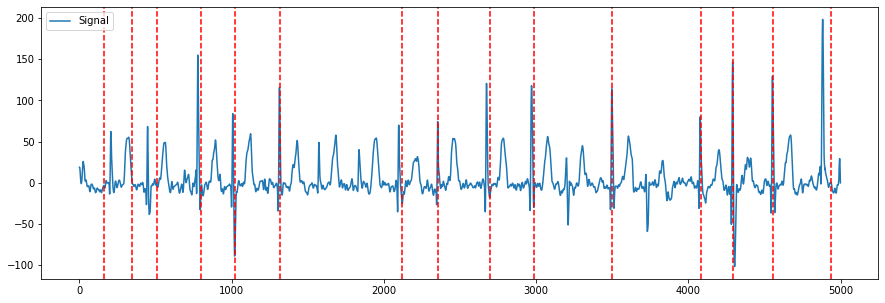

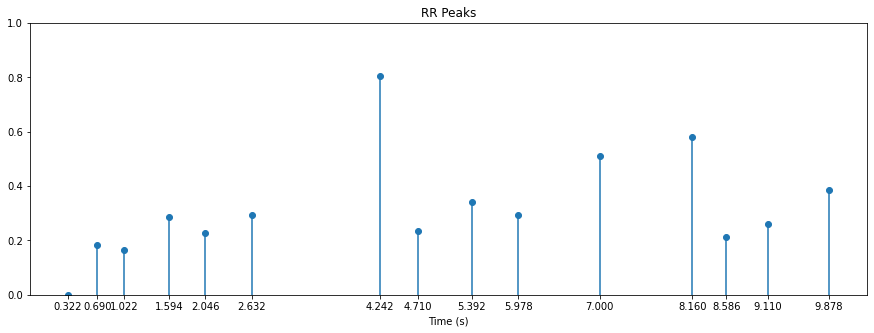

 93%|█████████▎| 14/15 [00:11<00:00,  1.09it/s]


**** MUSE_20180113_072453_82000 ****



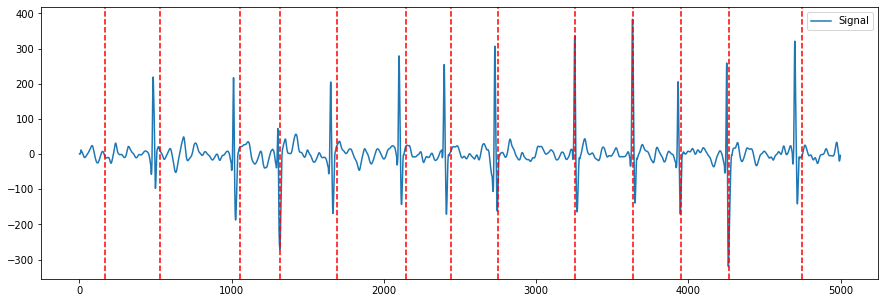

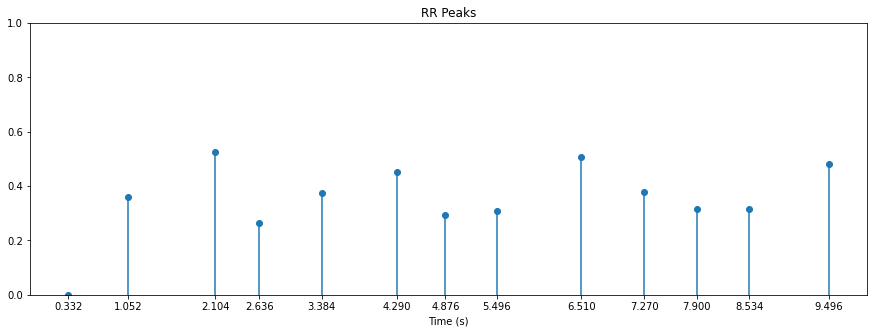

100%|██████████| 15/15 [00:11<00:00,  1.29it/s]

236

In [101]:
detect_r_peaks_pan_tompkins_detector(afib_files[:15],"pan_tompkins",True)

  0%|          | 0/15 [00:00<?, ?it/s]


**** MUSE_20180113_171327_27000 ****



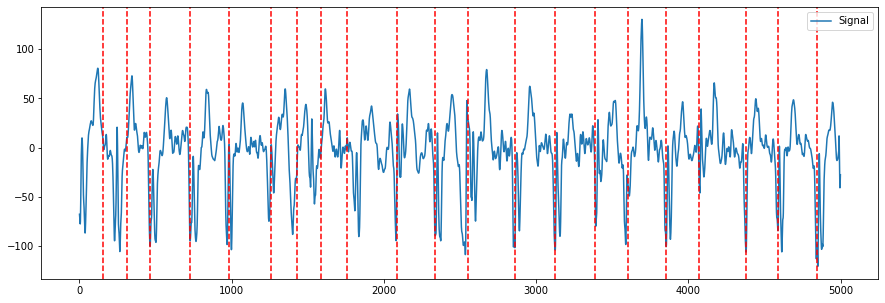

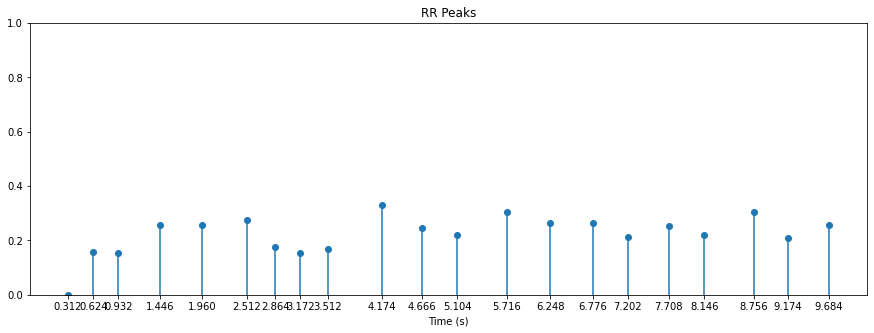

  7%|▋         | 1/15 [00:00<00:09,  1.44it/s]


**** MUSE_20180114_075026_69000 ****



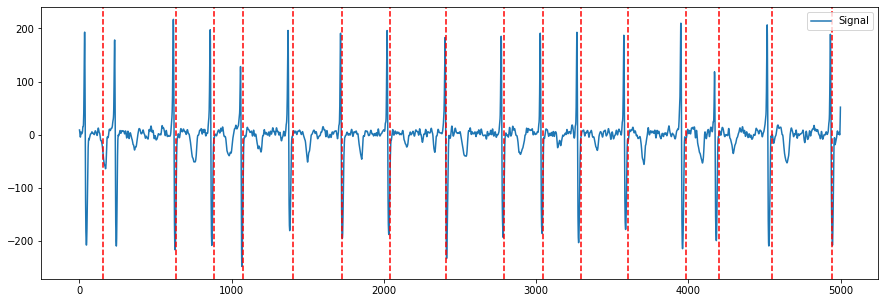

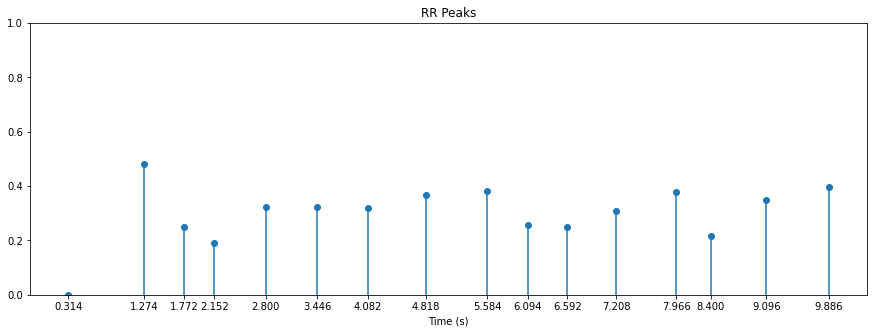

 13%|█▎        | 2/15 [00:01<00:09,  1.36it/s]


**** MUSE_20180113_133901_16000 ****



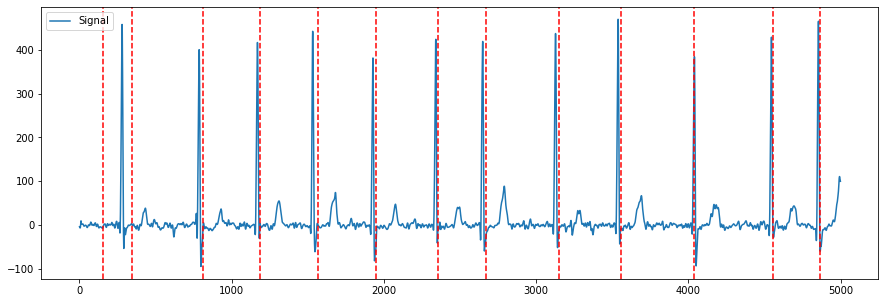

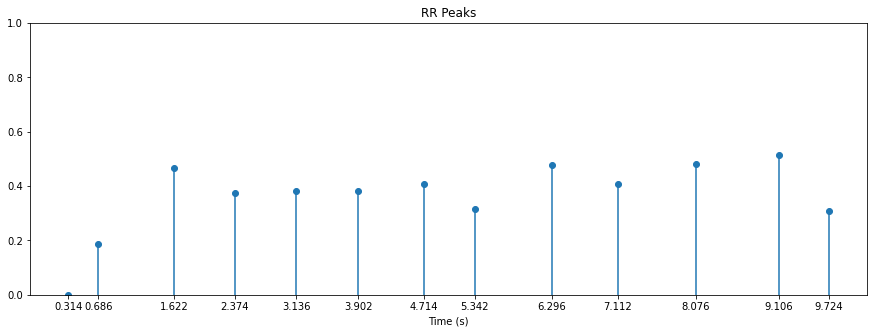

 20%|██        | 3/15 [00:02<00:09,  1.31it/s]


**** MUSE_20180116_123940_90000 ****



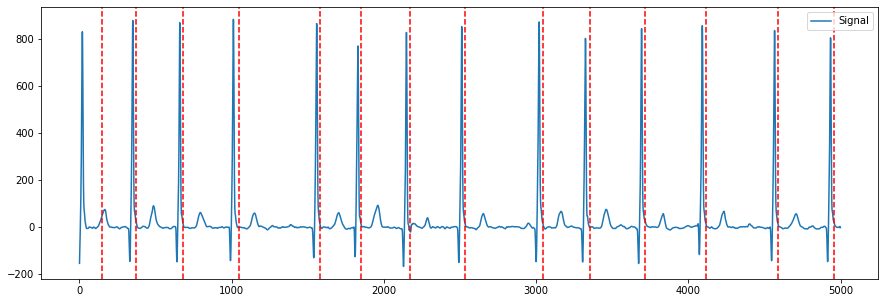

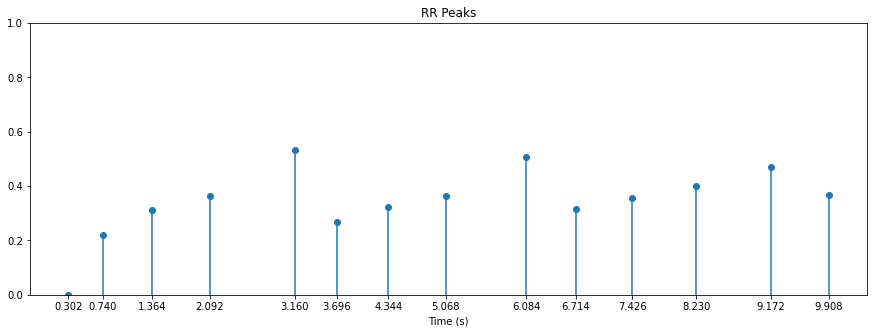

 27%|██▋       | 4/15 [00:02<00:07,  1.39it/s]


**** MUSE_20180114_075003_61000 ****



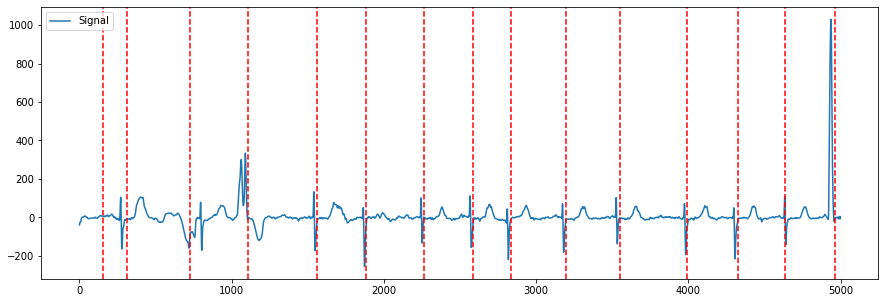

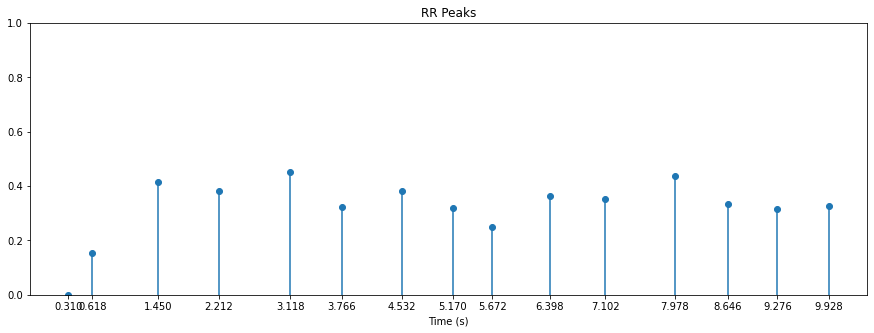

 33%|███▎      | 5/15 [00:03<00:06,  1.47it/s]


**** MUSE_20180114_073026_18000 ****



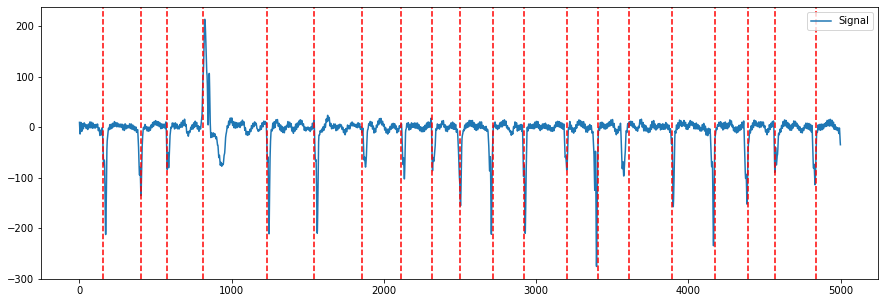

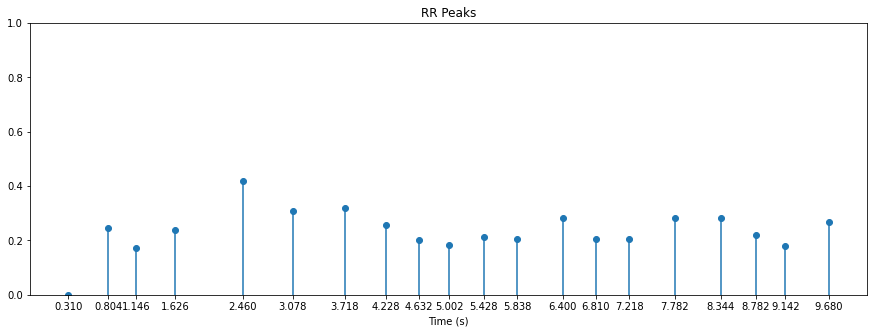

 40%|████      | 6/15 [00:04<00:06,  1.42it/s]


**** MUSE_20180113_074740_85000 ****



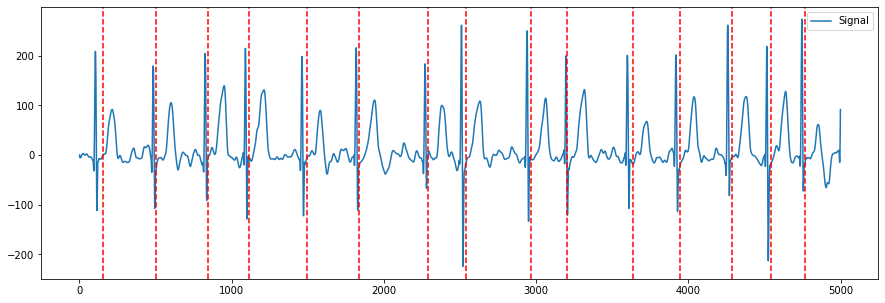

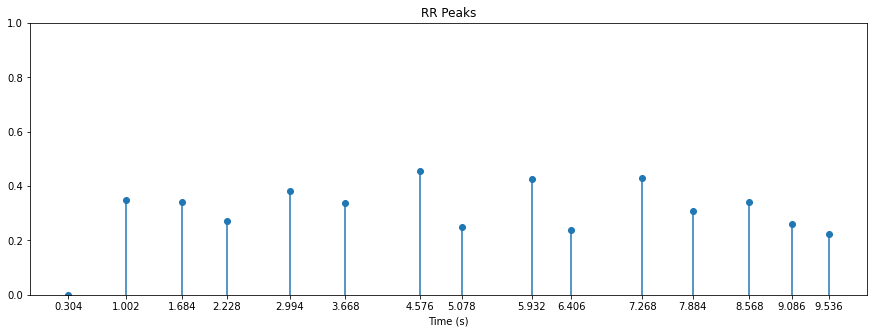

 47%|████▋     | 7/15 [00:05<00:06,  1.24it/s]


**** MUSE_20180114_132044_36000 ****



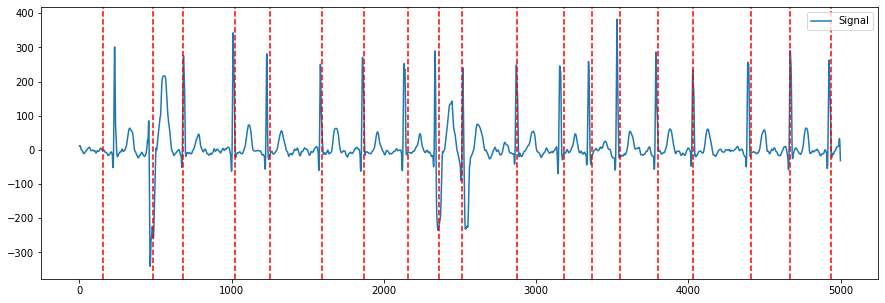

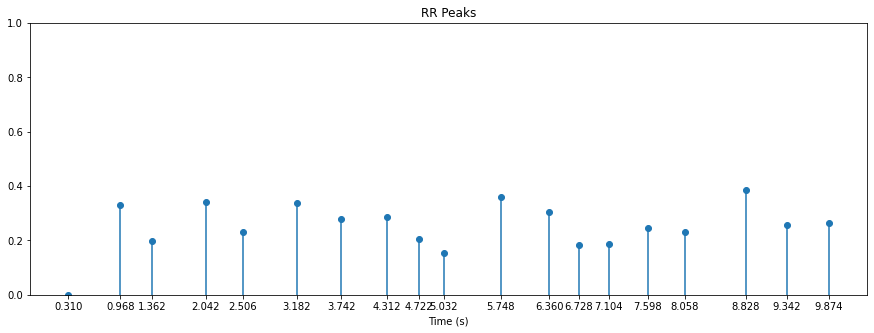

 53%|█████▎    | 8/15 [00:06<00:05,  1.23it/s]


**** MUSE_20180116_131337_59000 ****



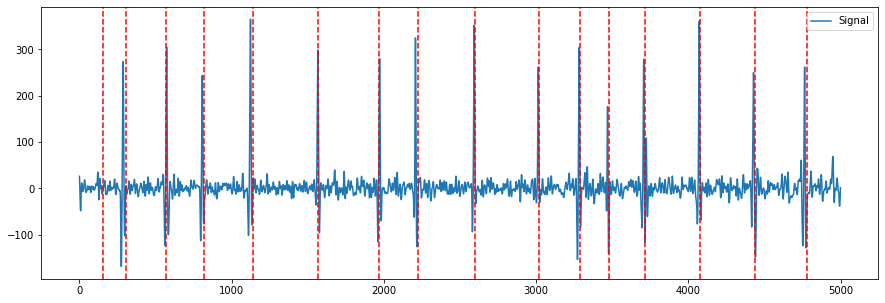

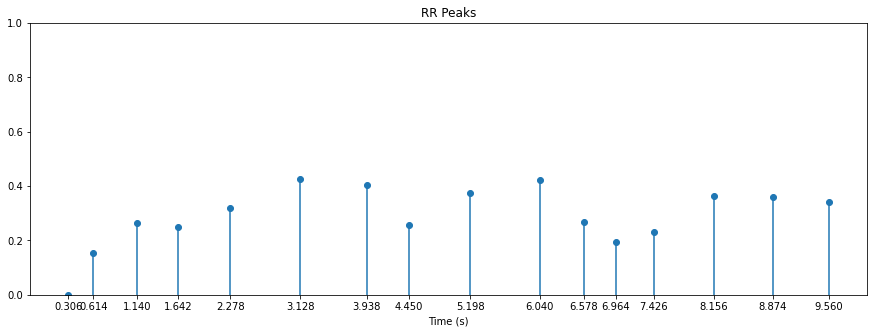

 60%|██████    | 9/15 [00:06<00:04,  1.22it/s]


**** MUSE_20180113_183351_27000 ****



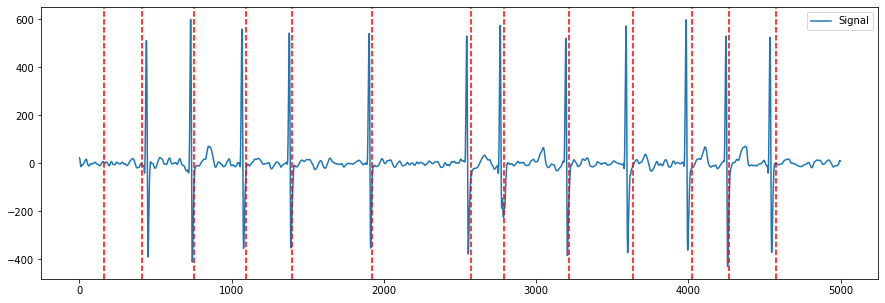

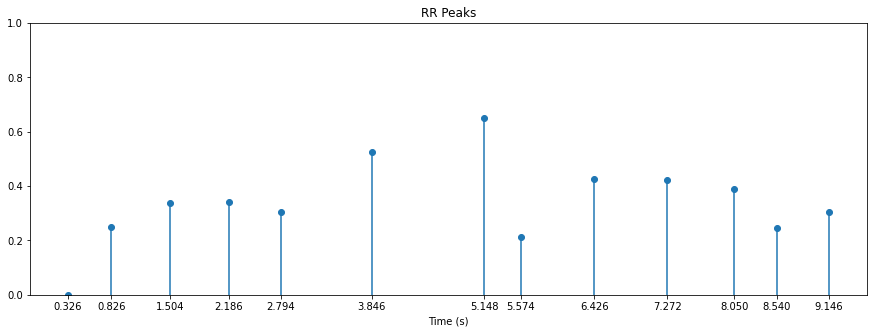

 67%|██████▋   | 10/15 [00:07<00:03,  1.30it/s]


**** MUSE_20180113_172948_90000 ****



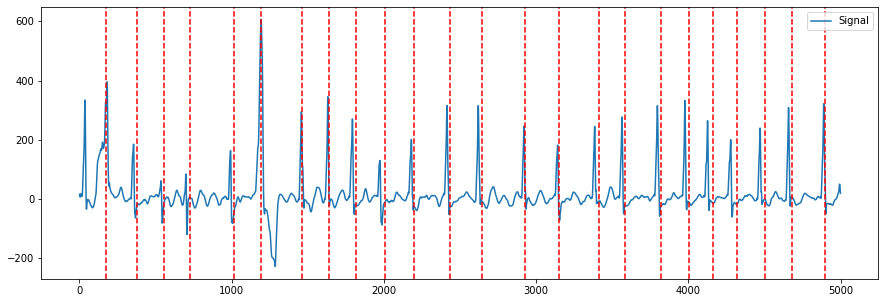

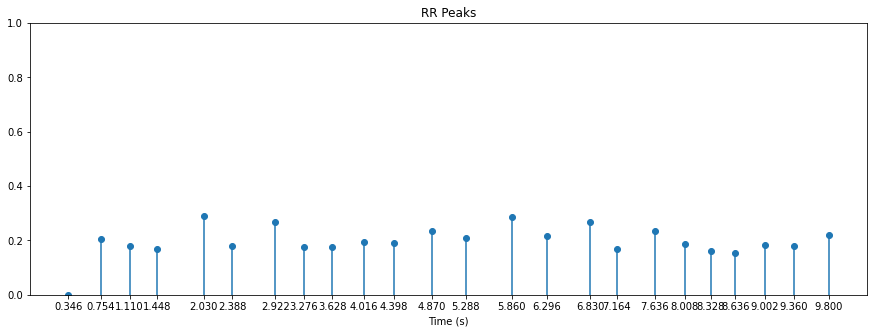

 73%|███████▎  | 11/15 [00:08<00:03,  1.12it/s]


**** MUSE_20180112_123750_49000 ****



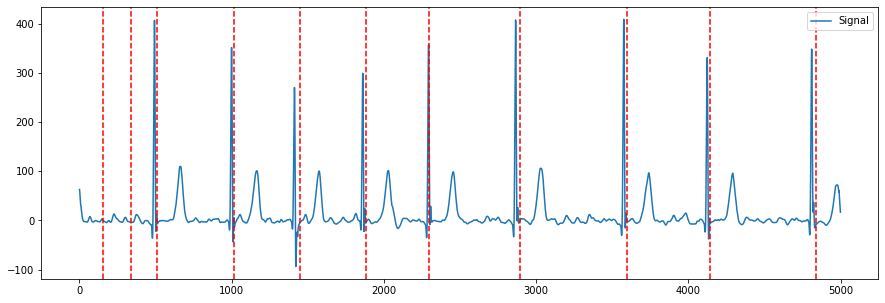

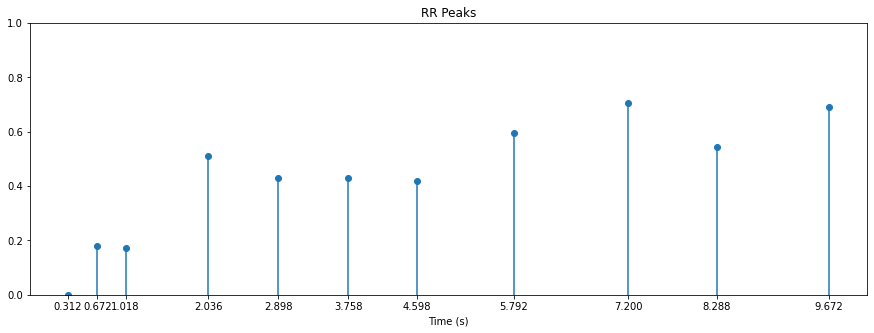

 80%|████████  | 12/15 [00:09<00:02,  1.11it/s]


**** MUSE_20180112_170307_12000 ****



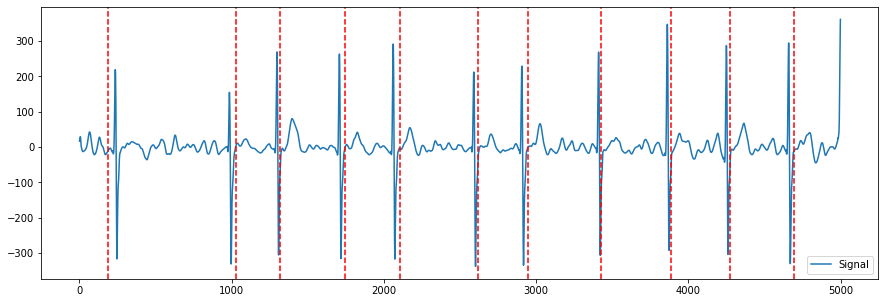

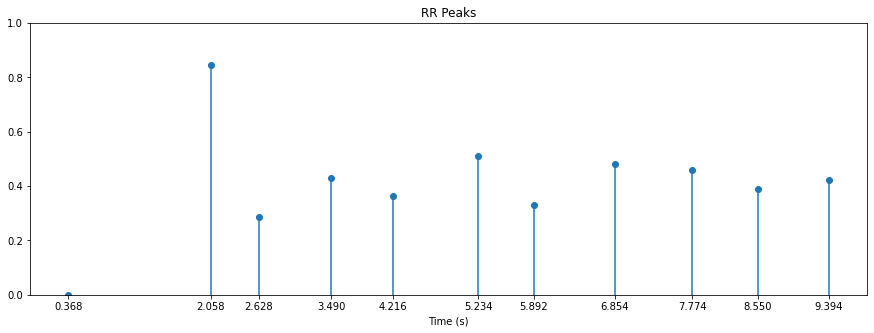

 87%|████████▋ | 13/15 [00:10<00:01,  1.29it/s]


**** MUSE_20180118_125855_69000 ****



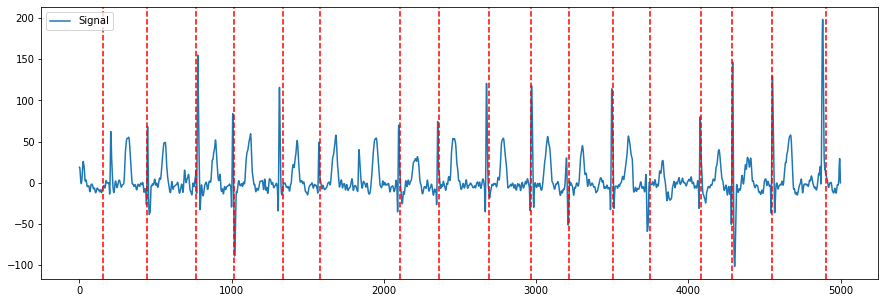

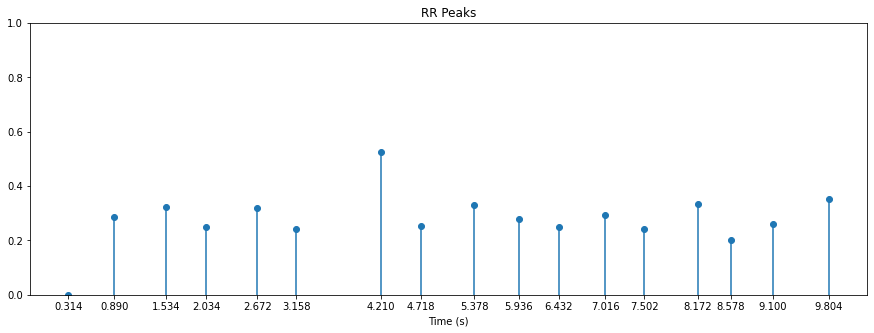

 93%|█████████▎| 14/15 [00:10<00:00,  1.31it/s]


**** MUSE_20180113_072453_82000 ****



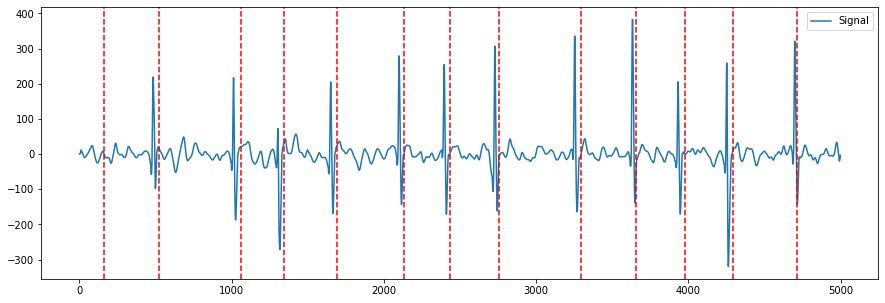

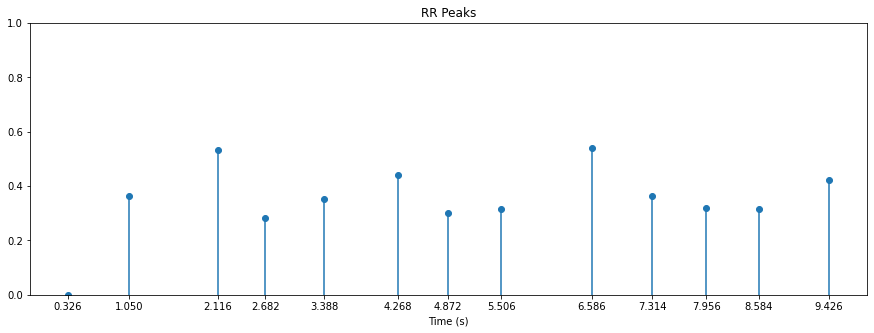

100%|██████████| 15/15 [00:11<00:00,  1.31it/s]

238

In [102]:
detect_r_peaks_pan_tompkins_detector(afib_files[:15],"stationary_wavelet_transform",True)

  0%|          | 0/15 [00:00<?, ?it/s]


**** MUSE_20180112_122850_57000 ****



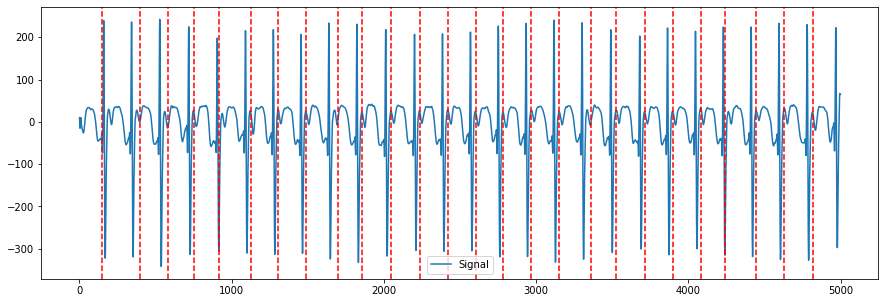

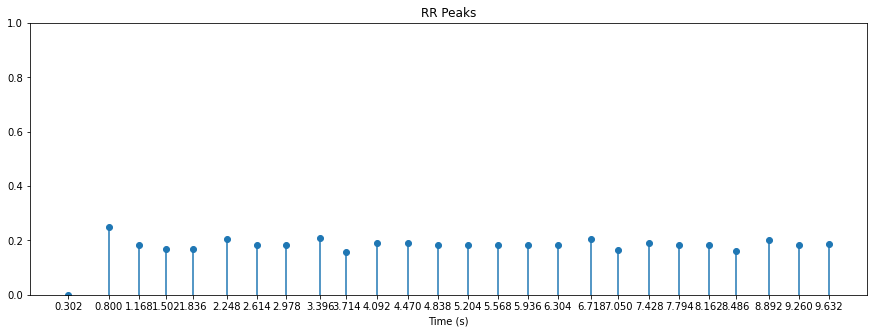

  7%|▋         | 1/15 [00:00<00:10,  1.35it/s]


**** MUSE_20180712_153037_41000 ****



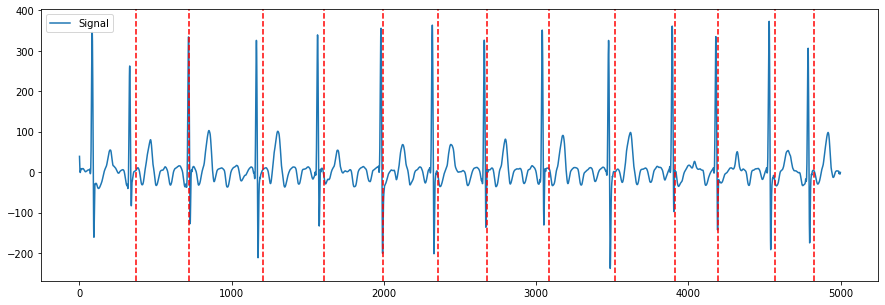

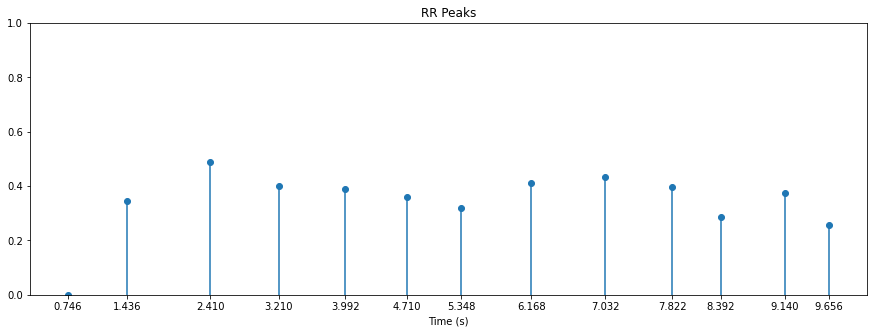

 13%|█▎        | 2/15 [00:01<00:09,  1.37it/s]


**** MUSE_20180114_134540_25000 ****



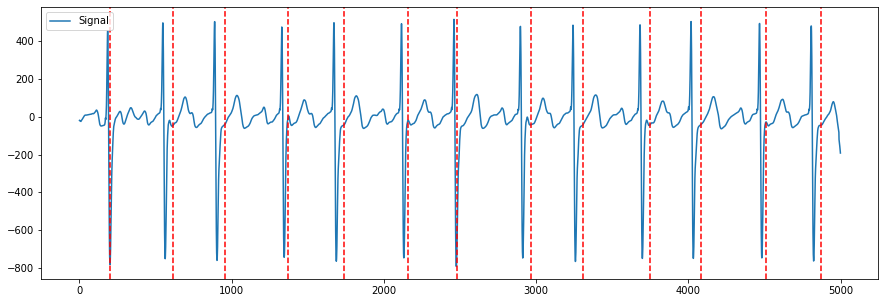

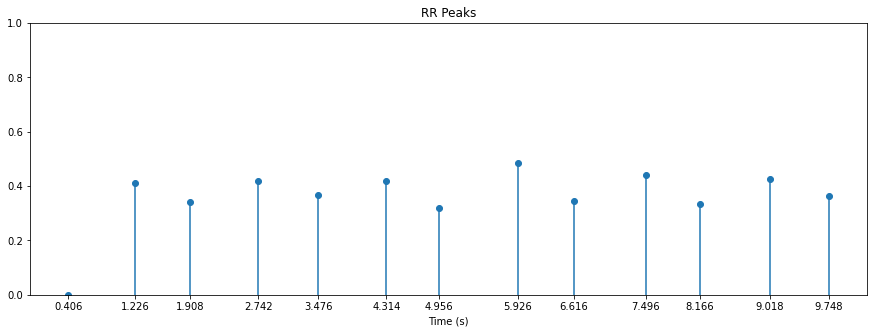

 20%|██        | 3/15 [00:02<00:09,  1.27it/s]


**** MUSE_20180712_152550_20000 ****



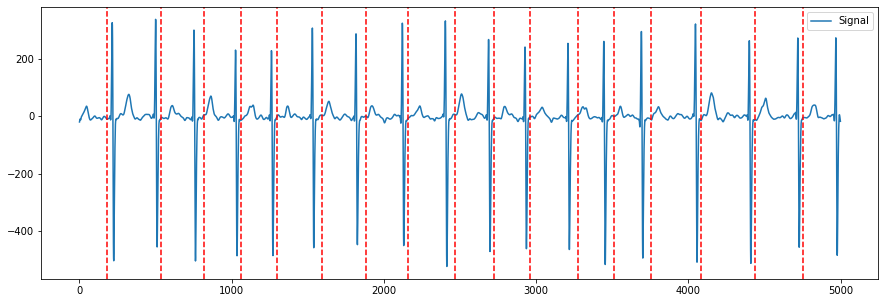

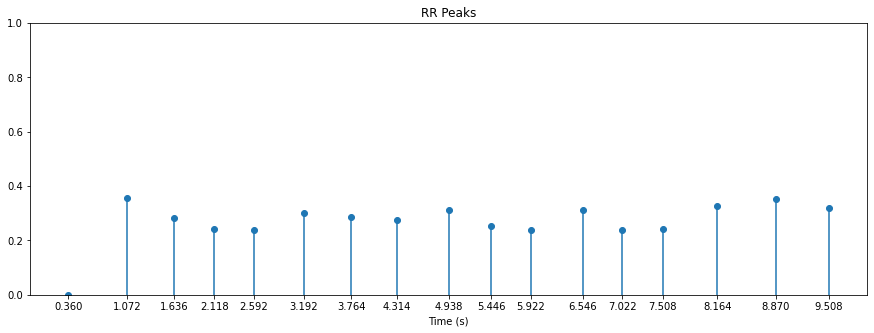

 27%|██▋       | 4/15 [00:03<00:08,  1.33it/s]


**** MUSE_20180111_163519_23000 ****



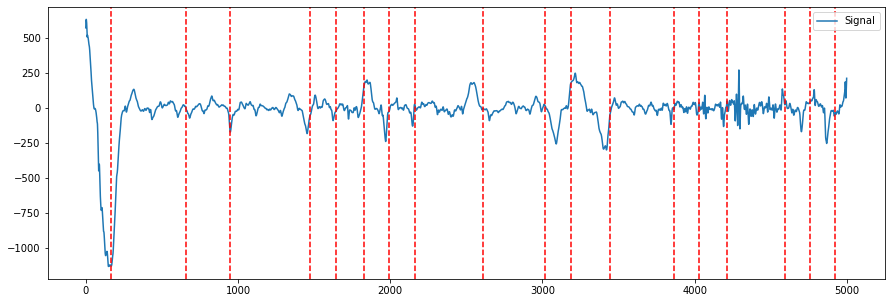

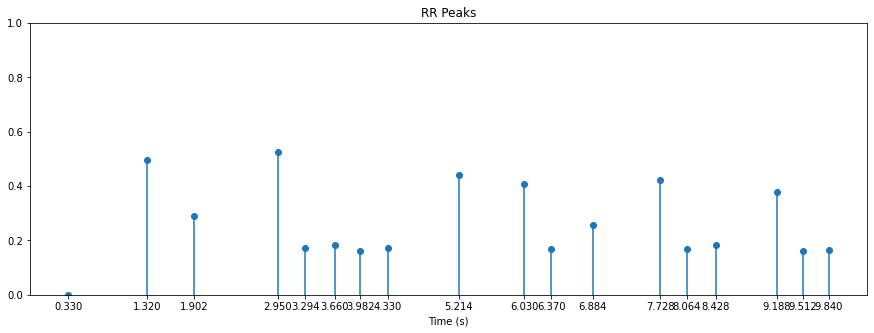

 33%|███▎      | 5/15 [00:03<00:07,  1.36it/s]


**** MUSE_20180115_134019_40000 ****



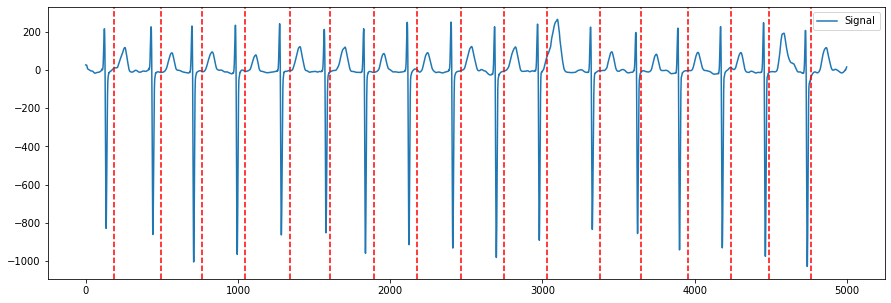

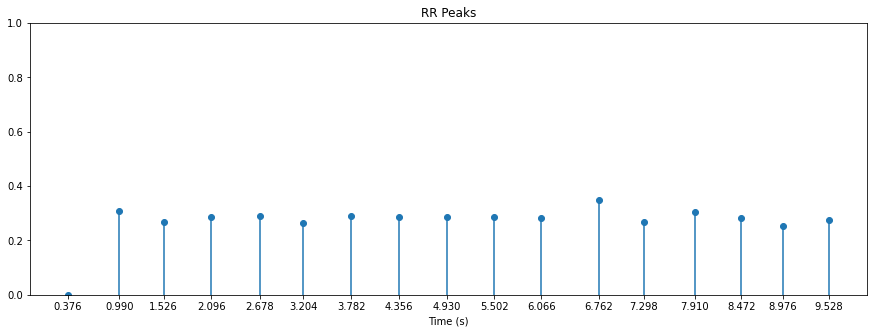

 40%|████      | 6/15 [00:04<00:06,  1.30it/s]


**** MUSE_20180712_154228_17000 ****



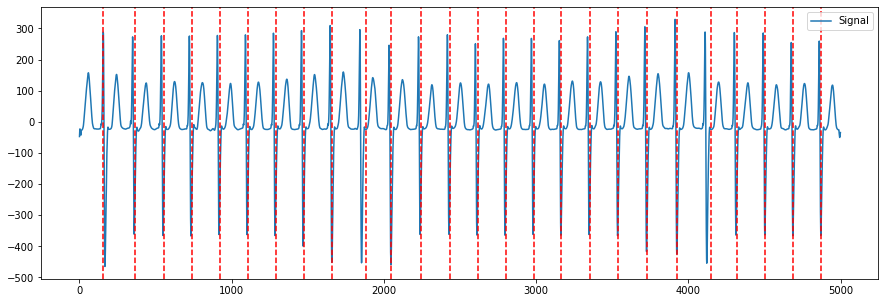

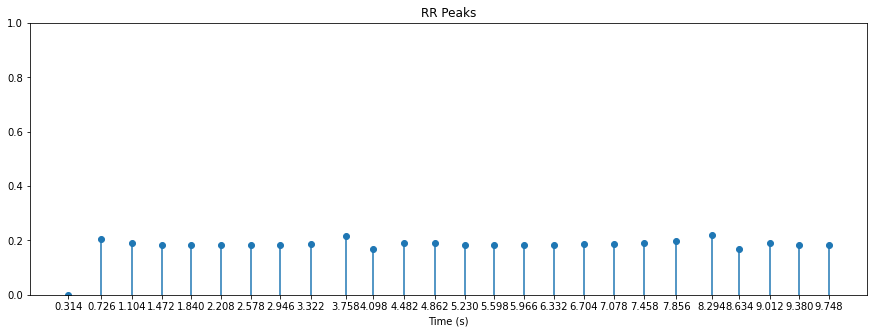

 47%|████▋     | 7/15 [00:05<00:07,  1.12it/s]


**** MUSE_20180712_154113_48000 ****



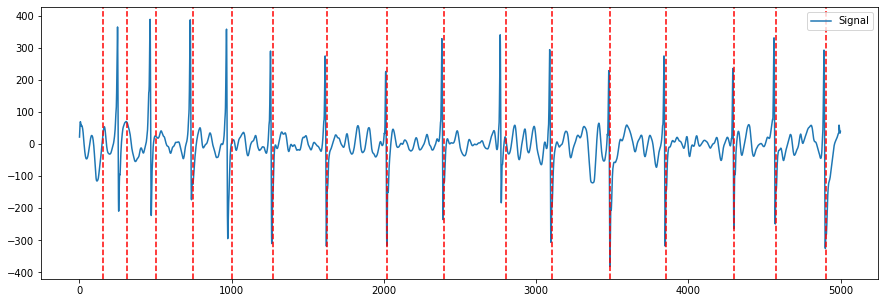

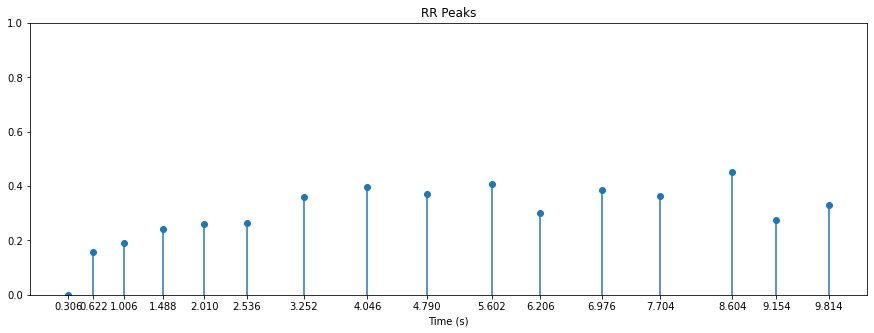

 53%|█████▎    | 8/15 [00:06<00:05,  1.29it/s]


**** MUSE_20180712_152959_84000 ****



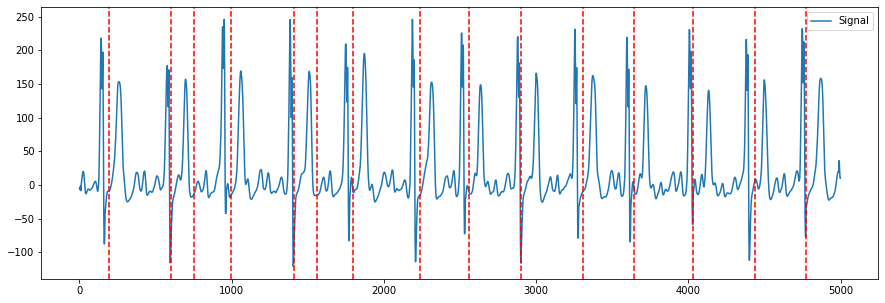

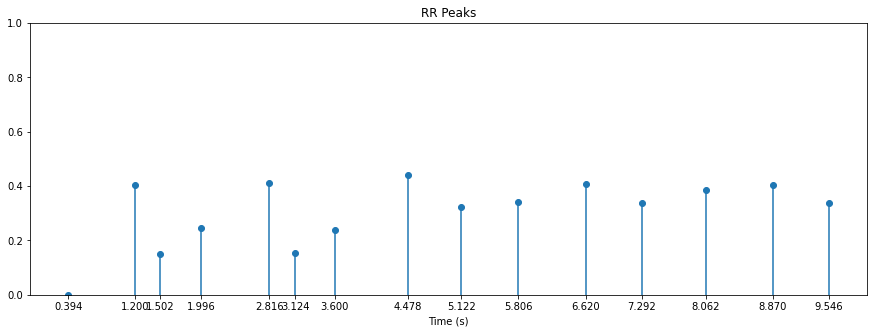

 60%|██████    | 9/15 [00:06<00:04,  1.46it/s]


**** MUSE_20180712_153336_23000 ****



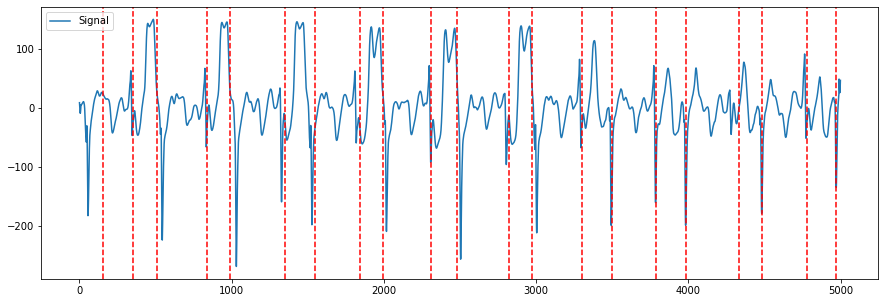

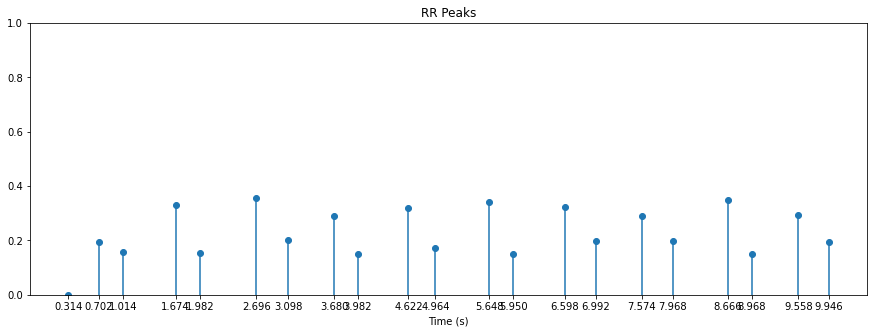

 67%|██████▋   | 10/15 [00:07<00:03,  1.56it/s]


**** MUSE_20180712_153820_89000 ****



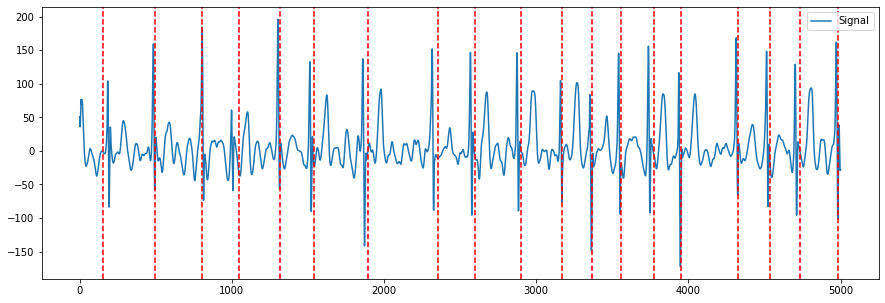

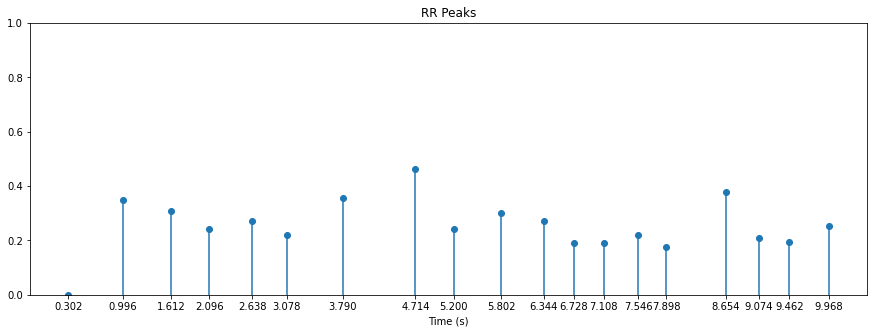

 73%|███████▎  | 11/15 [00:07<00:02,  1.65it/s]


**** MUSE_20180112_170310_29000 ****



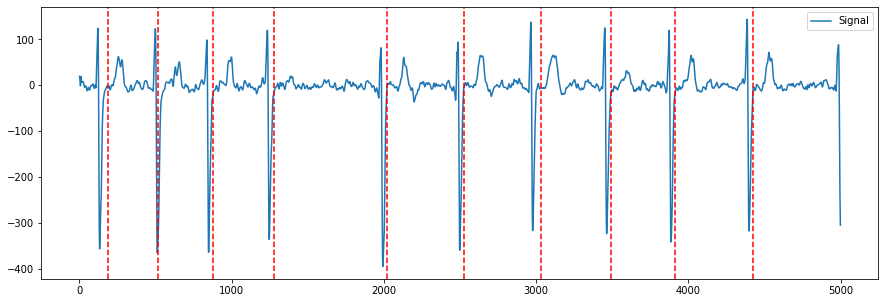

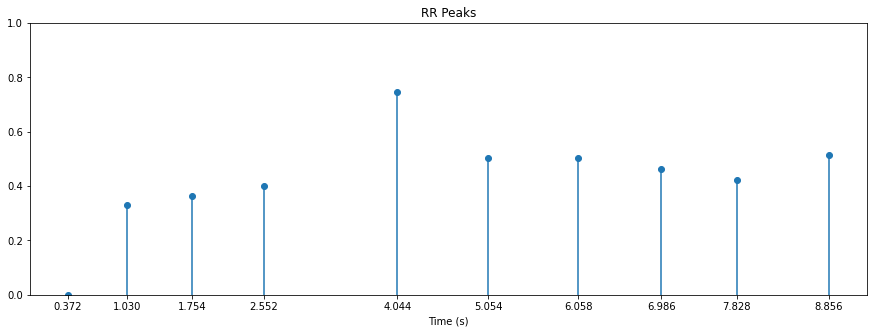

 80%|████████  | 12/15 [00:08<00:01,  1.76it/s]


**** MUSE_20180115_132129_14000 ****



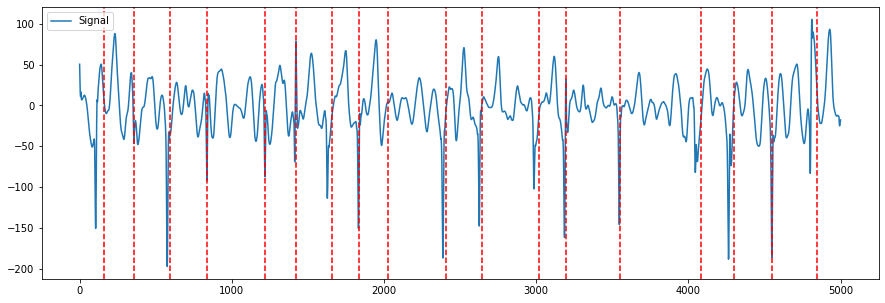

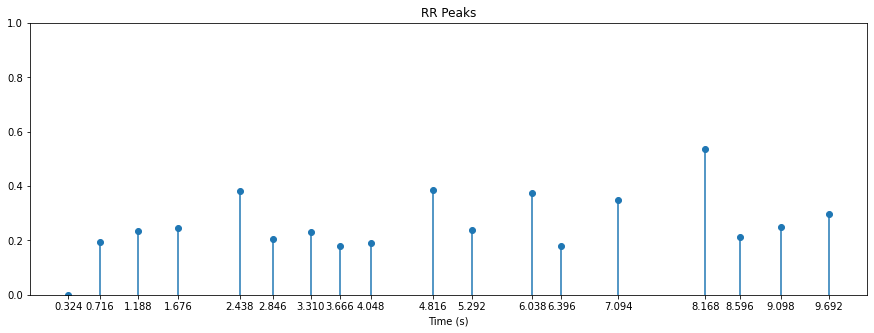

 87%|████████▋ | 13/15 [00:08<00:01,  1.80it/s]


**** MUSE_20180712_152458_58000 ****



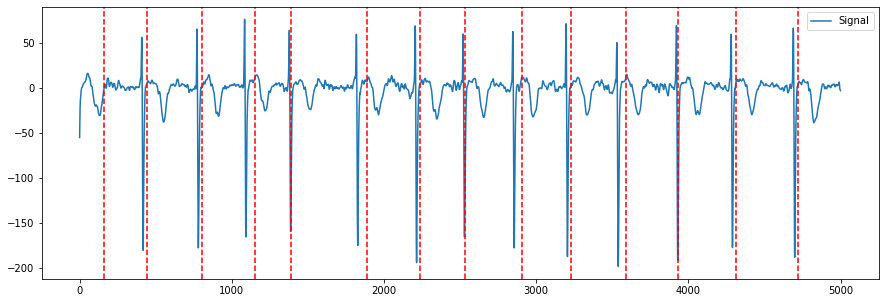

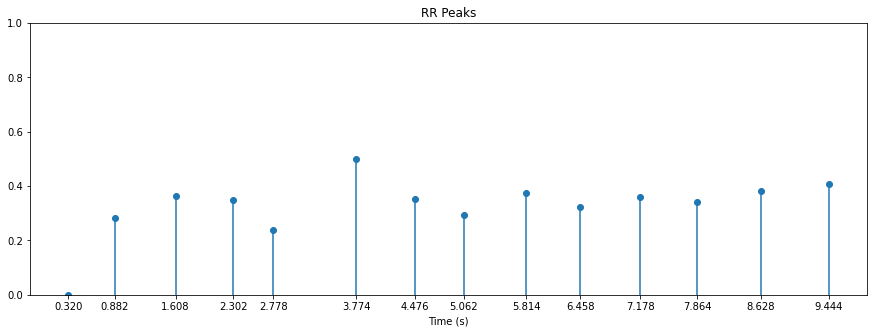

 93%|█████████▎| 14/15 [00:09<00:00,  1.86it/s]


**** MUSE_20180113_171652_90000 ****



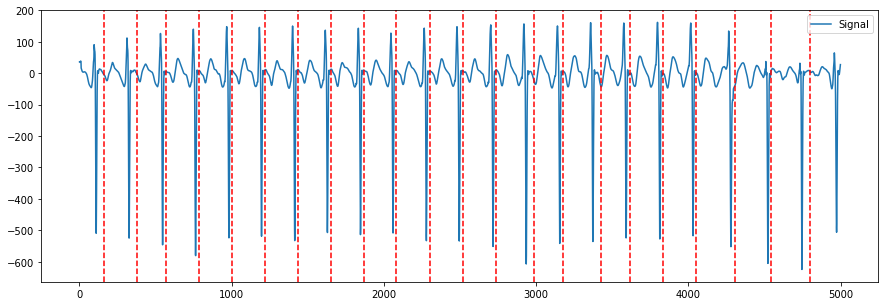

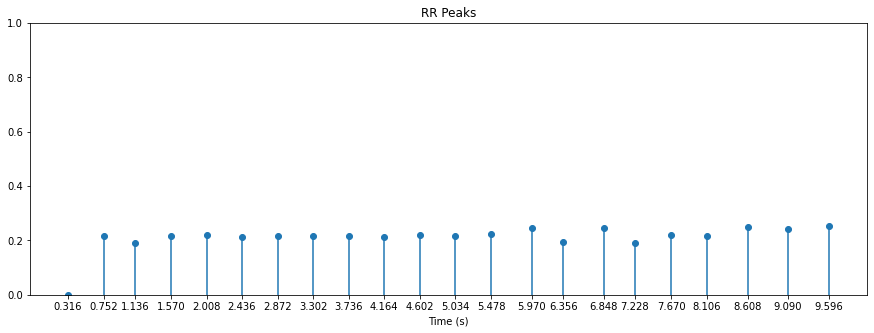

100%|██████████| 15/15 [00:10<00:00,  1.49it/s]

265

In [103]:
detect_r_peaks_pan_tompkins_detector(afl_files[:15],"pan_tompkins",True)

  0%|          | 0/15 [00:00<?, ?it/s]


**** MUSE_20180112_122850_57000 ****



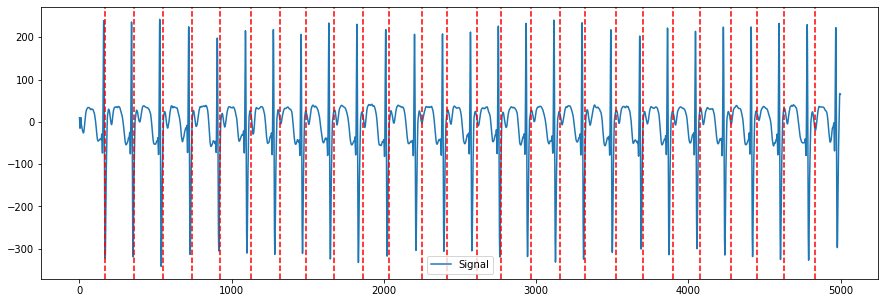

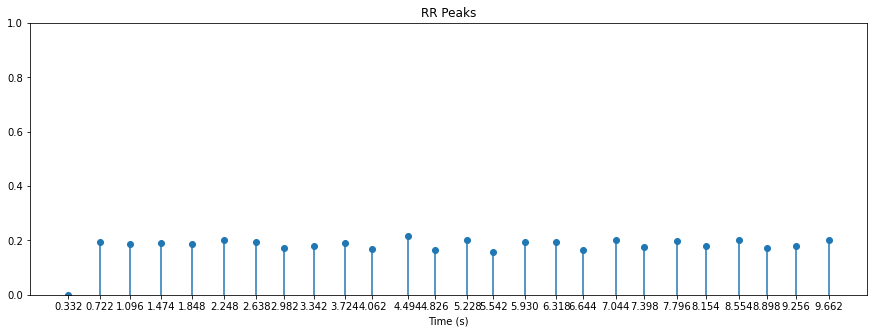

  7%|▋         | 1/15 [00:00<00:08,  1.73it/s]


**** MUSE_20180712_153037_41000 ****



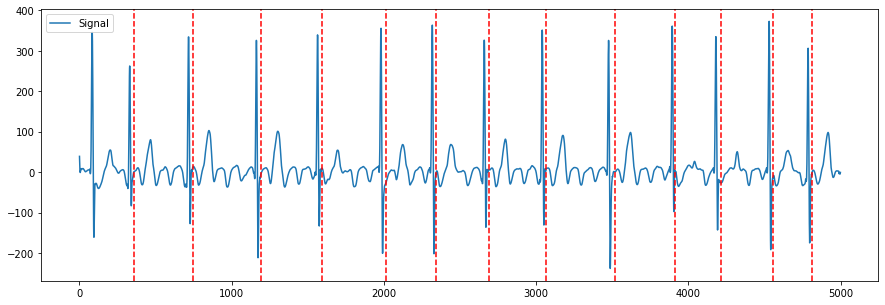

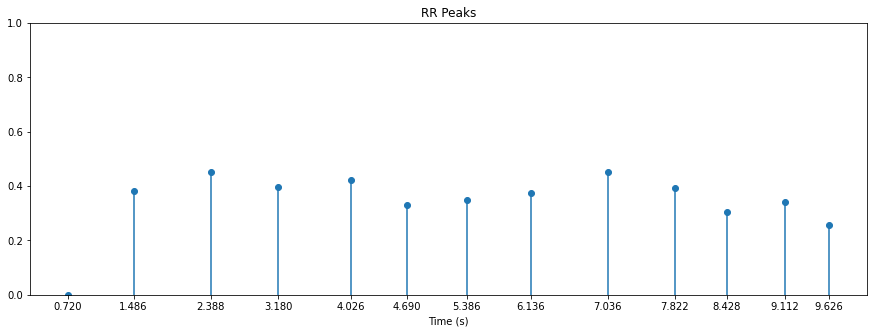

 13%|█▎        | 2/15 [00:01<00:06,  1.92it/s]


**** MUSE_20180114_134540_25000 ****



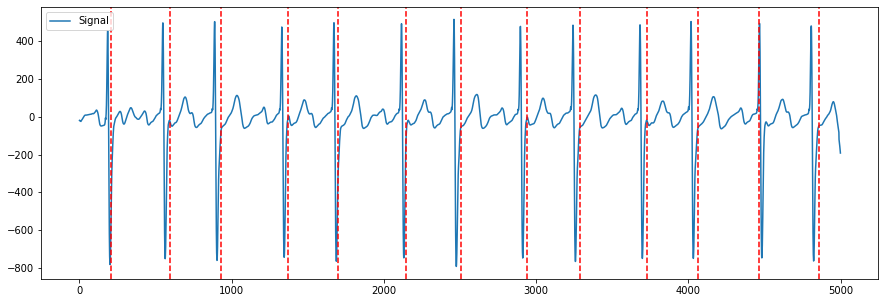

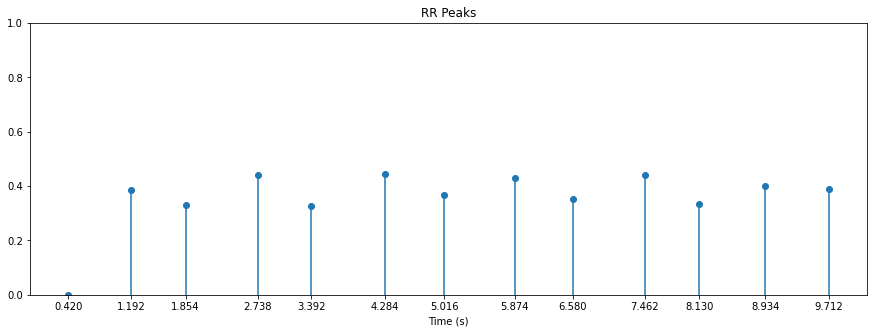

 20%|██        | 3/15 [00:01<00:06,  1.99it/s]


**** MUSE_20180712_152550_20000 ****



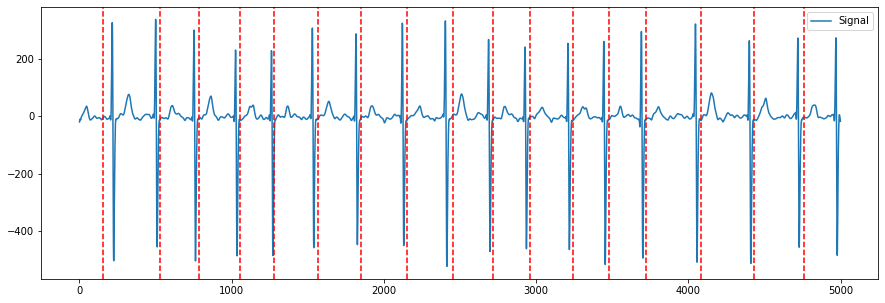

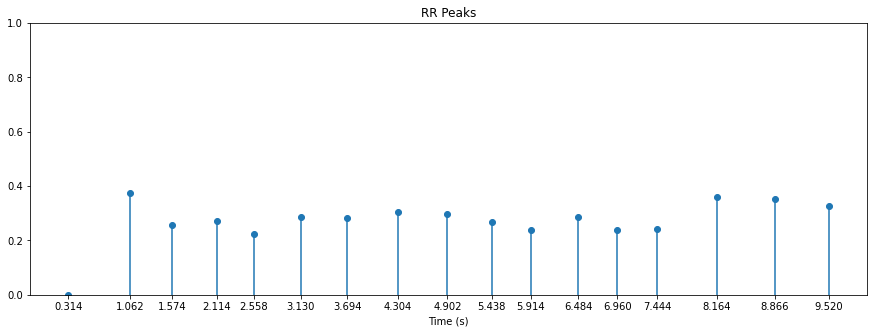

 27%|██▋       | 4/15 [00:02<00:05,  2.03it/s]


**** MUSE_20180111_163519_23000 ****



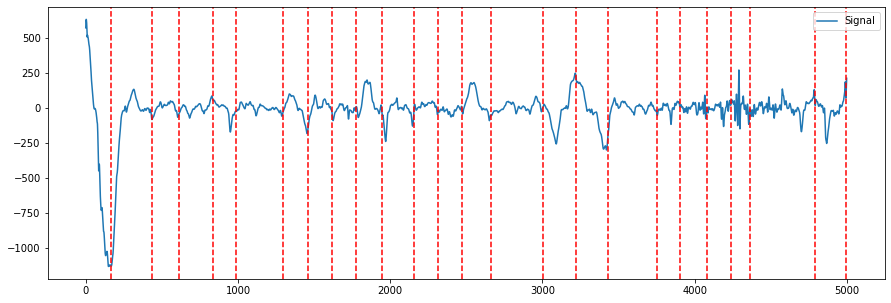

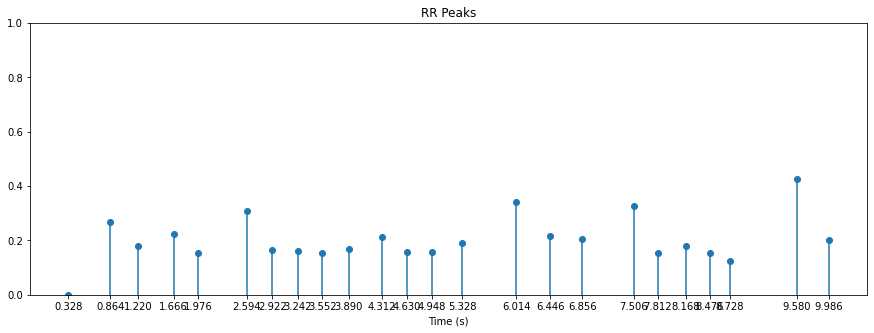

 33%|███▎      | 5/15 [00:02<00:05,  1.94it/s]


**** MUSE_20180115_134019_40000 ****



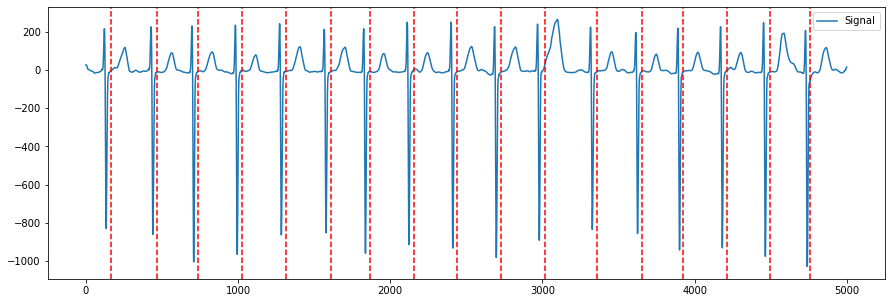

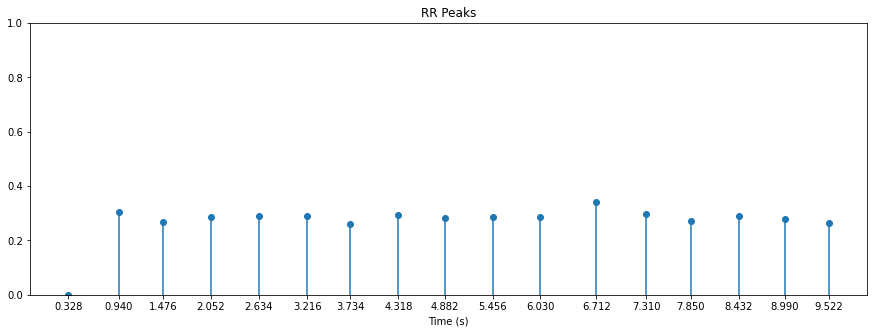

 40%|████      | 6/15 [00:03<00:04,  1.96it/s]


**** MUSE_20180712_154228_17000 ****



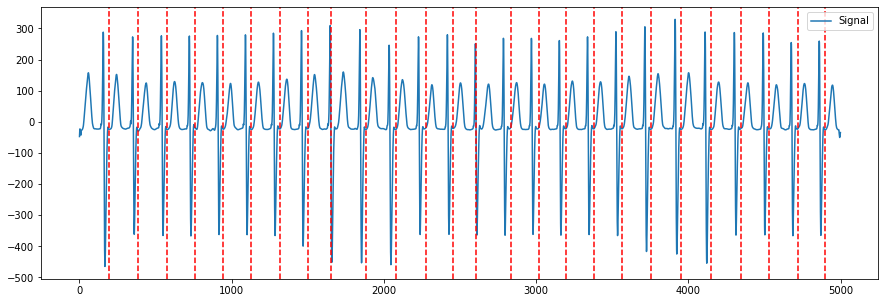

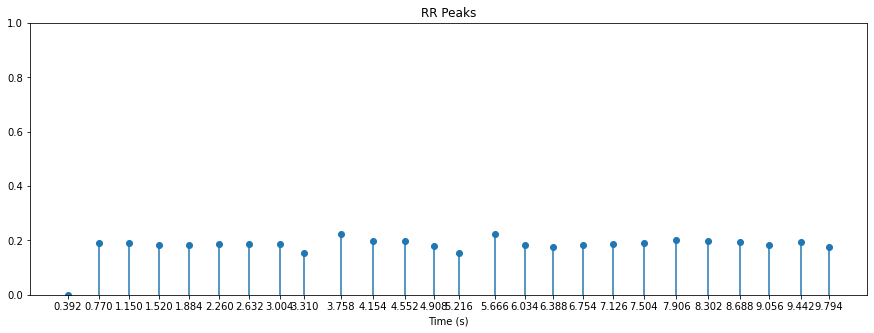

 47%|████▋     | 7/15 [00:03<00:04,  1.89it/s]


**** MUSE_20180712_154113_48000 ****



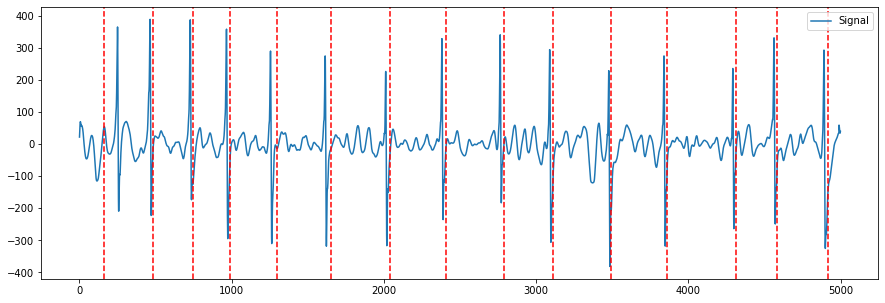

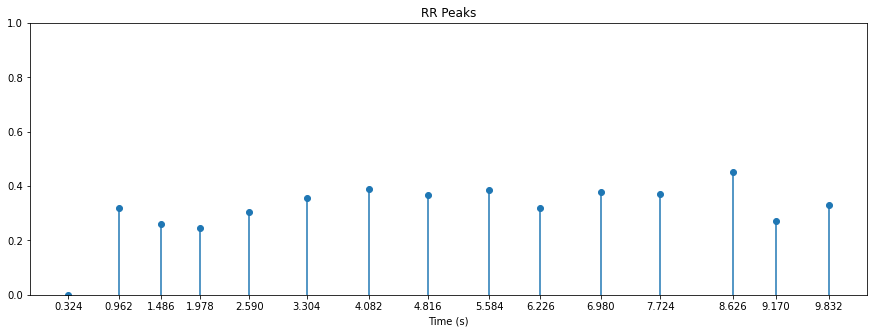

 53%|█████▎    | 8/15 [00:04<00:04,  1.68it/s]


**** MUSE_20180712_152959_84000 ****



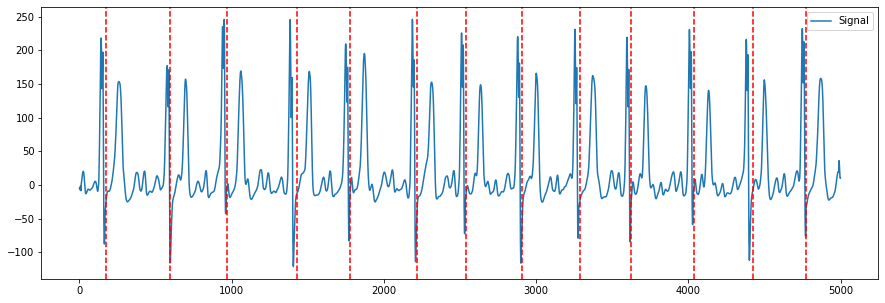

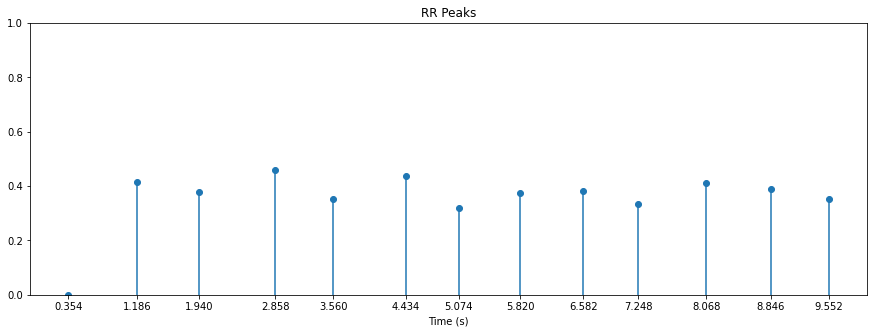

 60%|██████    | 9/15 [00:04<00:03,  1.79it/s]


**** MUSE_20180712_153336_23000 ****



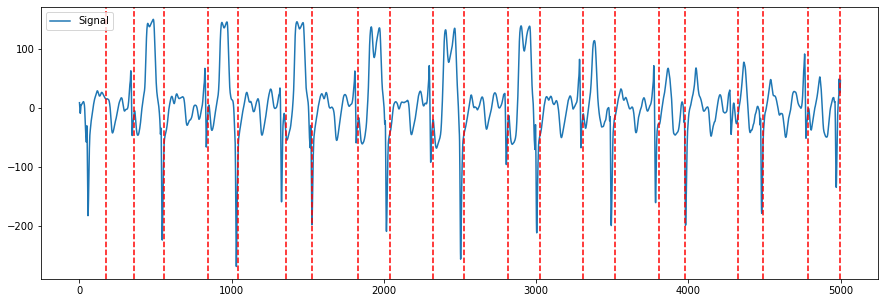

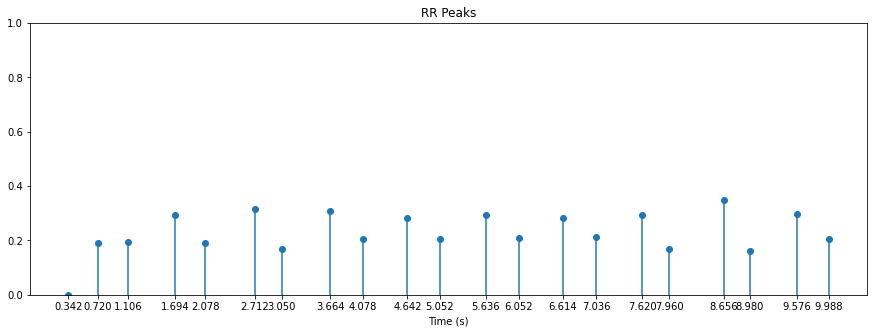

 67%|██████▋   | 10/15 [00:05<00:02,  1.80it/s]


**** MUSE_20180712_153820_89000 ****



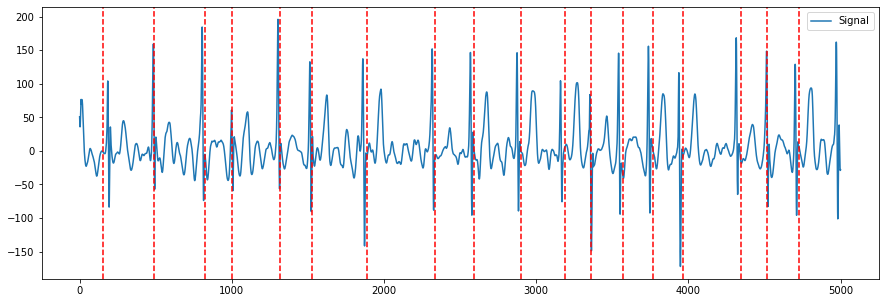

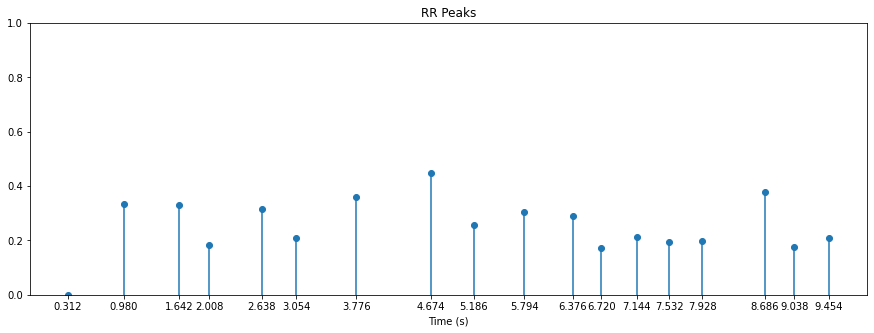

 73%|███████▎  | 11/15 [00:05<00:02,  1.84it/s]


**** MUSE_20180112_170310_29000 ****



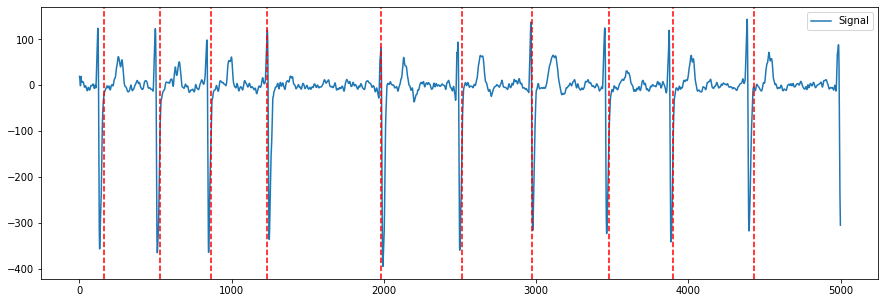

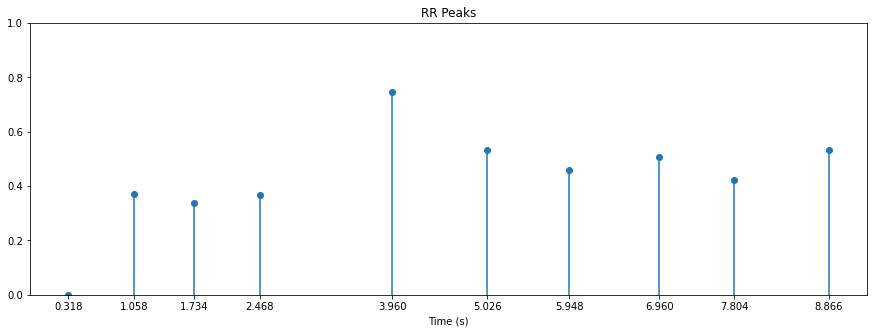

 80%|████████  | 12/15 [00:06<00:01,  1.93it/s]


**** MUSE_20180115_132129_14000 ****



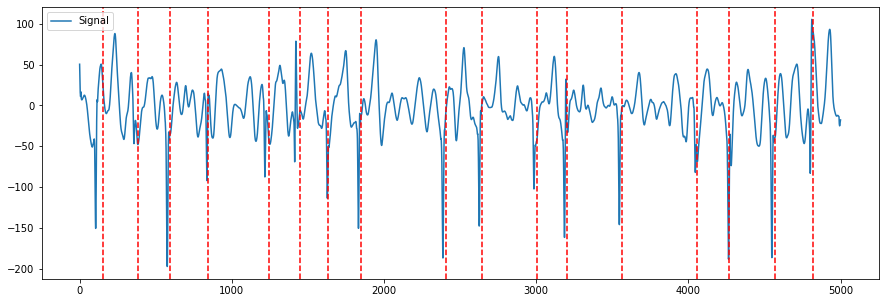

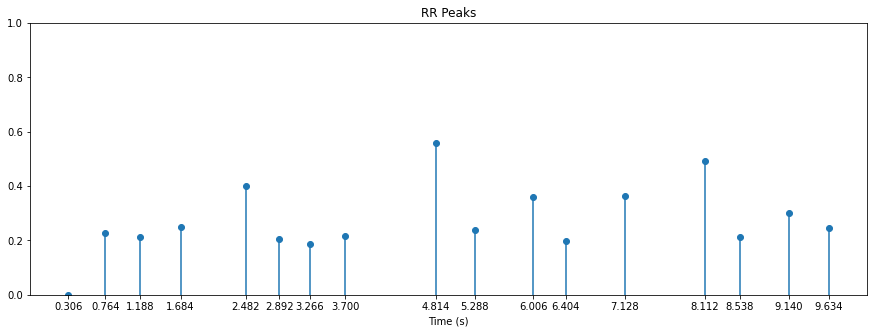

 87%|████████▋ | 13/15 [00:06<00:01,  1.91it/s]


**** MUSE_20180712_152458_58000 ****



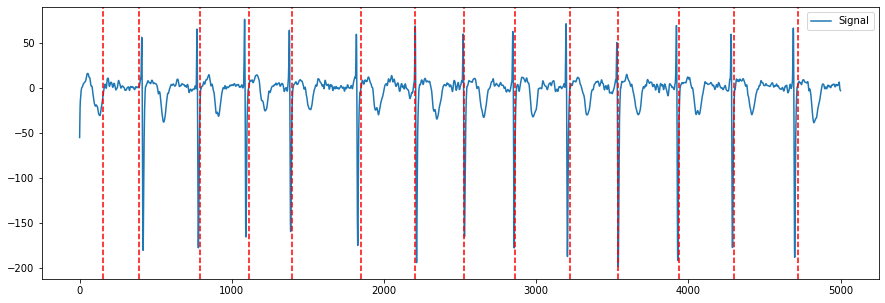

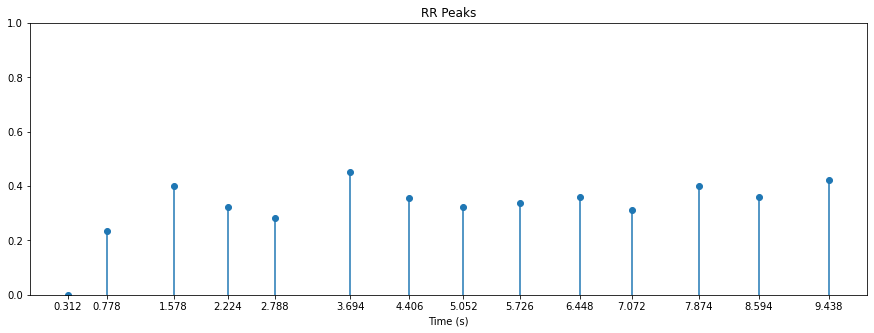

 93%|█████████▎| 14/15 [00:07<00:00,  1.94it/s]


**** MUSE_20180113_171652_90000 ****



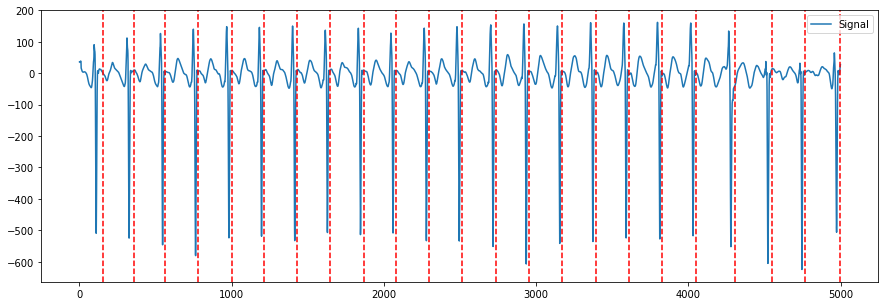

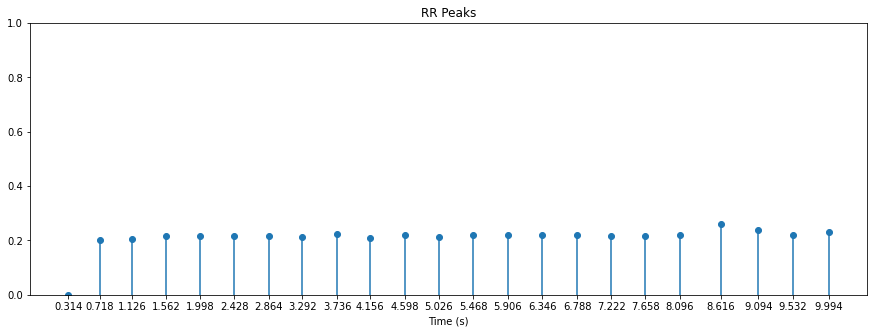

100%|██████████| 15/15 [00:07<00:00,  1.88it/s]

267

In [104]:
detect_r_peaks_pan_tompkins_detector(afl_files[:15],"stationary_wavelet_transform",True)